Britton Lab - 03/22/2024 <br>

Resetting the reference SOPs with which we calculate the PTF rotation matrices

<font color='red'>Author: Evan McClintock

In [1]:
import numpy as np
#from numpy import linalg as la
import matplotlib
#matplotlib.use('TkAgg')
import matplotlib.pyplot as plt
%matplotlib tk
#%matplotlib inline
import pandas as pd
#from datetime import timedelta
import allantools #https://allantools.readthedocs.io/en/latest/functions.html
import os
import scipy.stats as ss
import pickle
#from scipy.optimize import curve_fit
#import copy
#import math
#import time
#import pypolar.jones as jones #https://pypolar.readthedocs.io/en/latest/05-Jones-Examples.html
#import pypolar.mueller as mueller
#import pypolar.visualization as vis
#import py_pol
#from py_pol.jones_vector import Jones_vector, degrees #https://py-pol.readthedocs.io/en/master/source/tutorial/Drawing_docs.html
#from py_pol.stokes import Stokes, create_Stokes, degrees
#import seaborn as sns
#import plotly.graph_objs as go   # For plotting 3D vectors
#from plotly.offline import iplot
#import warnings

In [51]:
import importlib
import data_manager.dataset
import data_manager.stationary
import data_manager.switch
import data_manager.plotting
import data_manager.pairs
importlib.reload(data_manager.dataset)
importlib.reload(data_manager.stationary)
importlib.reload(data_manager.switch)
importlib.reload(data_manager.plotting)
importlib.reload(data_manager.pairs)
from data_manager.dataset import Dataset
from data_manager.stationary import StationarySet
from data_manager.switch import SwitchSet
import data_manager.plotting as P
from data_manager.pairs import IOPair

In [3]:
# plt.ioff() #https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.ioff.html
# plt.close('all')
BOLD_ON = "\033[1m"
BOLD_OFF = "\033[0m"
LAB = "/mnt/c/Users/2020n/Documents/Career/Locations/Britton Lab/"
DATA = LAB + "QWDM_Project/H1_Datasets/"

In [4]:
import sys
print(sys.executable)
print(sys.version)
print(sys.version_info)

/home/evanshaped/anaconda3/envs/britton2024envWSL/bin/python
3.12.2 | packaged by conda-forge | (main, Feb 16 2024, 20:50:58) [GCC 12.3.0]
sys.version_info(major=3, minor=12, micro=2, releaselevel='final', serial=0)


# Resetting reference SOPs

### Connector dataset 23-08-17

##### 1345 dataset

In [70]:
plt.ioff()
plt.close('all')

In [8]:
# filename = 'Datasets/Whole_setup/08-17/PAX_08-17_Connector_Orth_1_1345.csv'
# ds_test = Dataset(filename)
# ds_test.plot_raw(plot_param="S1",sample_range=(385,390))

Time range: min=390.004, max=7512.632
Determining change point ranges automatically...
Using change_point_range_1=(390.004, 490.004)
Using change_point_range_2=(3390.004, 3490.004)
=== performing change point detection ===
cp range: (390.004, 490.004)
using 6730 data entries
skipping 0 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (6730,)
computing range... ---> range = (1.70,1.75)
displaying jump_fig for switch parameter = s1



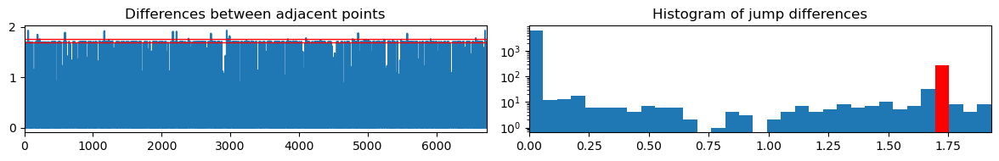



found width of 0.058 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (6730,)
computing range... ---> range = (0.83,0.89)
displaying jump_fig for switch parameter = s2



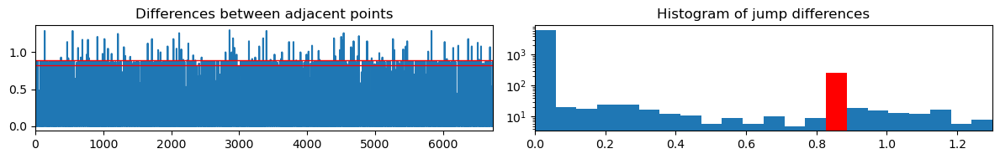



found width of 0.059 for s2
greater than prev width of 0.058 for s1
--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (6730,)
computing range... ---> range = (0.40,0.46)
displaying jump_fig for switch parameter = s3



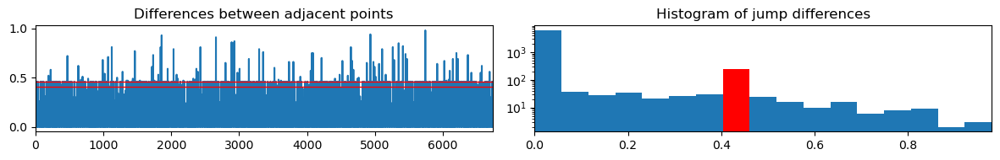



--- end of switch param: s3 ---

---> switch parameter found: s2 <---
finding differences within range = (0.83,0.89)
Jump points detected: 257
out of total: ~399.9

computing offset...


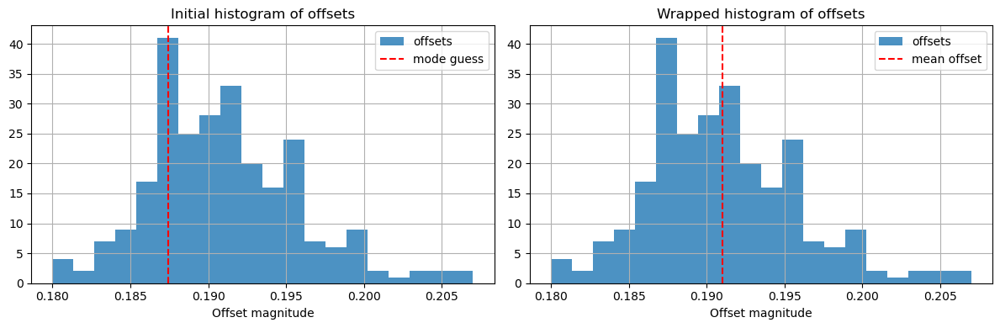



offset = 0.191 seconds
=== end change point detection ===
=== performing change point detection ===
cp range: (3390.004, 3490.004)
using 6836 data entries
skipping 203792 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (6836,)
computing range... ---> range = (1.64,1.70)
displaying jump_fig for switch parameter = s1



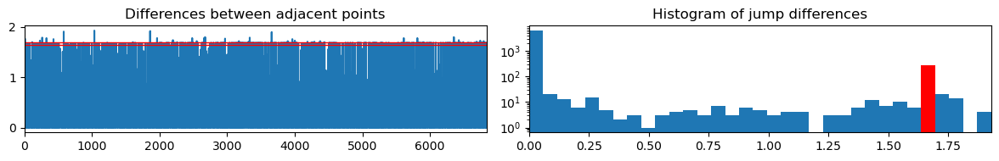



found width of 0.058 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (6836,)
computing range... ---> range = (0.93,0.99)
displaying jump_fig for switch parameter = s2



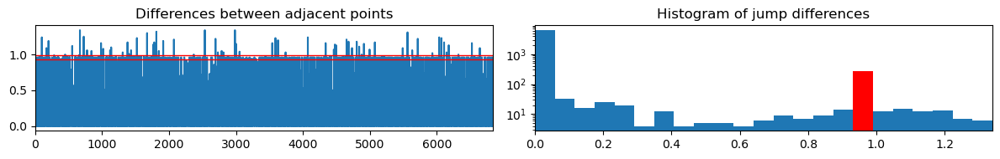



--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (6836,)
computing range... ---> range = (0.29,0.34)
displaying jump_fig for switch parameter = s3



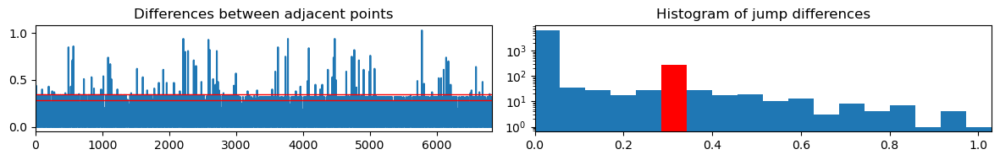



--- end of switch param: s3 ---

---> switch parameter found: s1 <---
finding differences within range = (1.64,1.70)
Jump points detected: 288
out of total: ~400.0

computing offset...


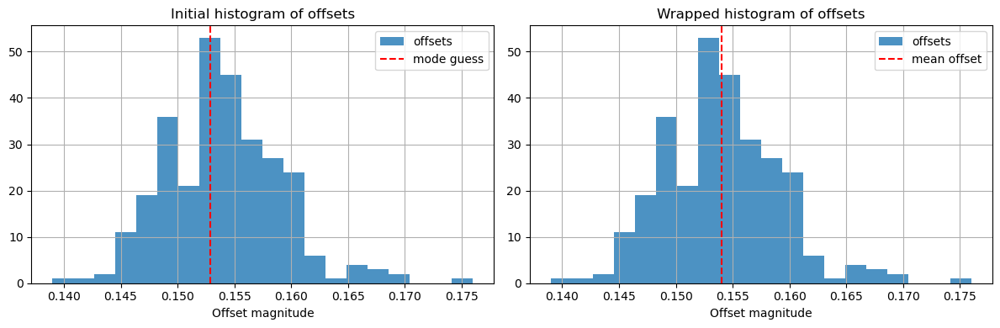



offset = 0.154 seconds
=== end change point detection ===
Nominal Switch Time = 0.2500000
Offset change of -0.037 seconds over 12000.0 switches
Corrected Switch Time = 0.2499969


In [31]:
filename = 'Datasets/Whole_setup/08-17/PAX_08-17_Connector_Orth_1_1345.csv'
#ds = SwitchSet(filename, skip_default_signal_baseline=14)
#ds.find_switches(nominal_switch_rate=2, change_point_range_1=(15,50), print_process=True)
ds_1345 = SwitchSet(filename, skip_default_signal_baseline=390)
ds_1345.find_switches(nominal_switch_rate=2, print_process=True)

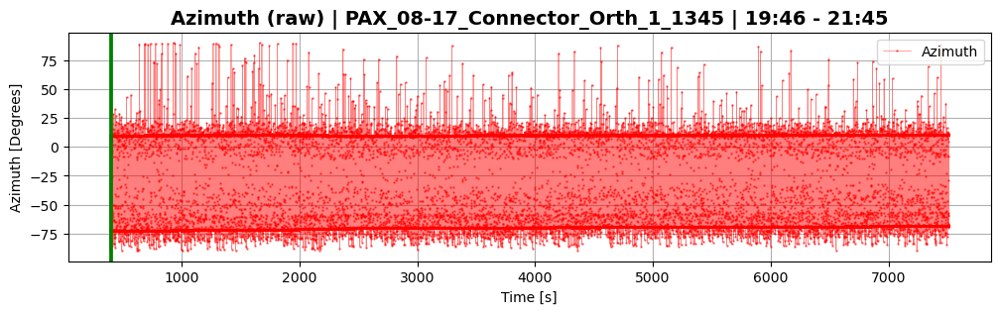

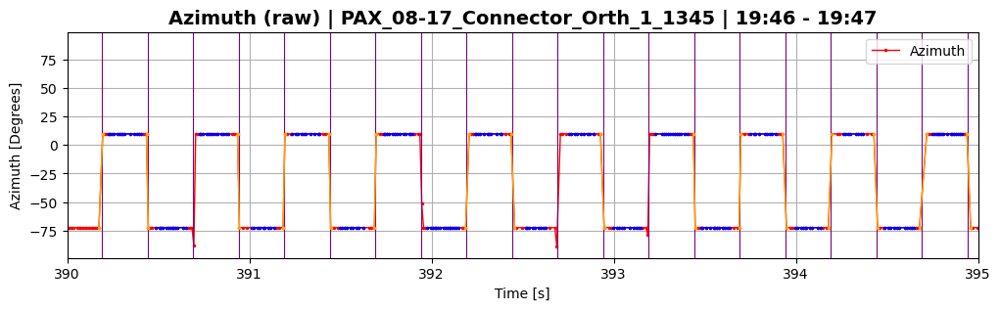

In [32]:
ds_1345.plot_raw(plot_param='Azimuth', sample_range=(390,395),plot_switch=True,plot_jumps=True,plot_valid=True,plot_avg=True)

In [33]:
ds_1345.average_data(print_process=True)

=== starting average_data ===
averaging data... Done
Dropped 38 observations with <4 points (out of total 28353 observations)

--- interpolating data ---
length before: 14158
length after: 14245
87 total added
--- end interpolating data ---

--- interpolating data ---
length before: 14157
length after: 14243
86 total added
--- end interpolating data ---
Signal 1 size=14243	Signal 1 range: t=(390.57,7511.48)
Signal 2 size=14245	Signal 2 range: t=(390.32,7512.23)
=== end average_data ===


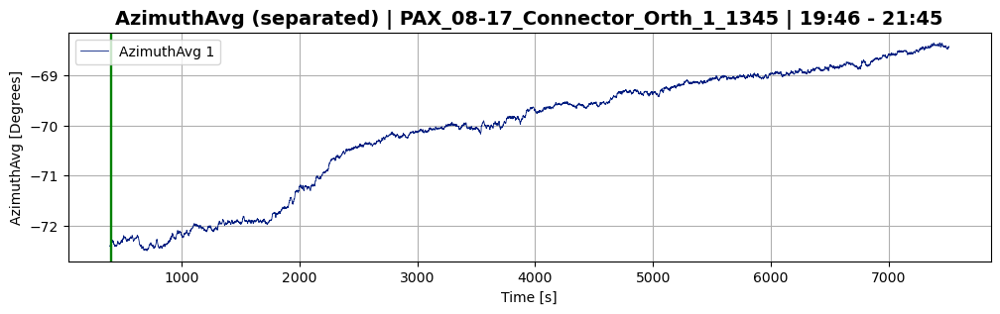

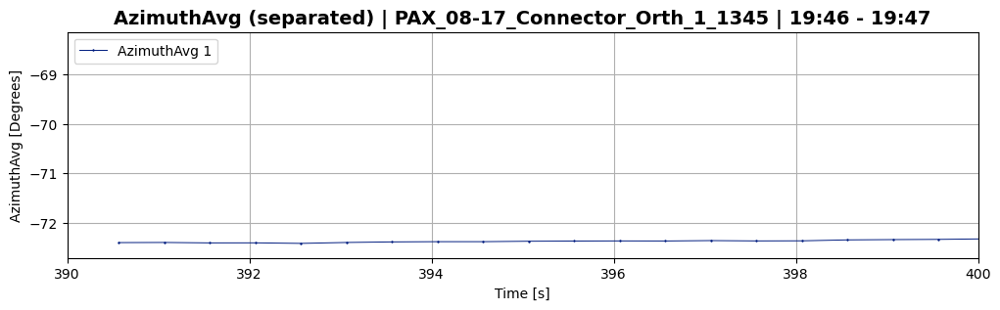

In [34]:
ds_1345.plot_separated(plot_param='AzimuthAvg',plot_signal=1,sample_range=(390,400))

In [35]:
reset_times_1345 = ds_1345.calc_stokes_ptf(reference=None, angle_threshold_deg=2, print_process=True);

Using "resetting reference SOPs" approach with threshold = 2.0 degrees
Reference matrix was reset 10 times
Reset at time t=570.94
Reset at time t=912.44
Reset at time t=1518.43
Reset at time t=1919.42
Reset at time t=2211.42
Reset at time t=2392.92
Reset at time t=3273.91
Reset at time t=4292.89
Reset at time t=6339.87
Reset at time t=7395.36


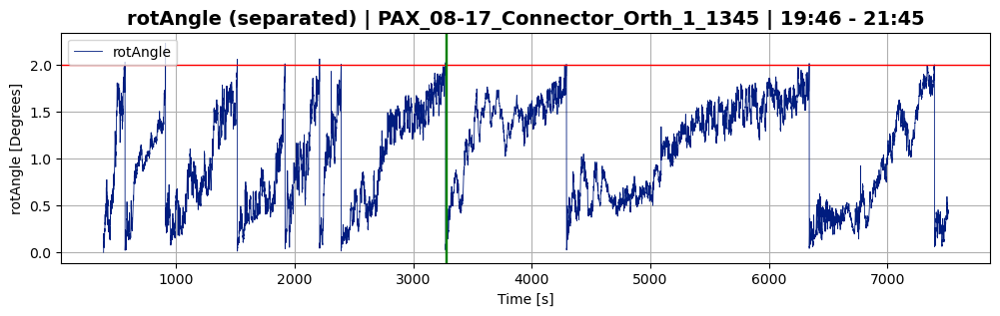

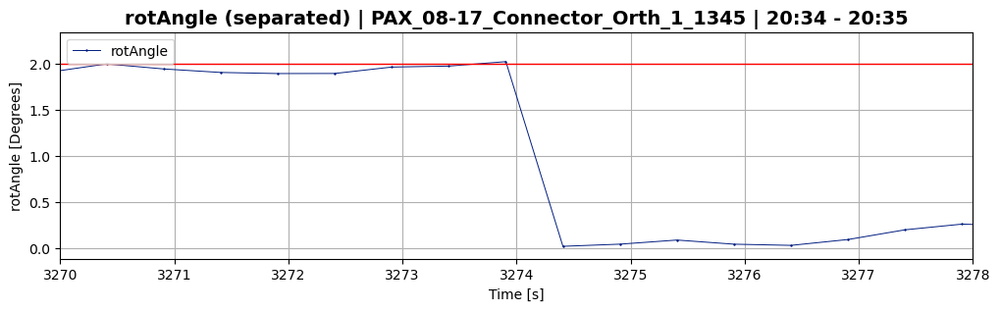

In [36]:
ds_1345.plot_separated(plot_param='rotAngle',plot_signal=1,sample_range=(3270,3278))

##### 1560 dataset

Time range: min=390.006, max=7513.214
Determining change point ranges automatically...
Using change_point_range_1=(390.006, 490.006)
Using change_point_range_2=(3390.006, 3490.006)
=== performing change point detection ===
cp range: (390.006, 490.006)
using 5473 data entries
skipping 0 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (5473,)
computing range... ---> range = (0.71,0.77)
displaying jump_fig for switch parameter = s1



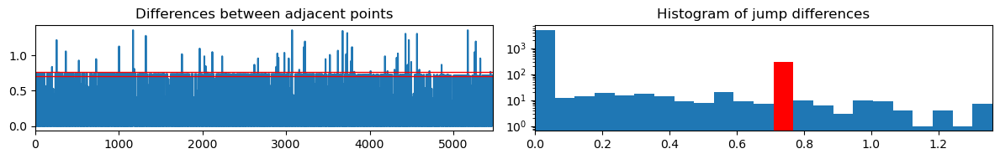



found width of 0.059 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (5473,)
computing range... ---> range = (1.81,1.87)
displaying jump_fig for switch parameter = s2



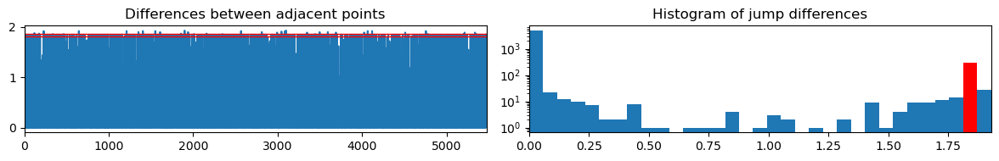



--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (5473,)
computing range... ---> range = (0.06,0.11)
displaying jump_fig for switch parameter = s3



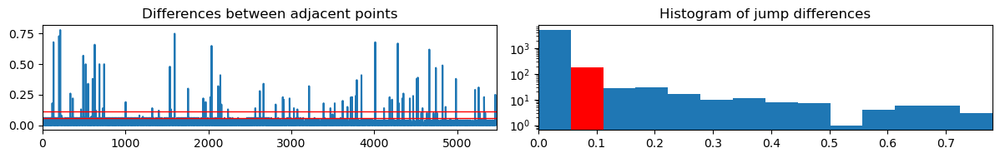



--- end of switch param: s3 ---

---> switch parameter found: s1 <---
finding differences within range = (0.71,0.77)
Jump points detected: 296
out of total: ~400.0

computing offset...


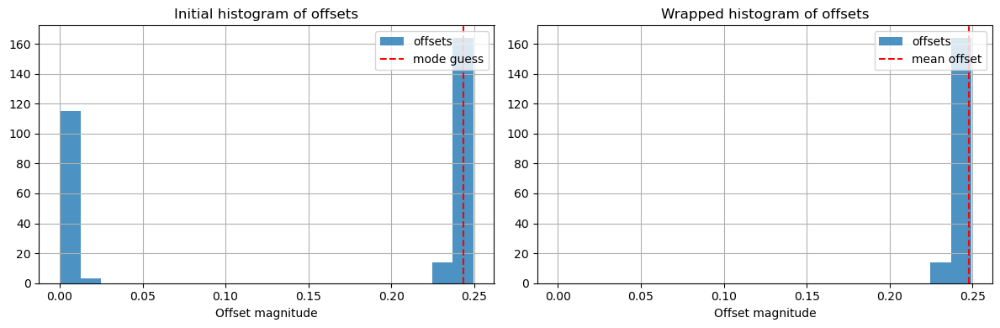



offset = 0.248 seconds
=== end change point detection ===
=== performing change point detection ===
cp range: (3390.006, 3490.006)
using 5438 data entries
skipping 164666 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (5438,)
computing range... ---> range = (0.36,0.42)
displaying jump_fig for switch parameter = s1



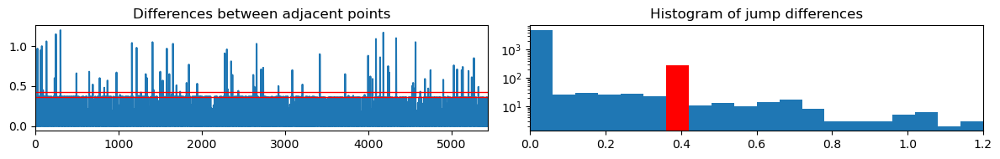



found width of 0.060 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (5438,)
computing range... ---> range = (1.93,1.99)
displaying jump_fig for switch parameter = s2



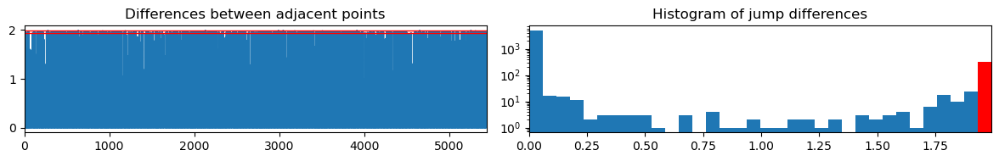



--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (5438,)
computing range... ---> range = (0.06,0.11)
displaying jump_fig for switch parameter = s3



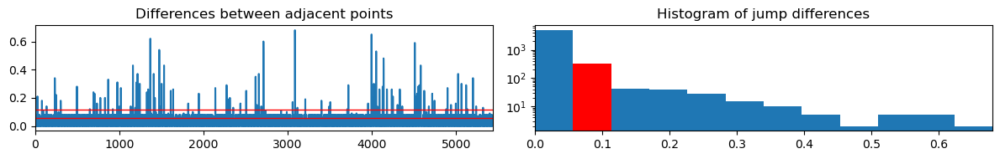



--- end of switch param: s3 ---

---> switch parameter found: s1 <---
finding differences within range = (0.36,0.42)
Jump points detected: 281
out of total: ~399.8

computing offset...


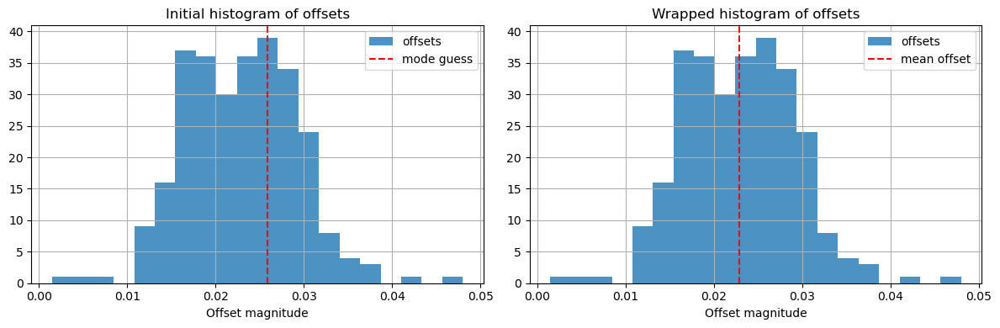



offset = 0.023 seconds
=== end change point detection ===
Nominal Switch Time = 0.2500000
Offset change of 0.025 seconds over 12000.0 switches
Corrected Switch Time = 0.2500021


In [37]:
filename = 'Datasets/Whole_setup/08-17/PAX_08-17_Connector_Orth_1_1560.csv'
#ds = SwitchSet(filename, skip_default_signal_baseline=14)
#ds.find_switches(nominal_switch_rate=2, change_point_range_1=(15,50), print_process=True)
ds_1560 = SwitchSet(filename, skip_default_signal_baseline=390)
ds_1560.find_switches(nominal_switch_rate=2, print_process=True)

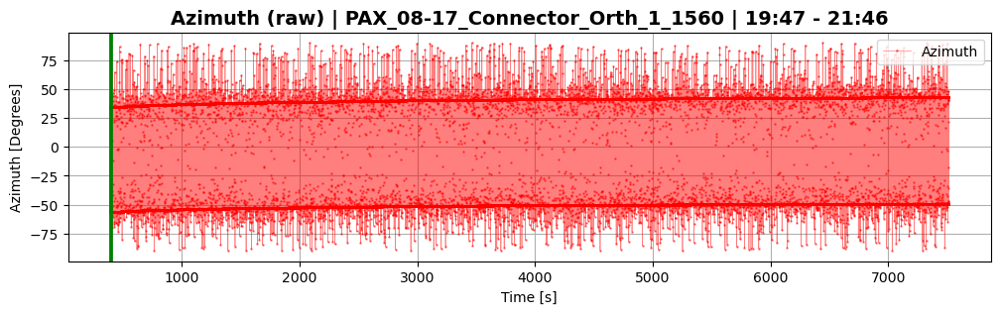

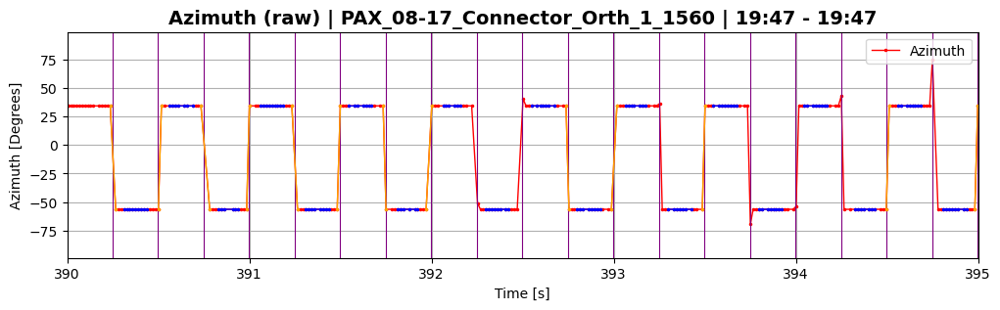

In [38]:
ds_1560.plot_raw(plot_param='Azimuth', sample_range=(390,395),plot_switch=True,plot_jumps=True,plot_valid=True,plot_avg=True)

In [39]:
ds_1560.average_data(print_process=True)

=== starting average_data ===
averaging data... Done
Dropped 6 observations with <4 points (out of total 28491 observations)

--- interpolating data ---
length before: 14243
length after: 14246
3 total added
--- end interpolating data ---

--- interpolating data ---
length before: 14242
length after: 14245
3 total added
--- end interpolating data ---
Signal 1 size=14246	Signal 1 range: t=(390.37,7512.93)
Signal 2 size=14245	Signal 2 range: t=(390.62,7512.68)
=== end average_data ===


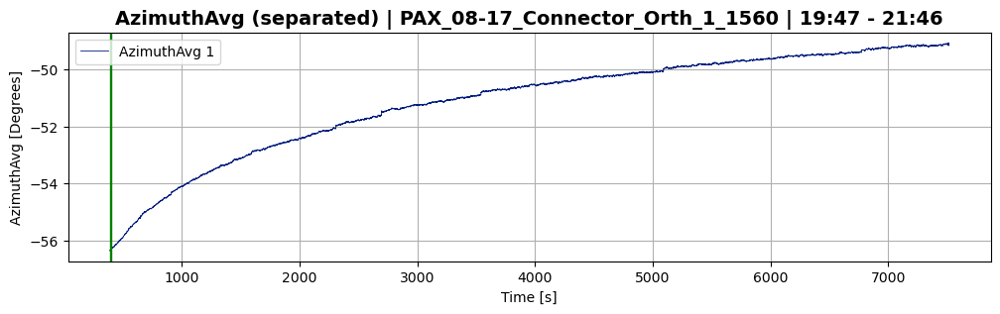

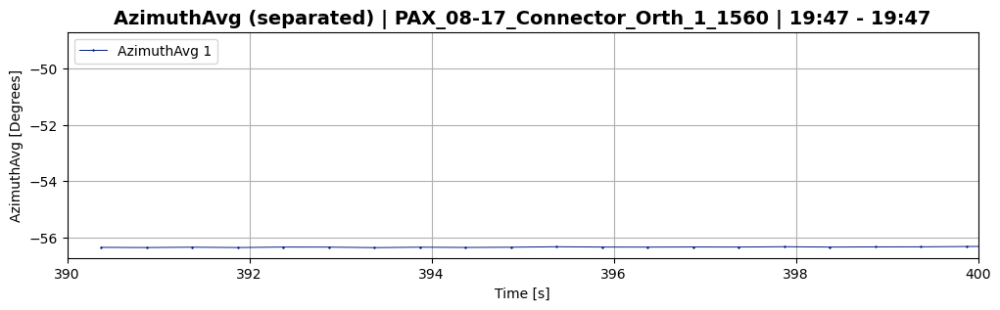

In [40]:
ds_1560.plot_separated(plot_param='AzimuthAvg',plot_signal=1,sample_range=(390,400))

In [41]:
reset_times_1560 = ds_1560.calc_stokes_ptf(reference=reset_times_1345, angle_threshold_deg=2, print_process=True);

Using provided reset times to reset reference matrix
Reference matrix was reset 10 times
Reset at time t=571.00
Reset at time t=912.50
Reset at time t=1518.51
Reset at time t=1919.51
Reset at time t=2211.51
Reset at time t=2393.01
Reset at time t=3274.02
Reset at time t=4293.03
Reset at time t=6340.05
Reset at time t=7395.56


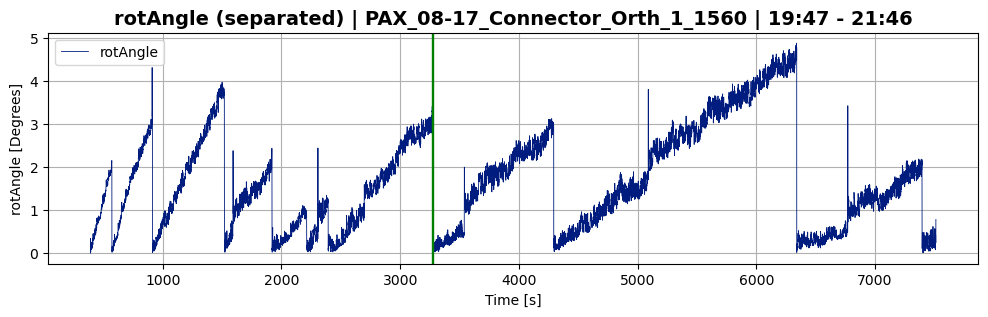

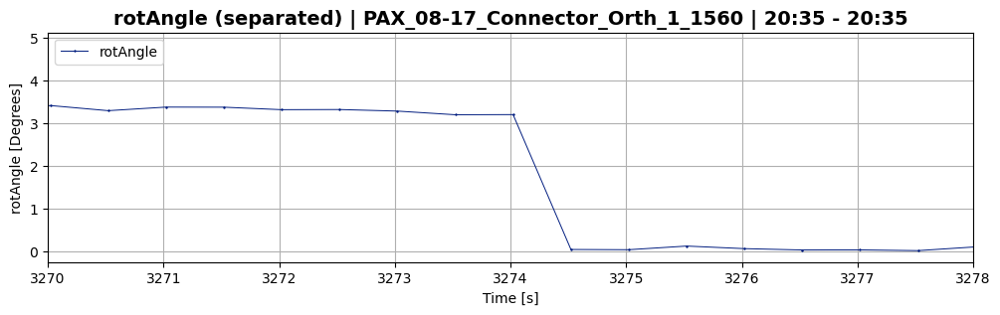

In [42]:
ds_1560.plot_separated(plot_param='rotAngle',plot_signal=1,sample_range=(3270,3278))

##### Both 1345 and 1560 rotAngle

In [44]:
ds_con_08_17 = (ds_1345, ds_1560)

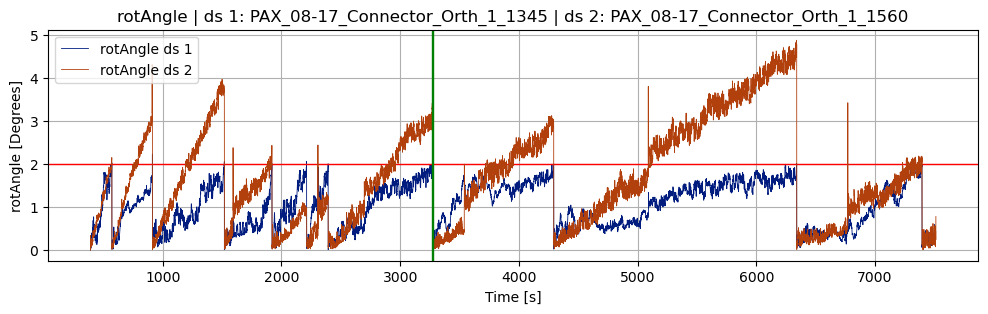

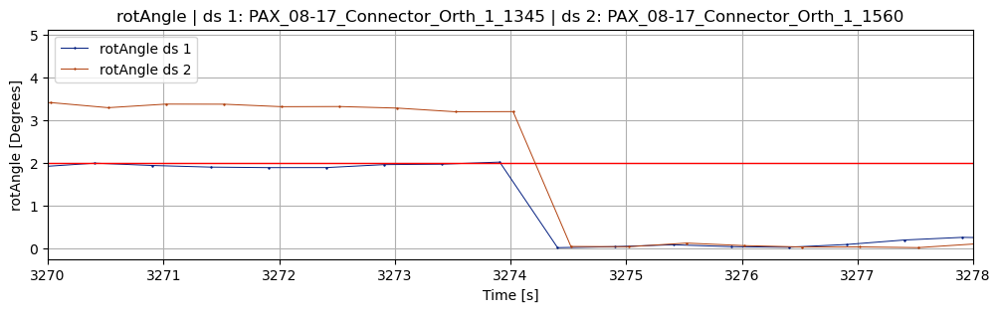

In [43]:
plot_rot_angle(ds_1345, ds_1560, birds_eye=True, sample_range=(3270,3278))

### Connector dataset 23-11-16

##### 1345 dataset

In [45]:
plt.ioff()
plt.close('all')

In [142]:
#filename = 'Datasets/Whole_setup/11-16/PAX_11-16_CON_Orth_1345_desktop.csv'
#ds_test = Dataset(filename,set_range=(0,0.01),skip_default_signal_baseline=False)

Time range: min=0.064, max=976.995


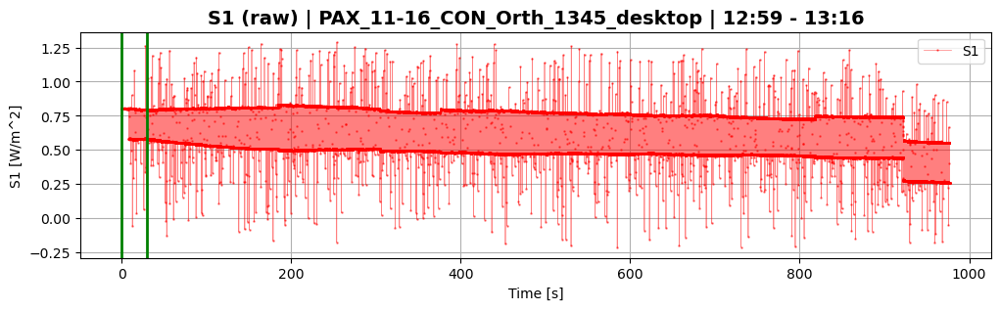

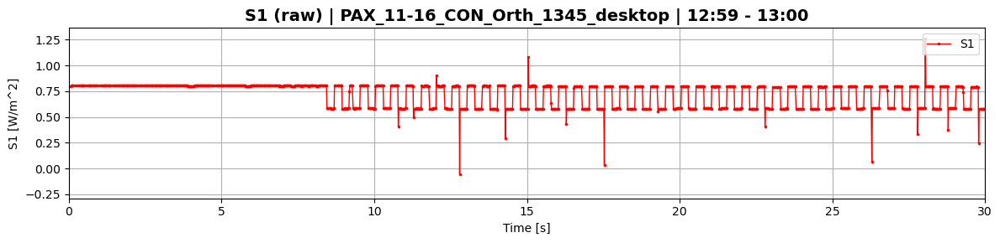

(<Figure size 1200x300 with 1 Axes>, <Figure size 1200x300 with 1 Axes>)

In [144]:
#ds_test.plot_raw(plot_param="S1",sample_range=(0,30))

Time range: min=20.012, max=4908.415
Determining change point ranges automatically...
Using change_point_range_1=(20.012, 120.012)
Using change_point_range_2=(3020.012, 3120.012)
=== performing change point detection ===
cp range: (20.012, 120.012)
using 6007 data entries
skipping 0 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (6007,)
computing range... ---> range = (0.18,0.24)
displaying jump_fig for switch parameter = s1



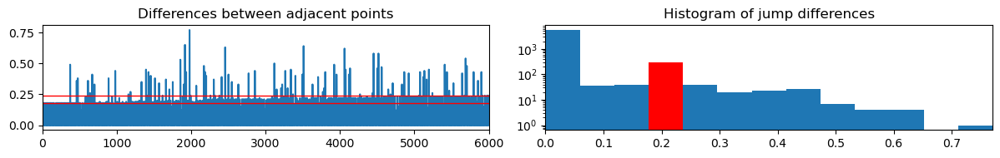



found width of 0.059 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (6007,)
computing range... ---> range = (0.06,0.12)
displaying jump_fig for switch parameter = s2



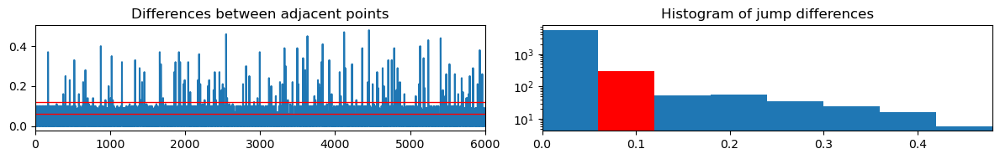



found width of 0.060 for s2
greater than prev width of 0.059 for s1
--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (6007,)
computing range... ---> range = (1.24,1.30)
displaying jump_fig for switch parameter = s3



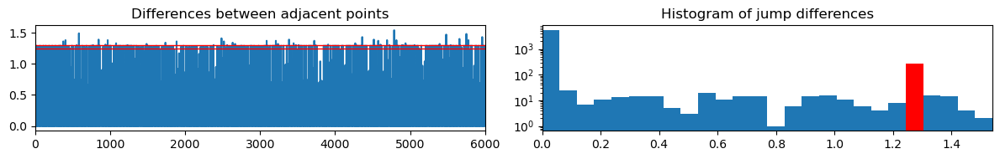



--- end of switch param: s3 ---

---> switch parameter found: s2 <---
finding differences within range = (0.06,0.12)
Jump points detected: 307
out of total: ~400.0

computing offset...


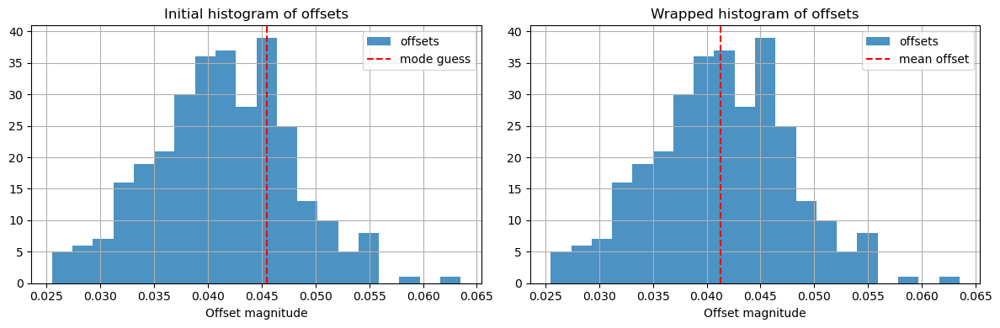



offset = 0.041 seconds
=== end change point detection ===
=== performing change point detection ===
cp range: (3020.012, 3120.012)
using 5991 data entries
skipping 179653 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (5991,)
computing range... ---> range = (0.17,0.23)
displaying jump_fig for switch parameter = s1



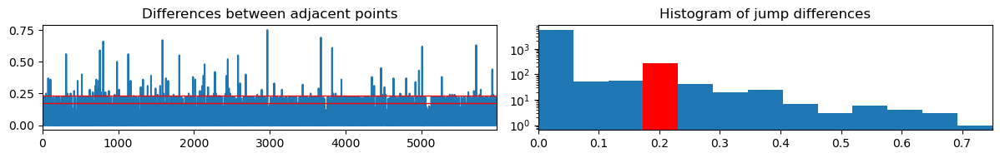



found width of 0.058 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (5991,)
computing range... ---> range = (0.99,1.04)
displaying jump_fig for switch parameter = s2



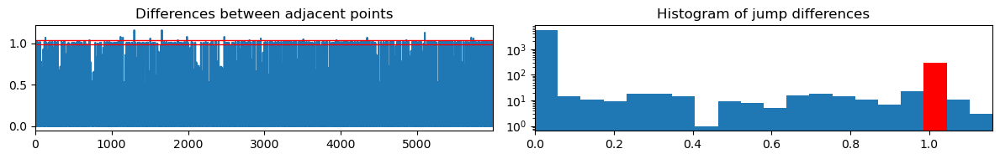



found width of 0.058 for s2
greater than prev width of 0.058 for s1
--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (5991,)
computing range... ---> range = (0.86,0.92)
displaying jump_fig for switch parameter = s3



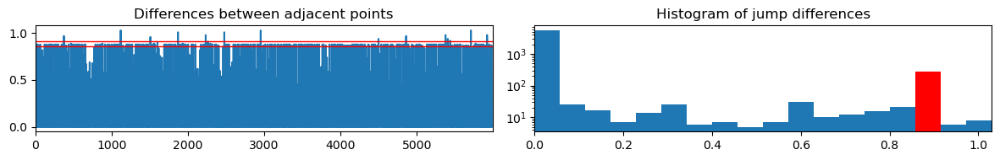



--- end of switch param: s3 ---

---> switch parameter found: s2 <---
finding differences within range = (0.99,1.04)
Jump points detected: 283
out of total: ~400.0

computing offset...


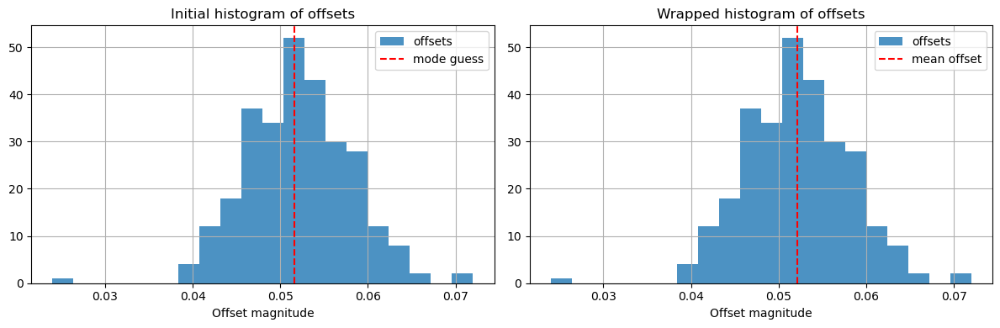



offset = 0.052 seconds
=== end change point detection ===
Nominal Switch Time = 0.2500000
Offset change of 0.011 seconds over 12000.0 switches
Corrected Switch Time = 0.2500009


In [145]:
filename = 'Datasets/Whole_setup/11-16/PAX_11-16_CON_Orth_1345_desktop.csv'
ds_1345 = SwitchSet(filename, set_range=(0,0.05), skip_default_signal_baseline=20)
ds_1345.find_switches(nominal_switch_rate=2, print_process=True)

In [146]:
ds_1345.average_data(print_process=True)

=== starting average_data ===
averaging data... Done
Dropped 0 observations with <4 points (out of total 19552 observations)

--- interpolating data ---
length before: 9776
length after: 9776
0 total added
--- end interpolating data ---

--- interpolating data ---
length before: 9776
length after: 9776
0 total added
--- end interpolating data ---
Signal 1 size=9776	Signal 1 range: t=(20.67,4908.18)
Signal 2 size=9776	Signal 2 range: t=(20.42,4907.93)
=== end average_data ===


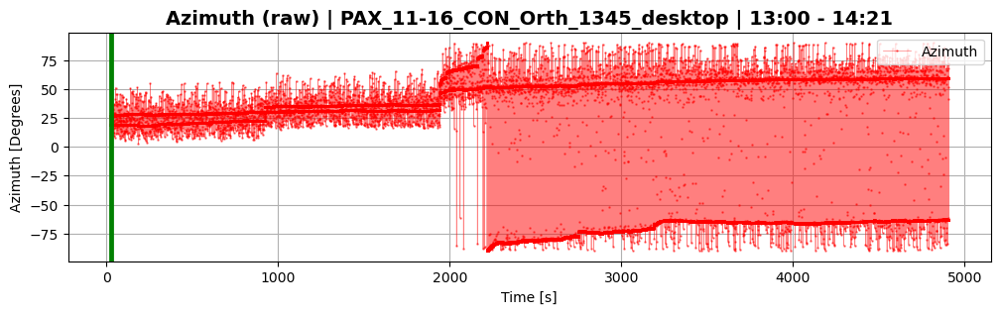

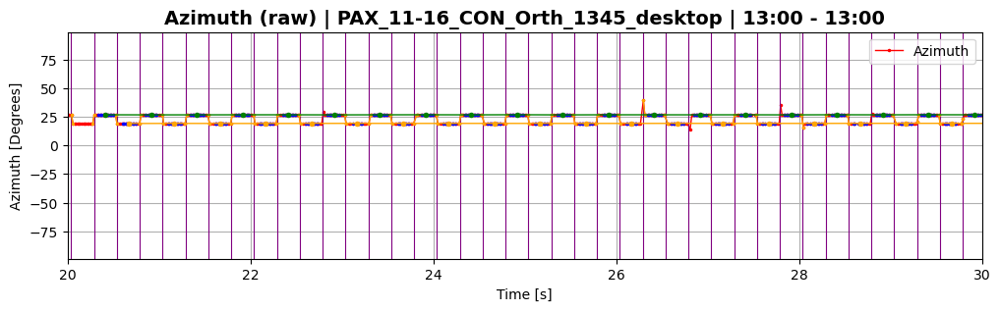

In [147]:
ds_1345.plot_raw(plot_param='Azimuth', sample_range=(20,30),plot_switch=True,plot_jumps=True,plot_valid=True,plot_avg=True)

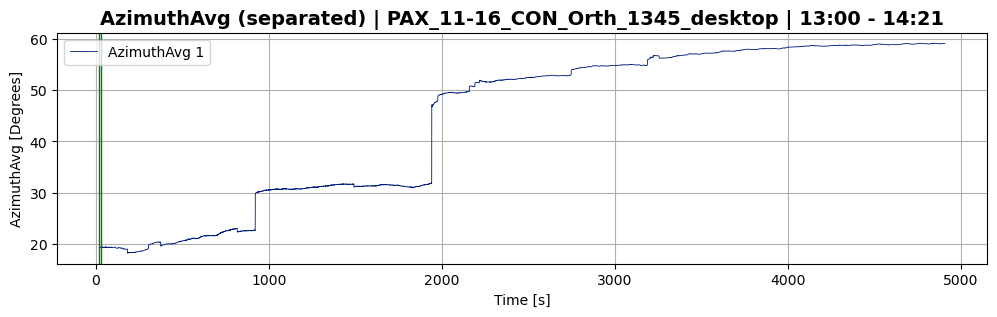

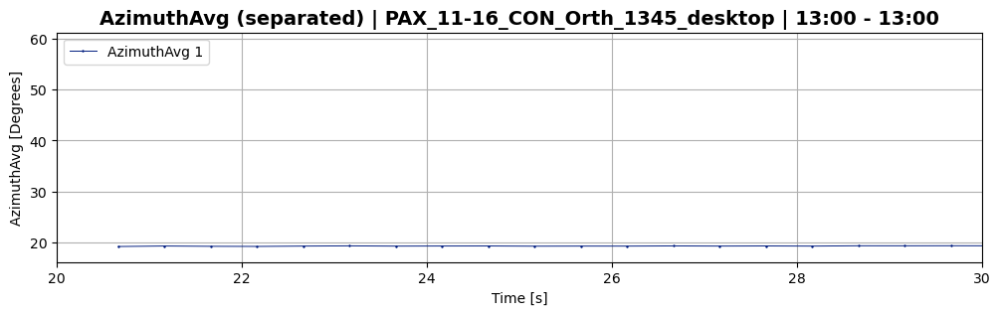

In [148]:
ds_1345.plot_separated(plot_param='AzimuthAvg',plot_signal=1,sample_range=(20,30))

In [149]:
reset_times_1345 = ds_1345.calc_stokes_ptf(reference=None, angle_threshold_deg=5, print_process=True);

Using "resetting reference SOPs" approach with threshold = 5.0 degrees


/tmp/ipykernel_54062/1230508500.py:983: RuntimeWarning:

invalid value encountered in arccos



Reference matrix was reset 10 times
Reset at time t=714.04
Reset at time t=922.54
Reset at time t=1664.55
Reset at time t=1942.55
Reset at time t=1977.55
Reset at time t=2162.55
Reset at time t=2525.05
Reset at time t=2875.55
Reset at time t=3224.05
Reset at time t=4494.56


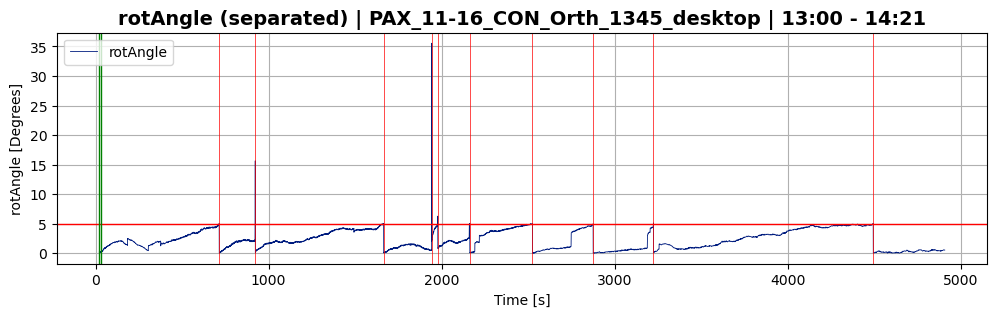

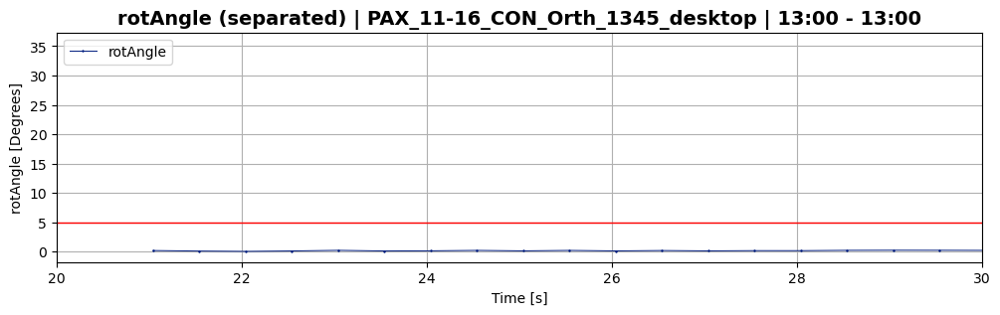

In [150]:
ds_1345.plot_separated(plot_param='rotAngle',sample_range=(20,30))

##### 1560 dataset

Time range: min=20.003, max=4845.596
Determining change point ranges automatically...
Using change_point_range_1=(20.003, 120.003)
Using change_point_range_2=(3020.003, 3120.003)
=== performing change point detection ===
cp range: (20.003, 120.003)
using 5859 data entries
skipping 0 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (5859,)
computing range... ---> range = (0.93,0.99)
displaying jump_fig for switch parameter = s1



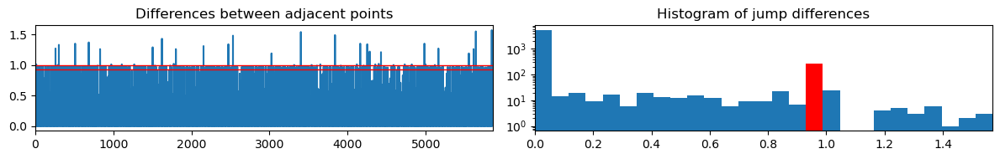



found width of 0.058 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (5859,)
computing range... ---> range = (0.36,0.41)
displaying jump_fig for switch parameter = s2



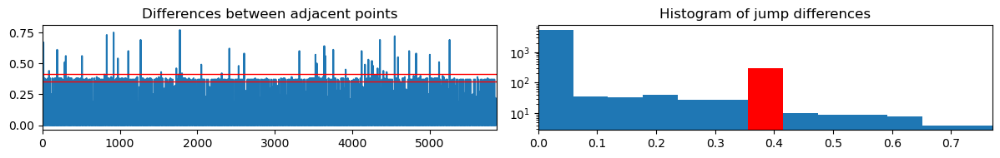



found width of 0.059 for s2
greater than prev width of 0.058 for s1
--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (5859,)
computing range... ---> range = (0.91,0.97)
displaying jump_fig for switch parameter = s3



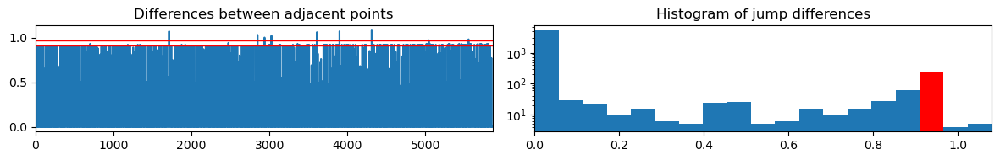



--- end of switch param: s3 ---

---> switch parameter found: s2 <---
finding differences within range = (0.36,0.41)
Jump points detected: 290
out of total: ~400.0

computing offset...


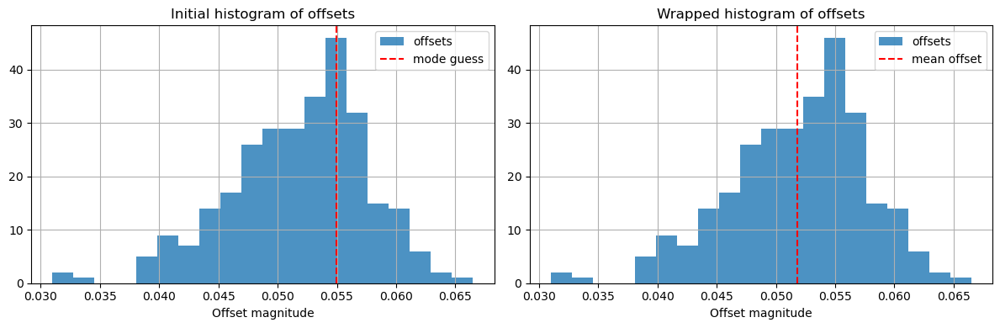



offset = 0.052 seconds
=== end change point detection ===
=== performing change point detection ===
cp range: (3020.003, 3120.003)
using 5865 data entries
skipping 176849 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (5865,)
computing range... ---> range = (0.24,0.30)
displaying jump_fig for switch parameter = s1



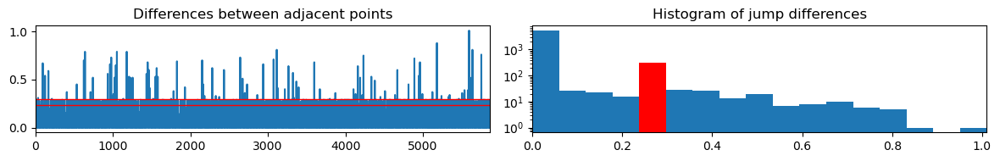



found width of 0.059 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (5865,)
computing range... ---> range = (1.05,1.11)
displaying jump_fig for switch parameter = s2



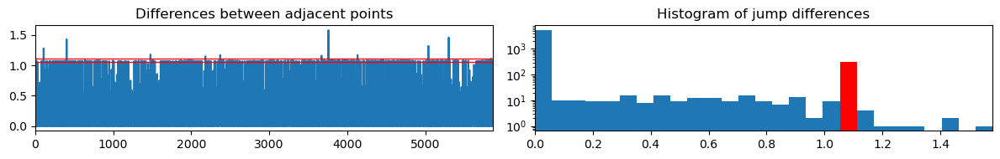



--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (5865,)
computing range... ---> range = (0.82,0.88)
displaying jump_fig for switch parameter = s3



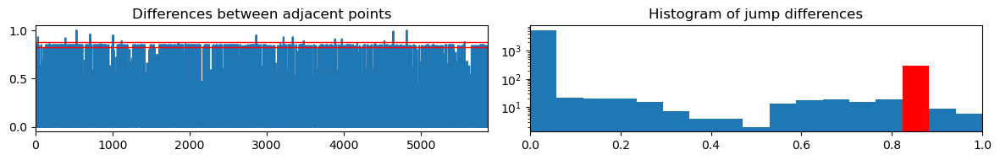



--- end of switch param: s3 ---

---> switch parameter found: s1 <---
finding differences within range = (0.24,0.30)
Jump points detected: 302
out of total: ~400.0

computing offset...


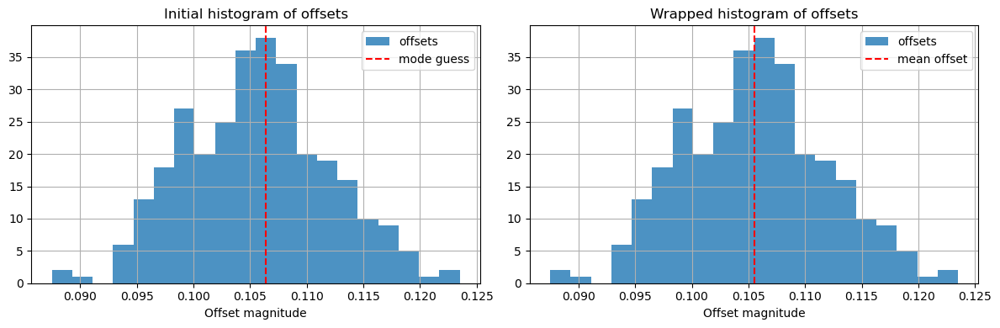



offset = 0.106 seconds
=== end change point detection ===
Nominal Switch Time = 0.2500000
Offset change of 0.054 seconds over 12000.0 switches
Corrected Switch Time = 0.2500045


In [161]:
filename = 'Datasets/Whole_setup/11-16/PAX_11-16_CON_Orth_1560_laptop.csv'
ds_1560 = SwitchSet(filename, set_range=(0,0.05), skip_default_signal_baseline=20)
ds_1560.find_switches(nominal_switch_rate=2, print_process=True)

In [162]:
ds_1560.average_data(print_process=True)

=== starting average_data ===
averaging data... Done
Dropped 0 observations with <4 points (out of total 19300 observations)

--- interpolating data ---
length before: 9650
length after: 9650
0 total added
--- end interpolating data ---

--- interpolating data ---
length before: 9650
length after: 9650
0 total added
--- end interpolating data ---
Signal 1 size=9650	Signal 1 range: t=(20.68,4845.26)
Signal 2 size=9650	Signal 2 range: t=(20.43,4845.01)
=== end average_data ===


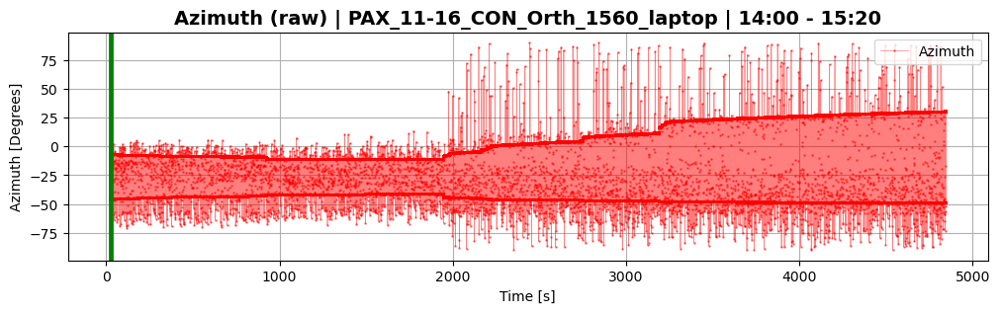

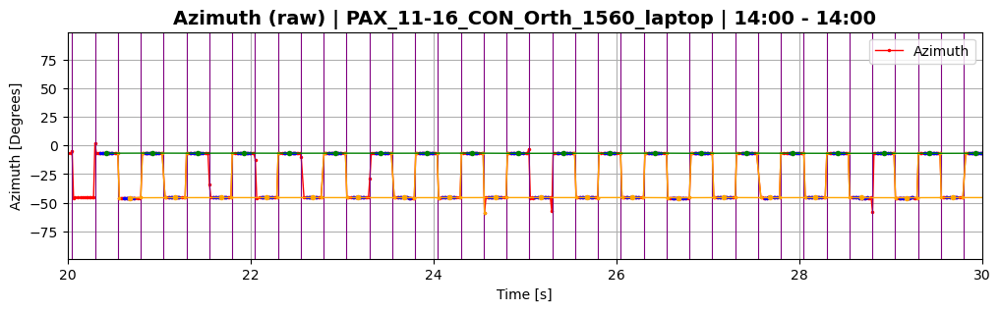

In [163]:
ds_1560.plot_raw(plot_param='Azimuth', sample_range=(20,30),plot_switch=True,plot_jumps=True,plot_valid=True,plot_avg=True)

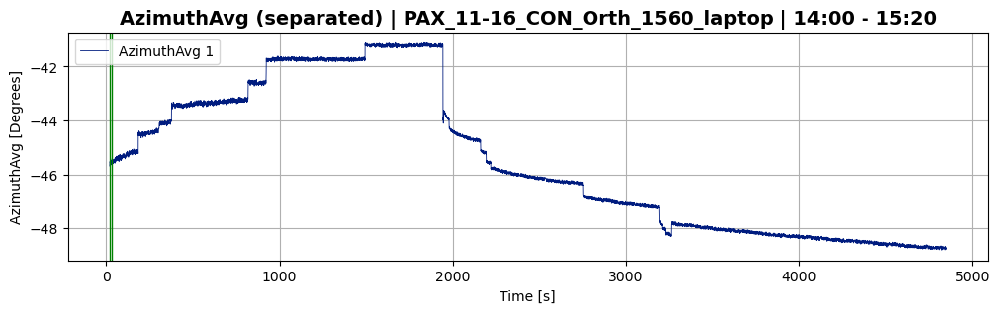

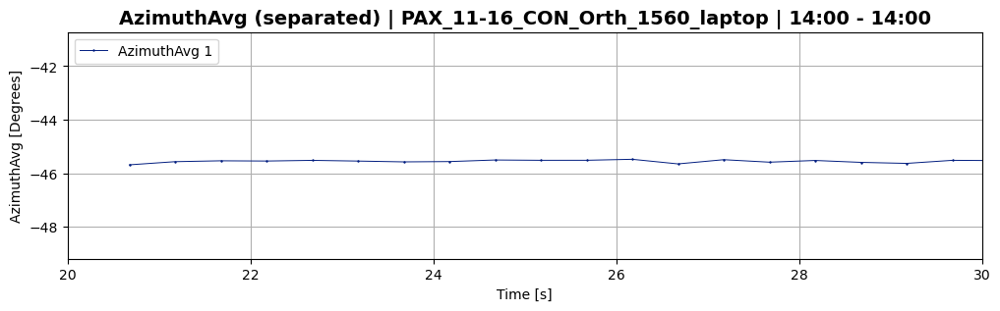

In [164]:
ds_1560.plot_separated(plot_param='AzimuthAvg',plot_signal=1,sample_range=(20,30))

In [165]:
reset_times_1560 = ds_1560.calc_stokes_ptf(reference=reset_times_1345, angle_threshold_deg=2, reset_delay=5, print_process=True);

Using provided reset times to reset reference matrix
Reference matrix was reset 10 times
Reset at time t=719.06
Reset at time t=927.57
Reset at time t=1669.58
Reset at time t=1947.59
Reset at time t=1982.59
Reset at time t=2167.59
Reset at time t=2530.10
Reset at time t=2880.60
Reset at time t=3229.11
Reset at time t=4499.63


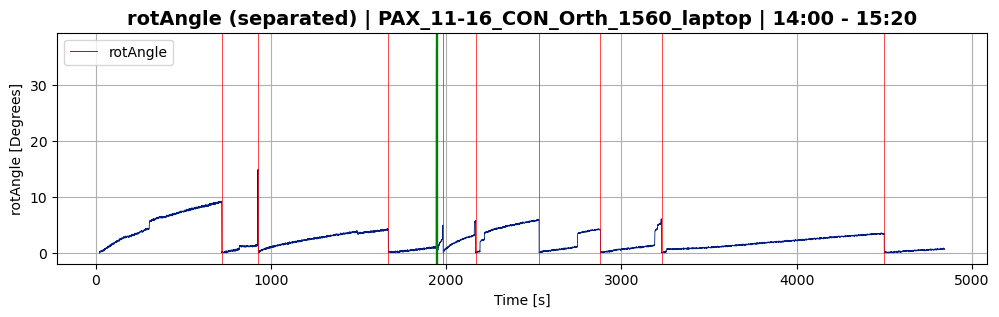

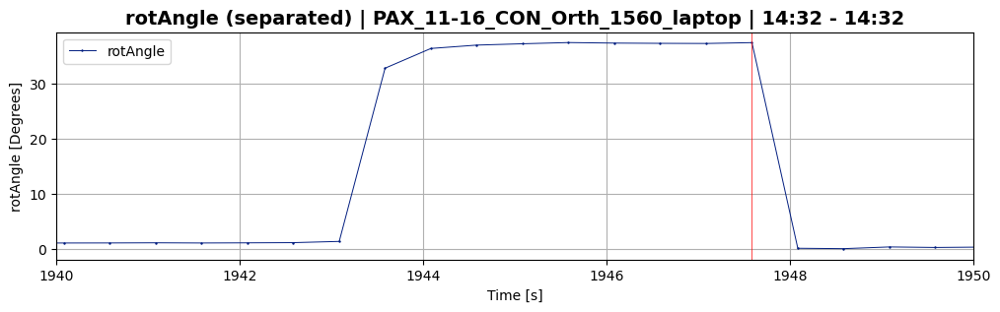

In [170]:
ds_1560.plot_separated(plot_param='rotAngle',sample_range=(1940,1950))

##### Both 1345 and 1560 rotAngle

In [167]:
ds_con_11_16 = (ds_1345, ds_1560)

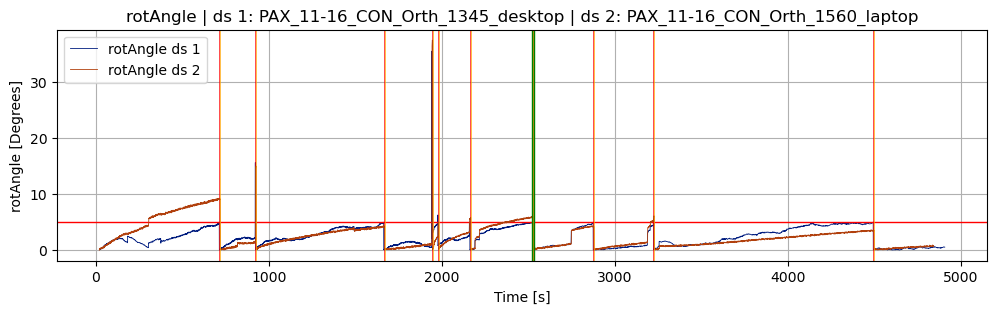

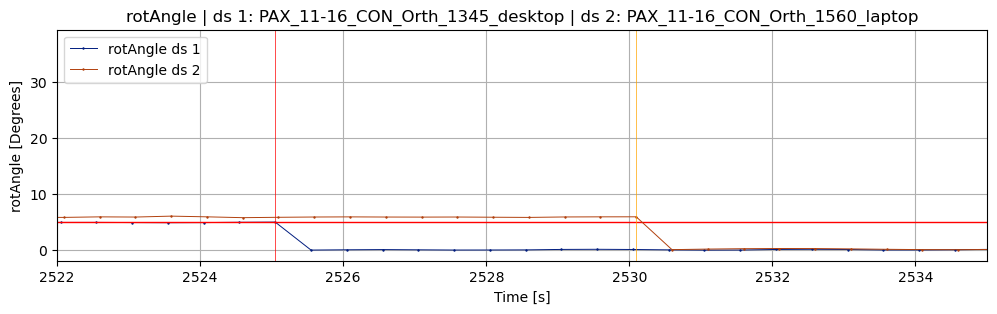

In [172]:
plot_rot_angle(ds_1345, ds_1560, birds_eye=True, sample_range=(2522,2535))

### 50m short dataset 24-3-11

##### 1345 dataset

In [5]:
# filename = DATA + 'Whole_setup/10-30/PAX_10-30_ARL_Orth_1345_desktop.csv'
# ds_test = Dataset(filename,set_range=(0,0.01),skip_default_signal_baseline=False)

Time range: min=0.029, max=955.284


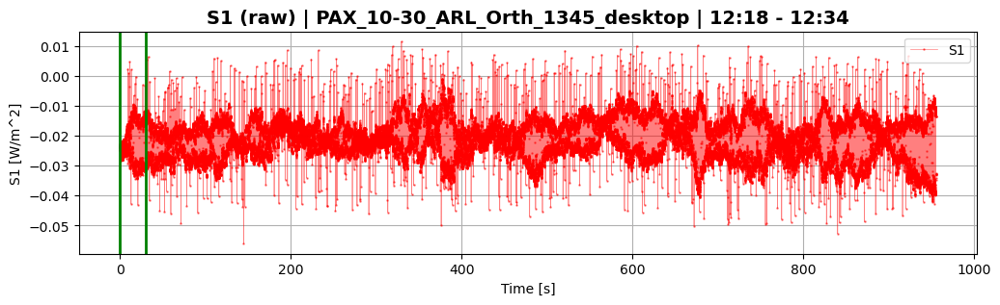

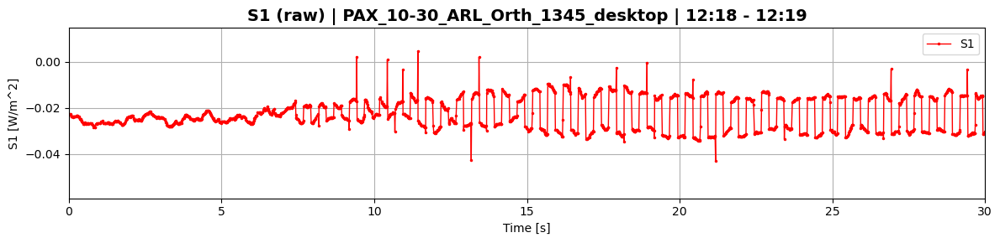

(<Figure size 1200x300 with 1 Axes>, <Figure size 1200x300 with 1 Axes>)

In [10]:
#ds_test.plot_raw(plot_param="S1",sample_range=(0,30))

Time range: min=20.006, max=2324.049
Determining change point ranges automatically...
Using change_point_range_1=(20.006, 120.006)
Using change_point_range_2=(2224.049, 2324.049)
=== performing change point detection ===
cp range: (20.006, 120.006)
using 5390 data entries
skipping 0 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (5390,)
computing range... ---> range = (0.12,0.18)
displaying jump_fig for switch parameter = s1



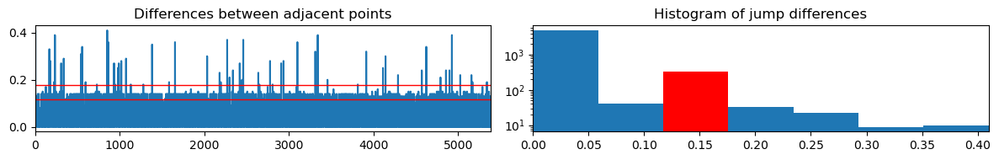



found width of 0.059 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (5390,)
computing range... ---> range = (1.23,1.29)
displaying jump_fig for switch parameter = s2



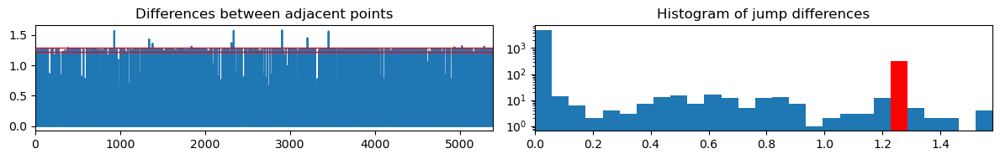



--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (5390,)
computing range... ---> range = (0.45,0.50)
displaying jump_fig for switch parameter = s3



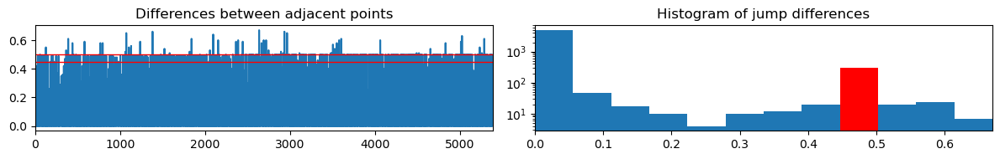



--- end of switch param: s3 ---

---> switch parameter found: s1 <---
finding differences within range = (0.12,0.18)
Jump points detected: 334
out of total: ~399.9

computing offset...


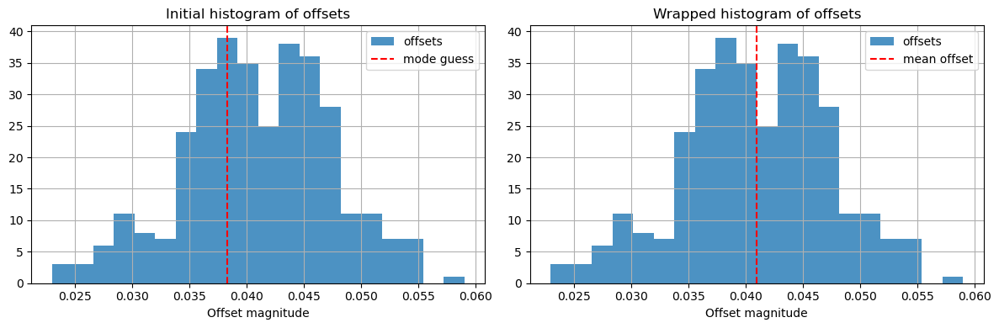



offset = 0.041 seconds
=== end change point detection ===
=== performing change point detection ===
cp range: (2224.049, 2324.049)
using 5189 data entries
skipping 115930 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (5189,)
computing range... ---> range = (0.08,0.14)
displaying jump_fig for switch parameter = s1



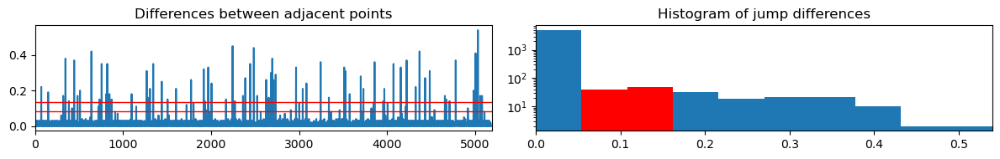



found width of 0.054 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (5189,)
computing range... ---> range = (1.01,1.07)
displaying jump_fig for switch parameter = s2



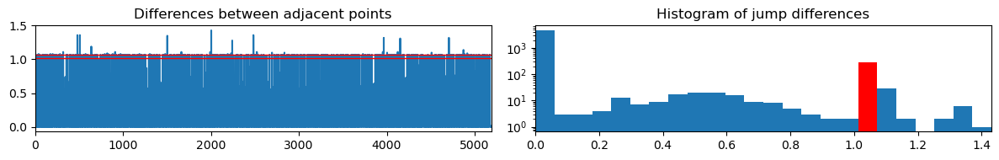



found width of 0.060 for s2
greater than prev width of 0.054 for s1
--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (5189,)
computing range... ---> range = (0.81,0.87)
displaying jump_fig for switch parameter = s3



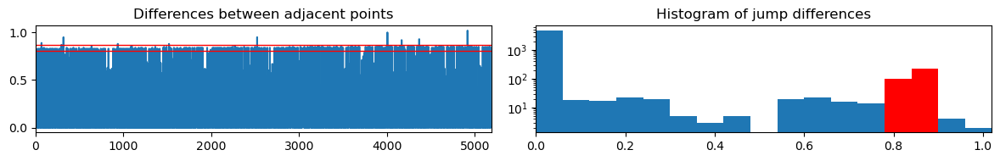



found width of 0.060 for s3
greater than prev width of 0.060 for s2
--- end of switch param: s3 ---

---> switch parameter found: s3 <---
finding differences within range = (0.81,0.87)
Jump points detected: 302
out of total: ~400.0

computing offset...


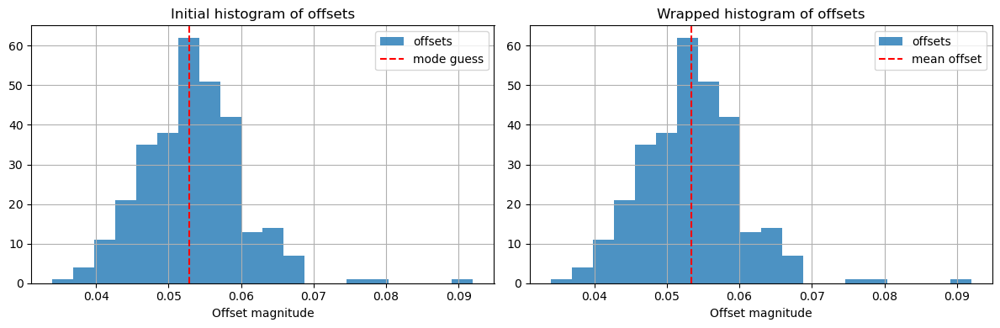



offset = 0.053 seconds
=== end change point detection ===
Nominal Switch Time = 0.2500000
Offset change of 0.012 seconds over 8816.172 switches
Corrected Switch Time = 0.2500014


In [53]:
filename = 'Datasets/Whole_setup/03-11/PAX_3-11_50m_Orth_2_1345_desktop.csv'
ds_1345 = SwitchSet(filename, set_range=None, skip_default_signal_baseline=20)
ds_1345.find_switches(nominal_switch_rate=2, print_process=True)

In [54]:
ds_1345.average_data(print_process=True)

=== starting average_data ===
averaging data... Done
Dropped 35 observations with <4 points (out of total 9213 observations)

--- interpolating data ---
length before: 4590
length after: 4607
17 total added
--- end interpolating data ---

--- interpolating data ---
length before: 4588
length after: 4607
19 total added
--- end interpolating data ---
Signal 1 size=4607	Signal 1 range: t=(20.42,2323.43)
Signal 2 size=4607	Signal 2 range: t=(20.67,2323.68)
=== end average_data ===


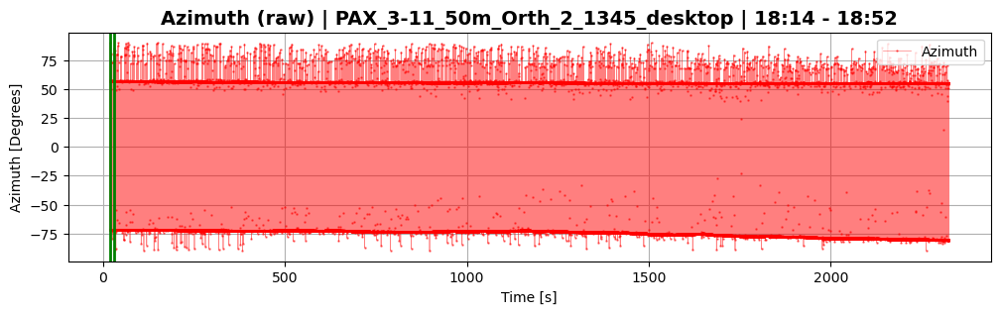

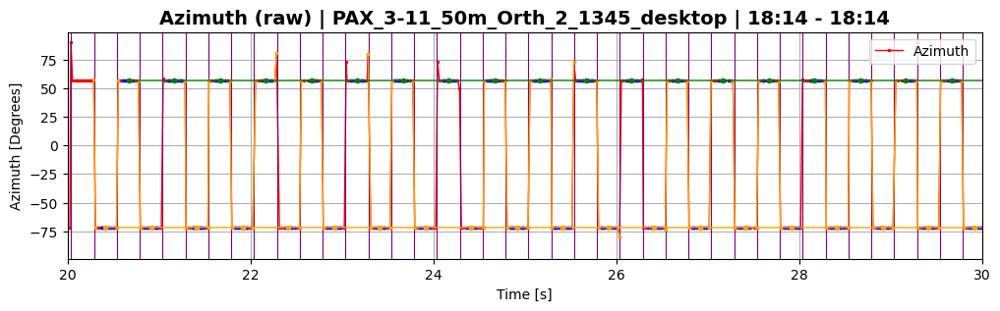

In [55]:
ds_1345.plot_raw(plot_param='Azimuth', sample_range=(20,30),plot_switch=True,plot_jumps=True,plot_valid=True,plot_avg=True)

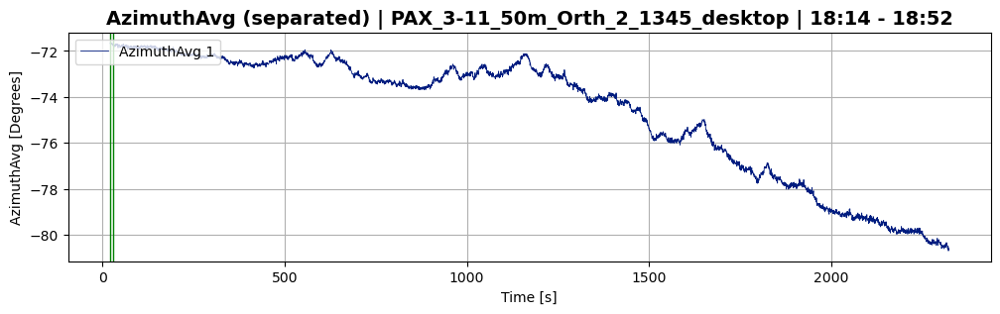

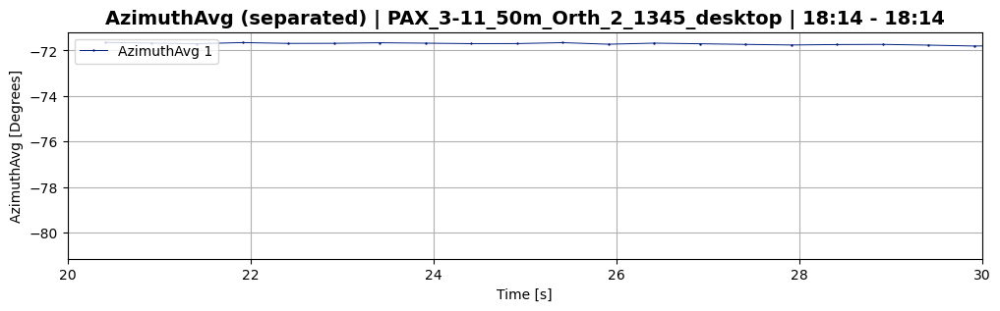

In [56]:
ds_1345.plot_separated(plot_param='AzimuthAvg',plot_signal=1,sample_range=(20,30))

In [79]:
reset_times_1345 = ds_1345.calc_stokes_ptf(reference=None, angle_threshold_deg=2, print_process=True);

Using "resetting reference SOPs" approach with threshold = 2.0 degrees
Reference matrix was reset 12 times
Reset at time t=211.04
Reset at time t=430.54
Reset at time t=500.54
Reset at time t=711.04
Reset at time t=896.55
Reset at time t=1038.55
Reset at time t=1303.05
Reset at time t=1497.05
Reset at time t=1746.05
Reset at time t=1949.05
...


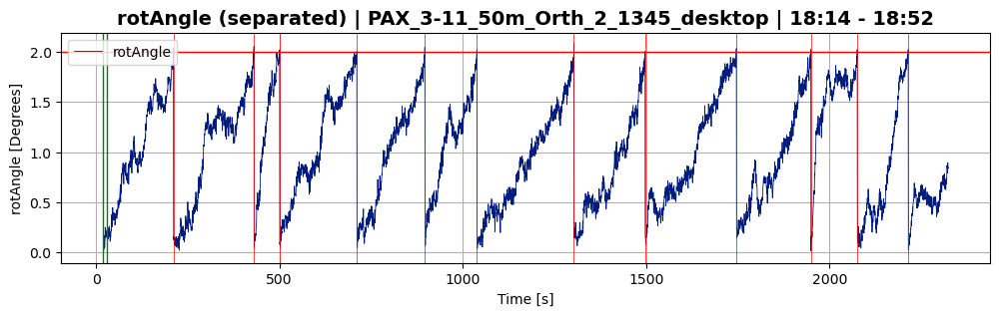

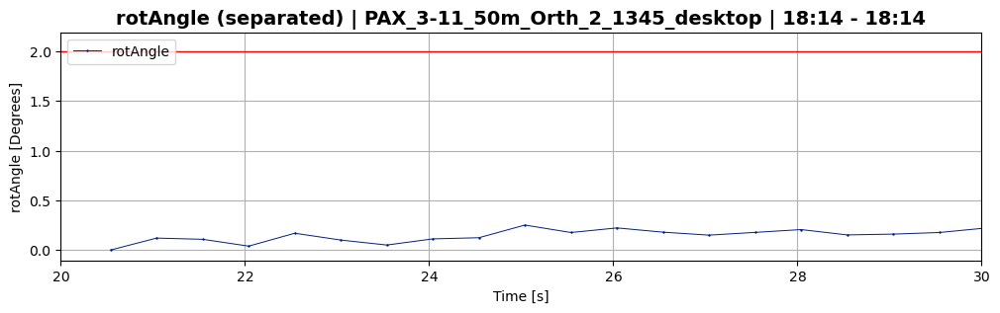

In [80]:
ds_1345.plot_separated(plot_param='rotAngle',sample_range=(20,30))

##### 1560 dataset

Time range: min=20.003, max=2324.011
Determining change point ranges automatically...
Using change_point_range_1=(20.003, 120.003)
Using change_point_range_2=(2224.011, 2324.011)
=== performing change point detection ===
cp range: (20.003, 120.003)
using 5952 data entries
skipping 0 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (5952,)
computing range... ---> range = (0.29,0.35)
displaying jump_fig for switch parameter = s1



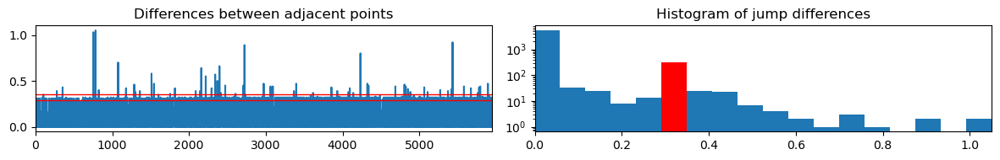



found width of 0.058 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (5952,)
computing range... ---> range = (1.17,1.23)
displaying jump_fig for switch parameter = s2



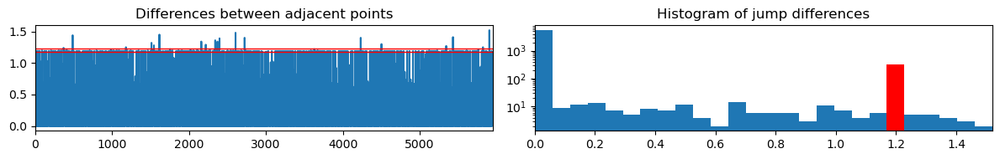



found width of 0.058 for s2
greater than prev width of 0.058 for s1
--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (5952,)
computing range... ---> range = (0.66,0.72)
displaying jump_fig for switch parameter = s3



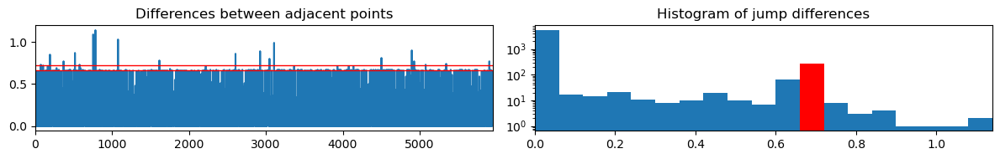



found width of 0.060 for s3
greater than prev width of 0.058 for s2
--- end of switch param: s3 ---

---> switch parameter found: s3 <---
finding differences within range = (0.66,0.72)
Jump points detected: 270
out of total: ~399.9

computing offset...


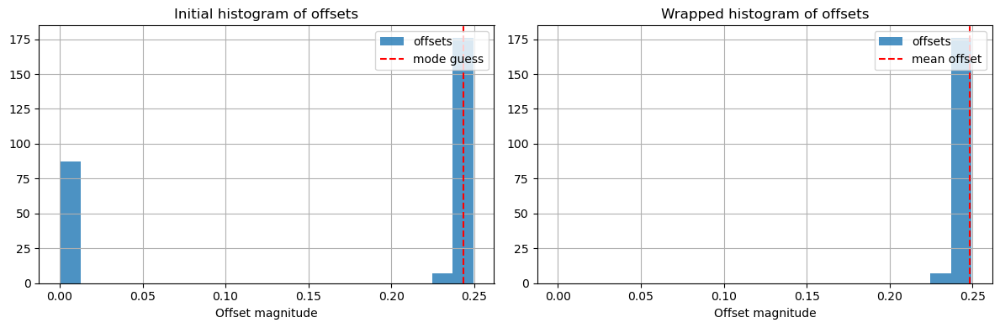



offset = 0.248 seconds
=== end change point detection ===
=== performing change point detection ===
cp range: (2224.011, 2324.011)
using 5867 data entries
skipping 130601 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (5867,)
computing range... ---> range = (0.52,0.58)
displaying jump_fig for switch parameter = s1



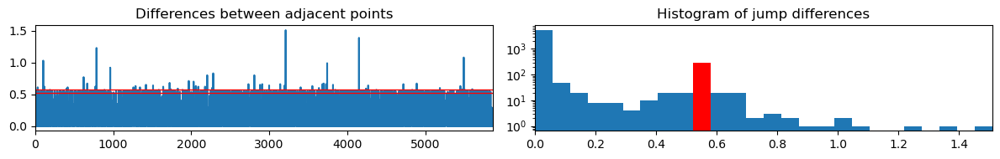



found width of 0.058 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (5867,)
computing range... ---> range = (0.94,1.00)
displaying jump_fig for switch parameter = s2



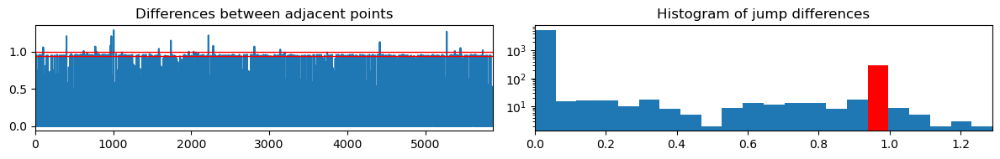



found width of 0.059 for s2
greater than prev width of 0.058 for s1
--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (5867,)
computing range... ---> range = (0.83,0.89)
displaying jump_fig for switch parameter = s3



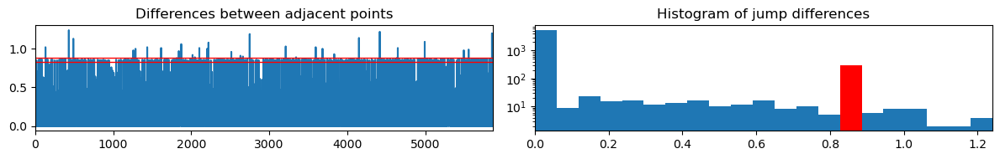



found width of 0.059 for s3
greater than prev width of 0.059 for s2
--- end of switch param: s3 ---

---> switch parameter found: s3 <---
finding differences within range = (0.83,0.89)
Jump points detected: 297
out of total: ~400.0

computing offset...


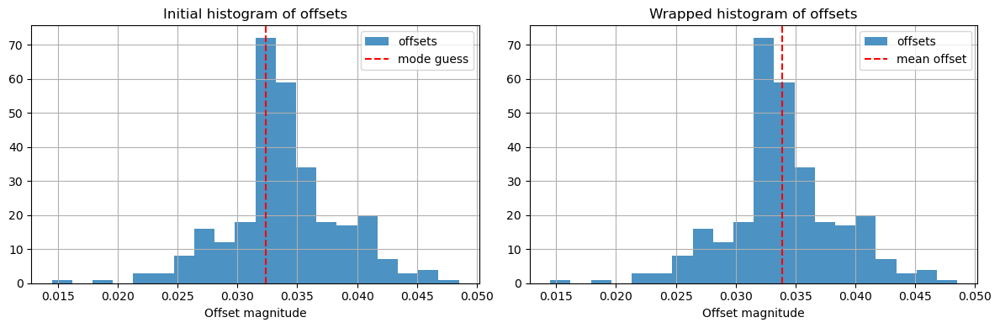



offset = 0.034 seconds
=== end change point detection ===
Nominal Switch Time = 0.2500000
Offset change of 0.036 seconds over 8816.032 switches
Corrected Switch Time = 0.2500040


In [59]:
filename = 'Datasets/Whole_setup/03-11/PAX_3-11_50m_Orth_2_1560_laptop.csv'
ds_1560 = SwitchSet(filename, set_range=None, skip_default_signal_baseline=20)
ds_1560.find_switches(nominal_switch_rate=2, print_process=True)

In [60]:
ds_1560.average_data(print_process=True)

=== starting average_data ===
averaging data... Done
Dropped 0 observations with <4 points (out of total 9214 observations)

--- interpolating data ---
length before: 4607
length after: 4607
0 total added
--- end interpolating data ---

--- interpolating data ---
length before: 4607
length after: 4607
0 total added
--- end interpolating data ---
Signal 1 size=4607	Signal 1 range: t=(20.62,2323.66)
Signal 2 size=4607	Signal 2 range: t=(20.37,2323.41)
=== end average_data ===


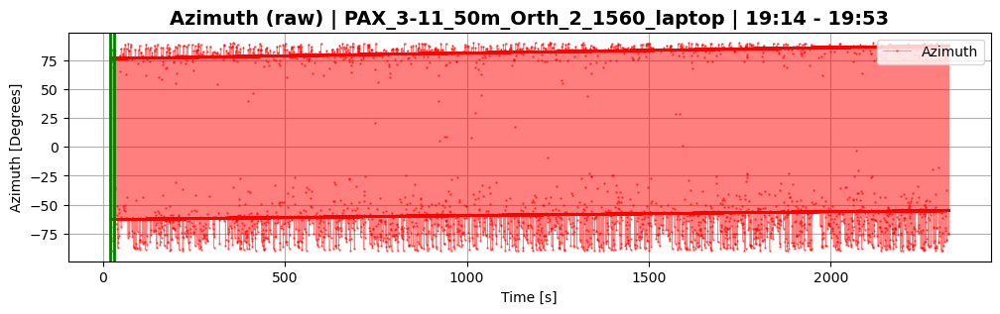

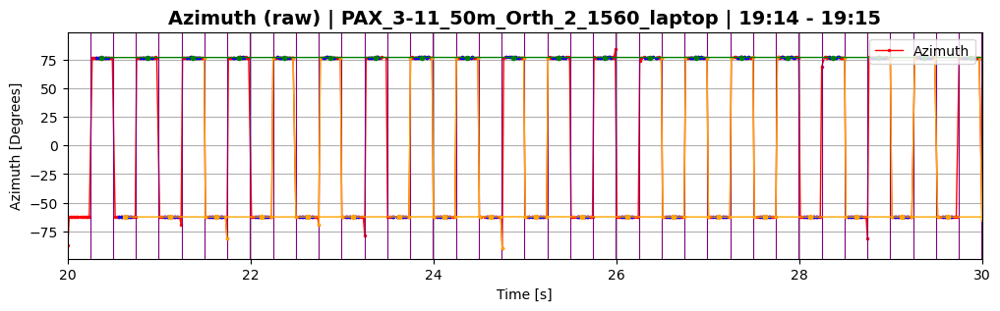

In [61]:
ds_1560.plot_raw(plot_param='Azimuth', sample_range=(20,30),plot_switch=True,plot_jumps=True,plot_valid=True,plot_avg=True)

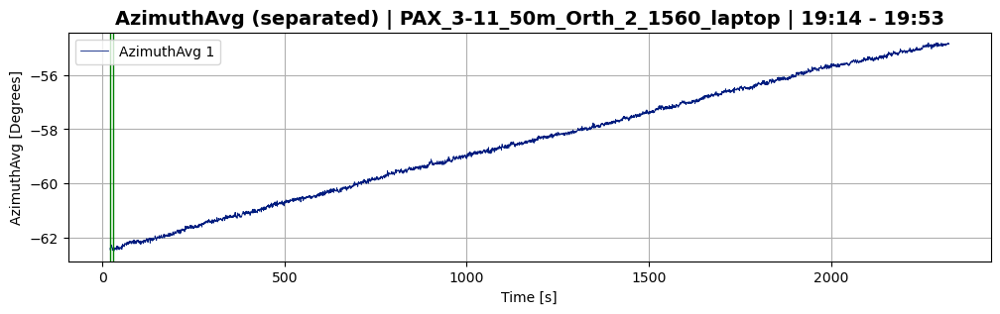

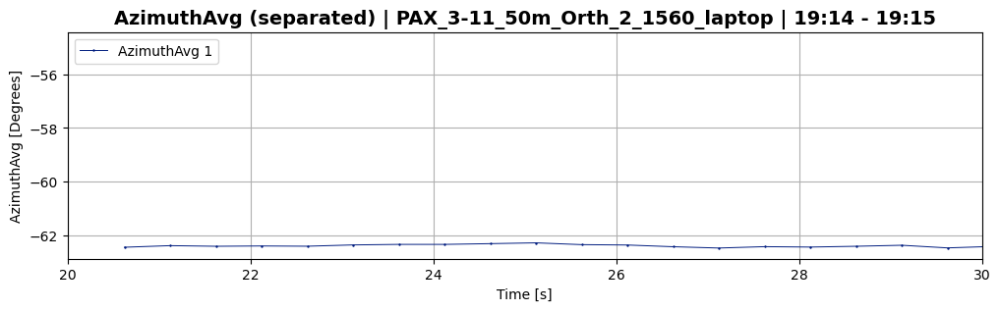

In [62]:
ds_1560.plot_separated(plot_param='AzimuthAvg',plot_signal=1,sample_range=(20,30))

In [81]:
reset_times_1560 = ds_1560.calc_stokes_ptf(reference=reset_times_1345, reset_delay=0, print_process=True);

Using provided reset times to reset reference matrix
Reference matrix was reset 12 times
Reset at time t=211.50
Reset at time t=431.00
Reset at time t=501.01
Reset at time t=711.51
Reset at time t=897.01
Reset at time t=1039.01
Reset at time t=1303.52
Reset at time t=1497.52
Reset at time t=1746.53
Reset at time t=1949.53
...


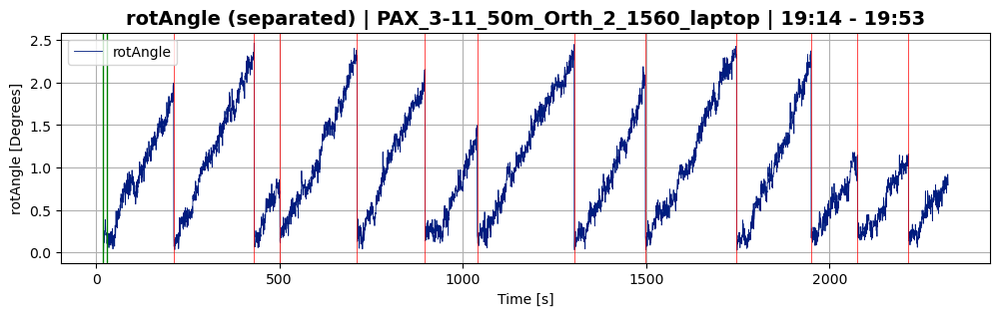

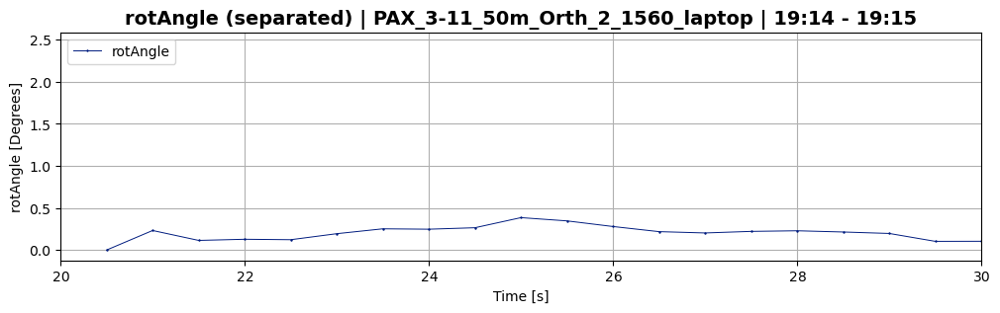

In [82]:
ds_1560.plot_separated(plot_param='rotAngle',sample_range=(20,30))

##### Both 1345 and 1560 rotAngle

In [83]:
ds_50m_3_11 = (ds_1345, ds_1560)

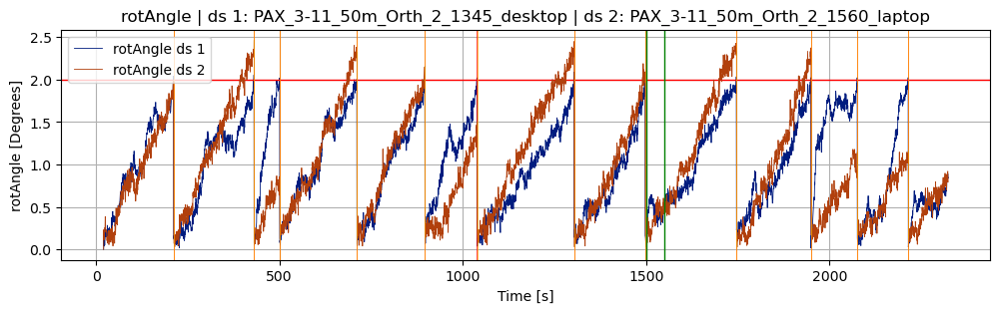

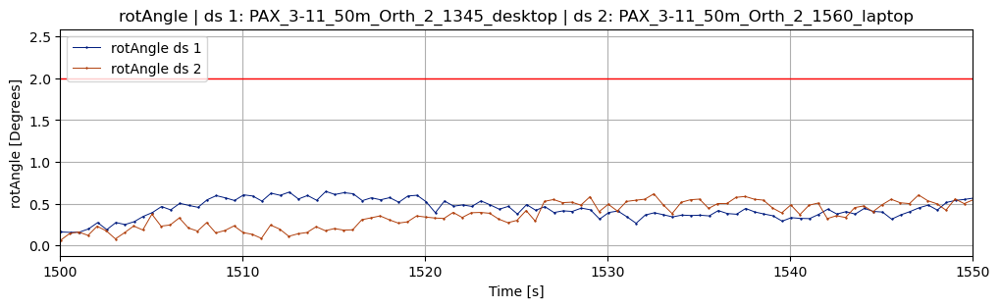

In [84]:
plot_rot_angle(ds_50m_3_11[0], ds_50m_3_11[1], birds_eye=True, sample_range=(1500,1550))

In [86]:
statistics.mean(reset_times_1560)

1214.9333957367376

### ARL dataset 23-08-17

##### 1345 dataset

In [45]:
plt.ioff()
plt.close('all')

Time range: min=20.005, max=922.238


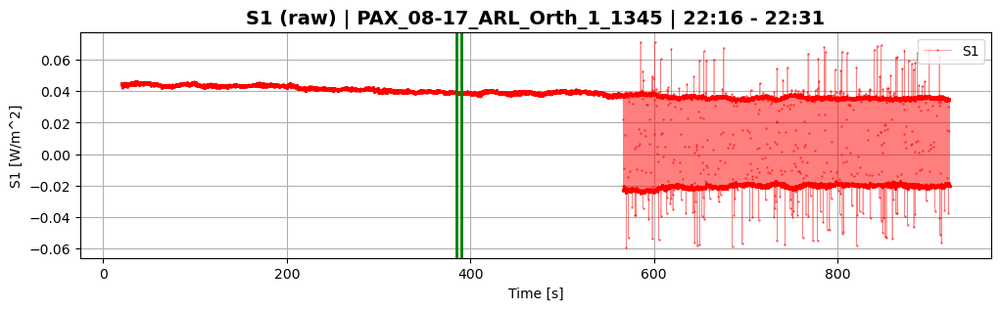

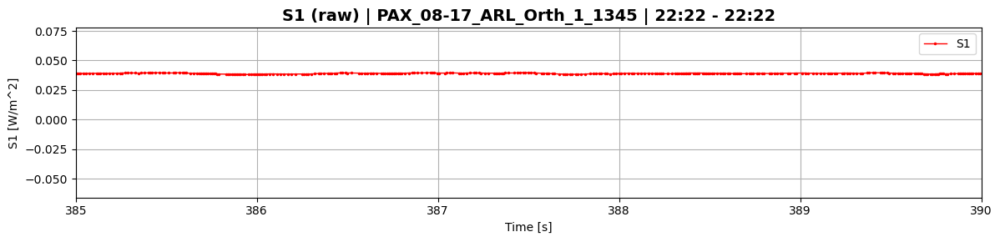

(<Figure size 1200x300 with 1 Axes>, <Figure size 1200x300 with 1 Axes>)

In [48]:
# filename = 'Datasets/Whole_setup/08-17/PAX_08-17_ARL_Orth_1_1345.csv'
# ds_test = Dataset(filename,set_range=(0,0.02))
# ds_test.plot_raw(plot_param="S1",sample_range=(565,575))

Time range: min=570.005, max=6617.293
Determining change point ranges automatically...
Using change_point_range_1=(570.005, 670.005)
Using change_point_range_2=(3570.005, 3670.005)
=== performing change point detection ===
cp range: (570.005, 670.005)
using 6415 data entries
skipping 0 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (6415,)
computing range... ---> range = (0.91,0.96)
displaying jump_fig for switch parameter = s1



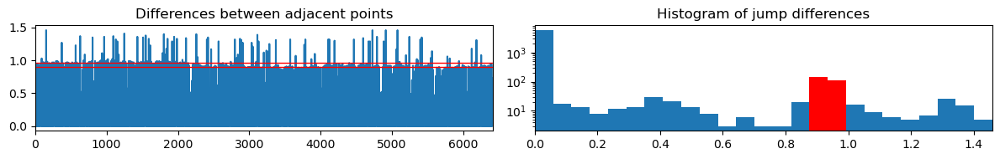



found width of 0.058 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (6415,)
computing range... ---> range = (0.09,0.14)
displaying jump_fig for switch parameter = s2



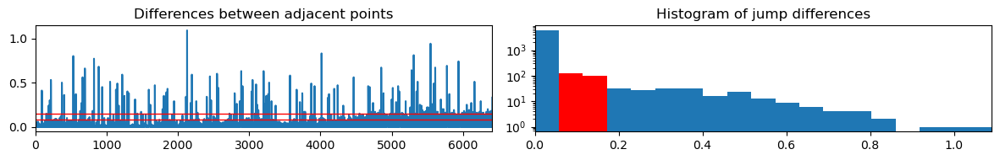



--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (6415,)
computing range... ---> range = (1.68,1.74)
displaying jump_fig for switch parameter = s3



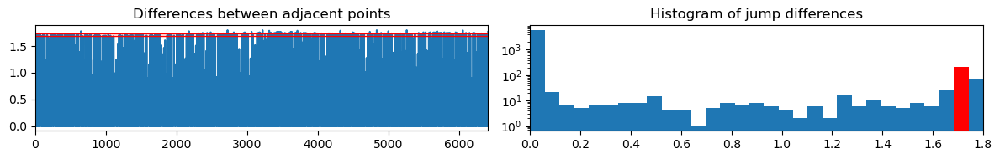



--- end of switch param: s3 ---

---> switch parameter found: s1 <---
finding differences within range = (0.91,0.96)
Jump points detected: 137
out of total: ~400.0

computing offset...


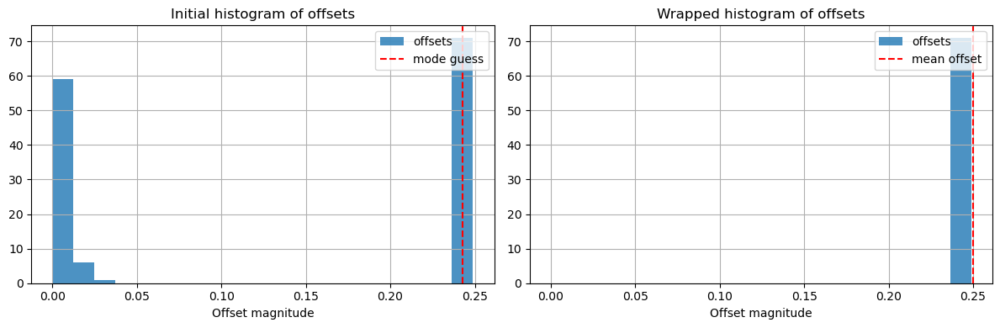



offset = 0.250 seconds
=== end change point detection ===
=== performing change point detection ===
cp range: (3570.005, 3670.005)
using 6728 data entries
skipping 201483 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (6728,)
computing range... ---> range = (0.32,0.38)
displaying jump_fig for switch parameter = s1



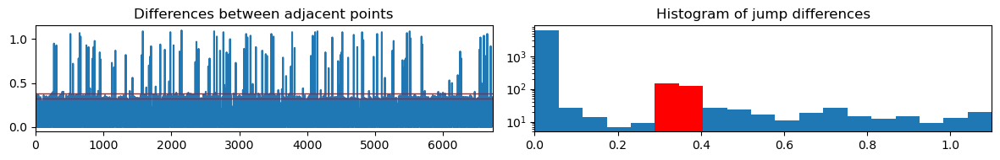



found width of 0.058 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (6728,)
computing range... ---> range = (0.06,0.12)
displaying jump_fig for switch parameter = s2



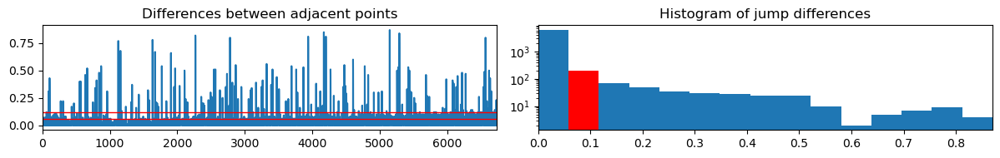



found width of 0.058 for s2
greater than prev width of 0.058 for s1
--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (6728,)
computing range... ---> range = (1.89,1.95)
displaying jump_fig for switch parameter = s3



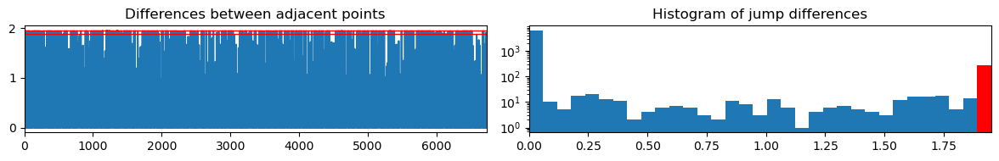



found width of 0.059 for s3
greater than prev width of 0.058 for s2
--- end of switch param: s3 ---

---> switch parameter found: s3 <---
finding differences within range = (1.89,1.95)
Jump points detected: 267
out of total: ~400.0

computing offset...


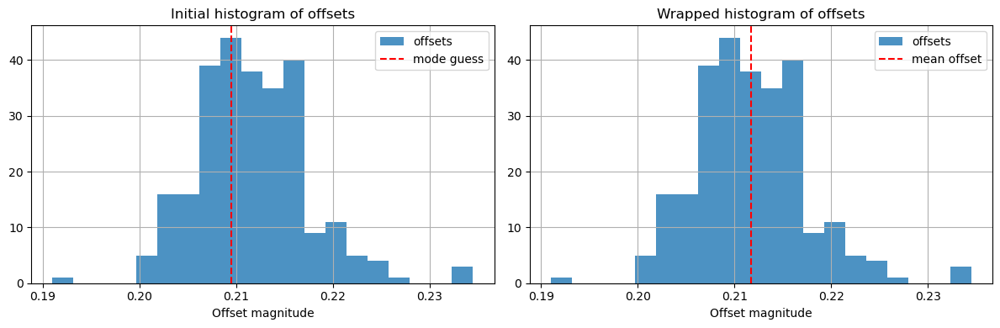



offset = 0.212 seconds
=== end change point detection ===
Nominal Switch Time = 0.2500000
Offset change of -0.038 seconds over 12000.0 switches
Corrected Switch Time = 0.2499968


In [111]:
filename = 'Datasets/Whole_setup/08-17/PAX_08-17_ARL_Orth_1_1345.csv'
#ds = SwitchSet(filename, skip_default_signal_baseline=14)
#ds.find_switches(nominal_switch_rate=2, change_point_range_1=(15,50), print_process=True)
ds_1345 = SwitchSet(filename, set_range=(0,0.15), skip_default_signal_baseline=570)
ds_1345.find_switches(nominal_switch_rate=2, print_process=True)

In [112]:
ds_1345.average_data(print_process=True)

=== starting average_data ===
averaging data... Done
Dropped 15 observations with <4 points (out of total 24050 observations)

--- interpolating data ---
length before: 12021
length after: 12094
73 total added
--- end interpolating data ---

--- interpolating data ---
length before: 12014
length after: 12094
80 total added
--- end interpolating data ---
Signal 1 size=12094	Signal 1 range: t=(570.38,6616.80)
Signal 2 size=12094	Signal 2 range: t=(570.63,6617.05)
=== end average_data ===


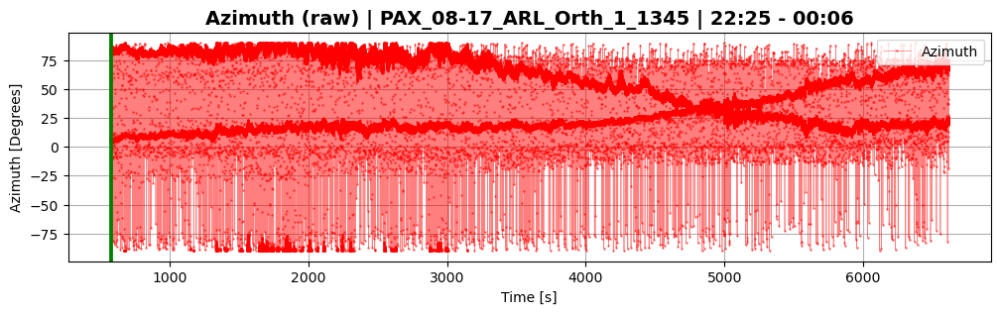

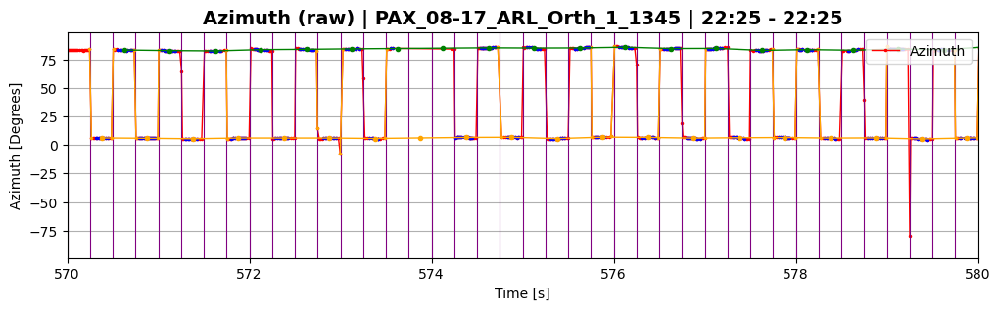

In [113]:
ds_1345.plot_raw(plot_param='Azimuth', sample_range=(570,580),plot_switch=True,plot_jumps=True,plot_valid=True,plot_avg=True)

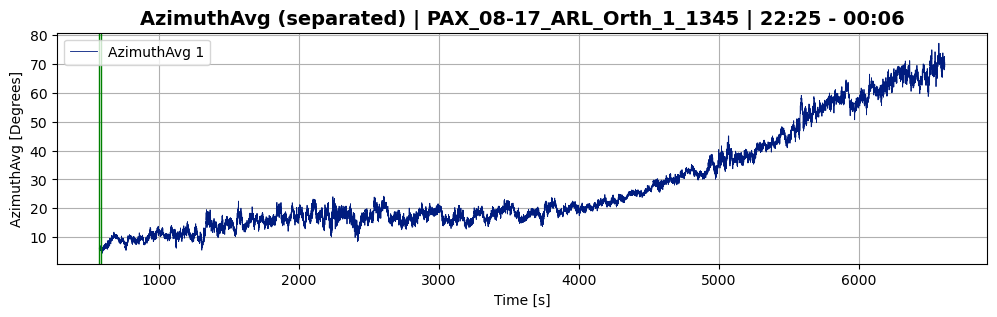

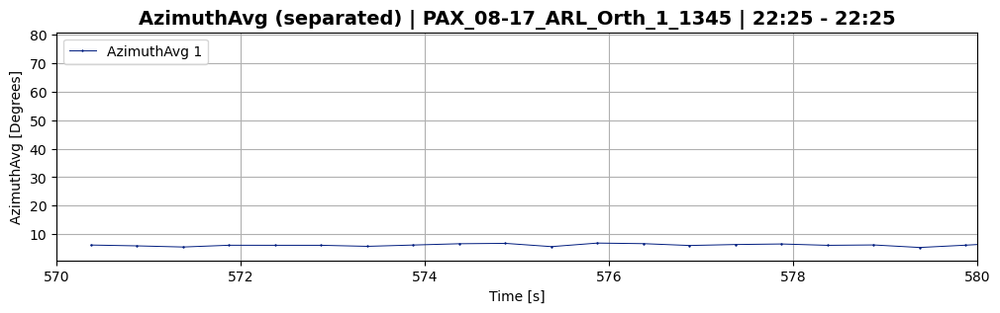

In [114]:
ds_1345.plot_separated(plot_param='AzimuthAvg',plot_signal=1,sample_range=(570,580))

In [115]:
reset_times_1345 = ds_1345.calc_stokes_ptf(reference=None, angle_threshold_deg=12, print_process=True);

Using "resetting reference SOPs" approach with threshold = 12.0 degrees
Reference matrix was reset 34 times
Reset at time t=855.50
Reset at time t=1149.49
Reset at time t=1154.99
Reset at time t=1166.49
Reset at time t=1177.99
Reset at time t=1362.99
Reset at time t=1370.49
Reset at time t=1724.49
Reset at time t=1752.49
Reset at time t=1867.48
...


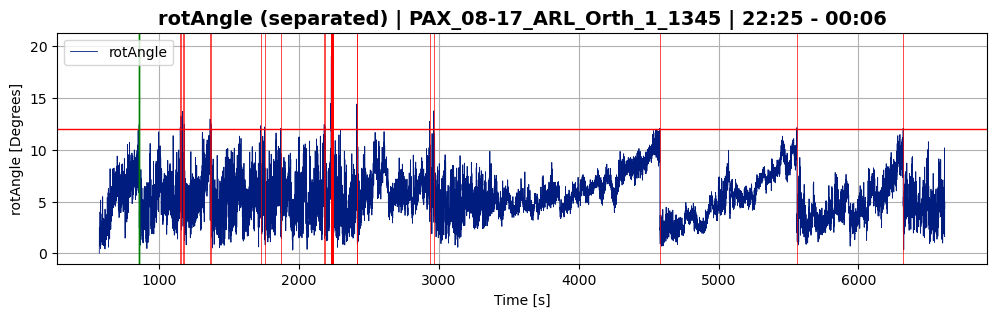

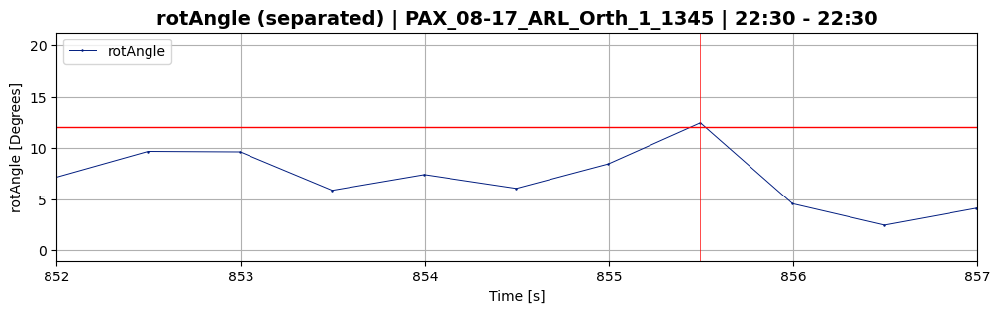

In [116]:
ds_1345.plot_separated(plot_param='rotAngle',plot_signal=1,sample_range=(852,857))

##### 1560 dataset

Time range: min=570.005, max=6618.248
Determining change point ranges automatically...
Using change_point_range_1=(570.005, 670.005)
Using change_point_range_2=(3570.005, 3670.005)
=== performing change point detection ===
cp range: (570.005, 670.005)
using 5658 data entries
skipping 0 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (5658,)
computing range... ---> range = (1.52,1.58)
displaying jump_fig for switch parameter = s1



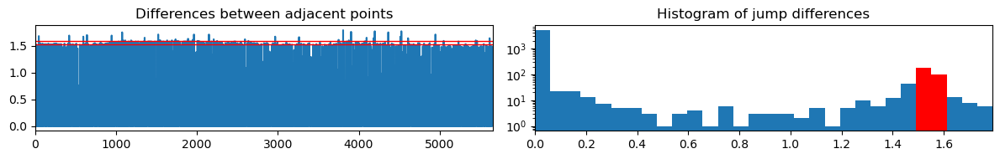



found width of 0.060 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (5658,)
computing range... ---> range = (1.08,1.14)
displaying jump_fig for switch parameter = s2



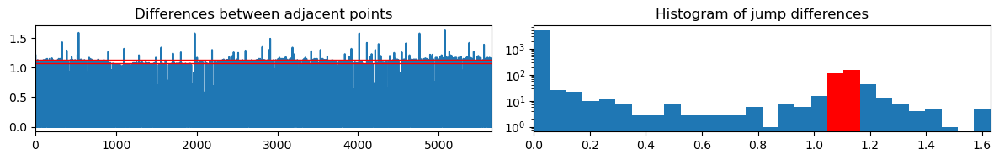



--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (5658,)
computing range... ---> range = (0.58,0.64)
displaying jump_fig for switch parameter = s3



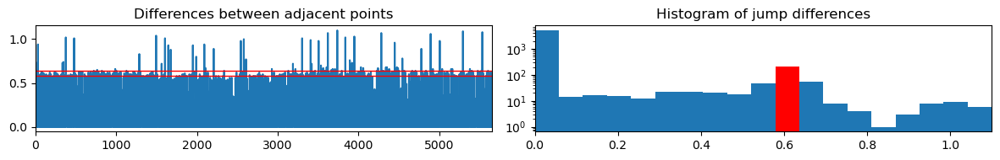



--- end of switch param: s3 ---

---> switch parameter found: s1 <---
finding differences within range = (1.52,1.58)
Jump points detected: 183
out of total: ~399.9

computing offset...


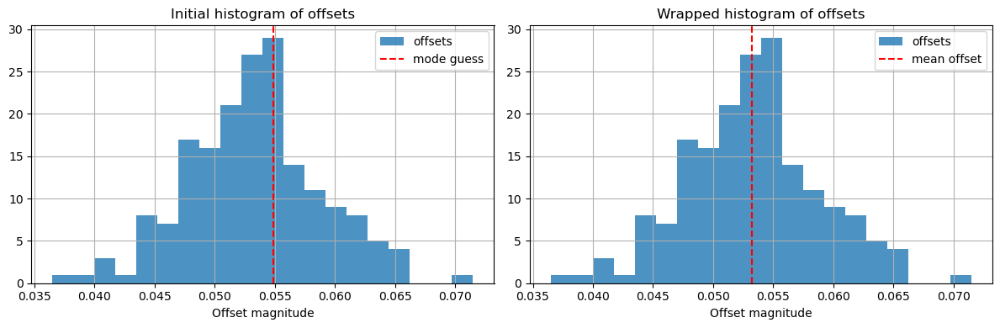



offset = 0.053 seconds
=== end change point detection ===
=== performing change point detection ===
cp range: (3570.005, 3670.005)
using 5734 data entries
skipping 171203 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (5734,)
computing range... ---> range = (1.13,1.19)
displaying jump_fig for switch parameter = s1



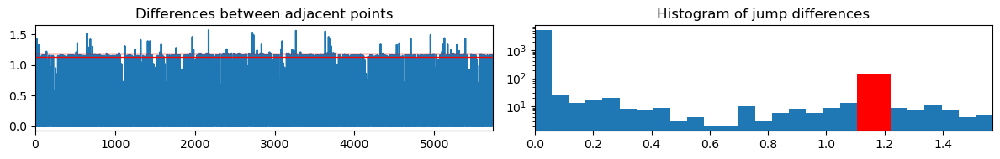



found width of 0.058 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (5734,)
computing range... ---> range = (1.42,1.48)
displaying jump_fig for switch parameter = s2



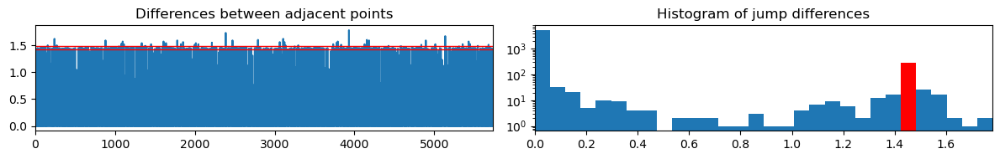



found width of 0.059 for s2
greater than prev width of 0.058 for s1
--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (5734,)
computing range... ---> range = (0.67,0.73)
displaying jump_fig for switch parameter = s3



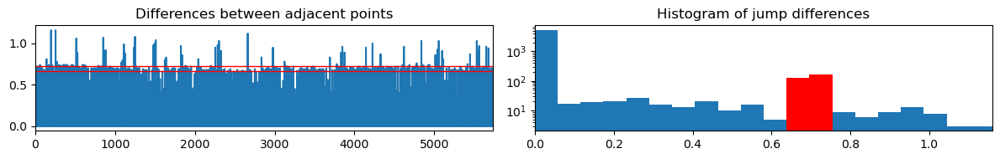



--- end of switch param: s3 ---

---> switch parameter found: s2 <---
finding differences within range = (1.42,1.48)
Jump points detected: 290
out of total: ~400.0

computing offset...


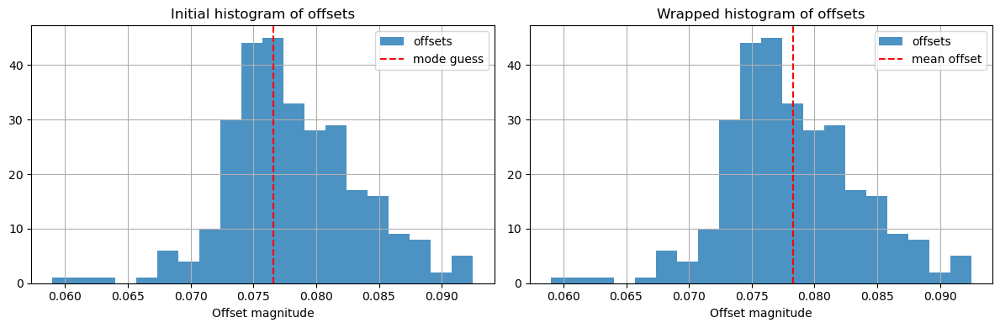



offset = 0.078 seconds
=== end change point detection ===
Nominal Switch Time = 0.2500000
Offset change of 0.025 seconds over 12000.0 switches
Corrected Switch Time = 0.2500021


In [130]:
filename = 'Datasets/Whole_setup/08-17/PAX_08-17_ARL_Orth_1_1560.csv'
#ds = SwitchSet(filename, skip_default_signal_baseline=14)
#ds.find_switches(nominal_switch_rate=2, change_point_range_1=(15,50), print_process=True)
ds_1560 = SwitchSet(filename, set_range=(0,0.15), skip_default_signal_baseline=570)
ds_1560.find_switches(nominal_switch_rate=2, print_process=True)

In [131]:
ds_1560.average_data(print_process=True)

=== starting average_data ===
averaging data... Done
Dropped 0 observations with <4 points (out of total 24192 observations)

--- interpolating data ---
length before: 12096
length after: 12096
0 total added
--- end interpolating data ---

--- interpolating data ---
length before: 12096
length after: 12096
0 total added
--- end interpolating data ---
Signal 1 size=12096	Signal 1 range: t=(570.18,6617.73)
Signal 2 size=12096	Signal 2 range: t=(570.43,6617.98)
=== end average_data ===


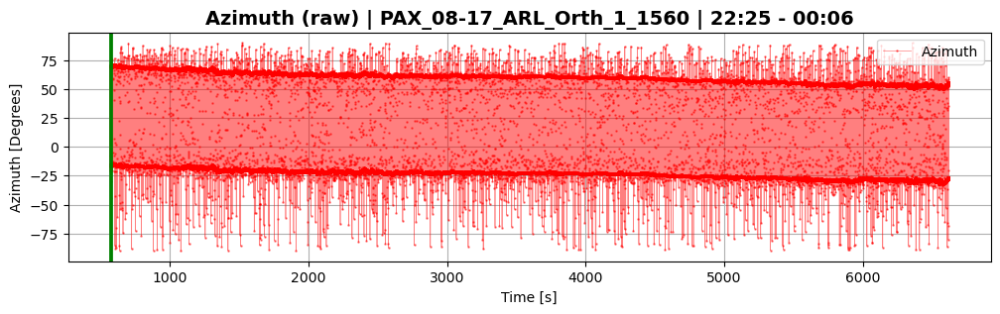

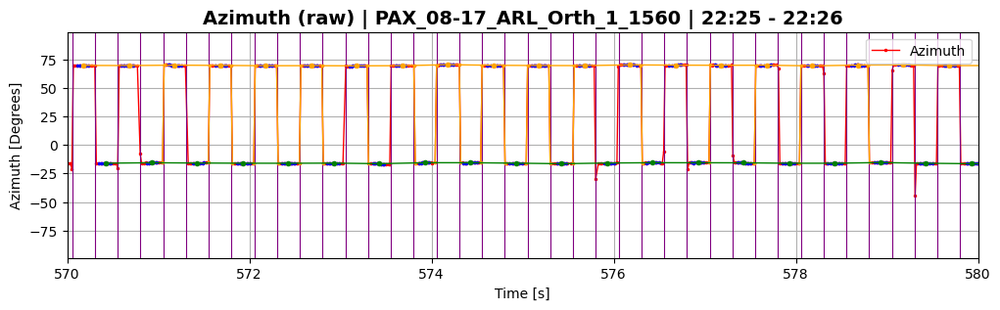

In [132]:
ds_1560.plot_raw(plot_param='Azimuth', sample_range=(570,580),plot_switch=True,plot_jumps=True,plot_valid=True,plot_avg=True)

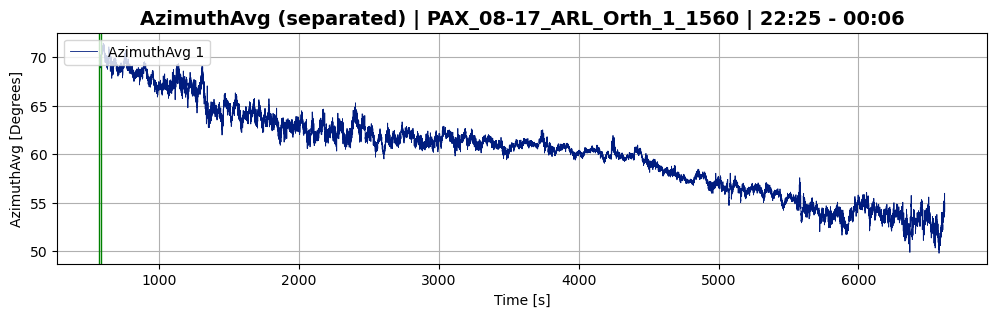

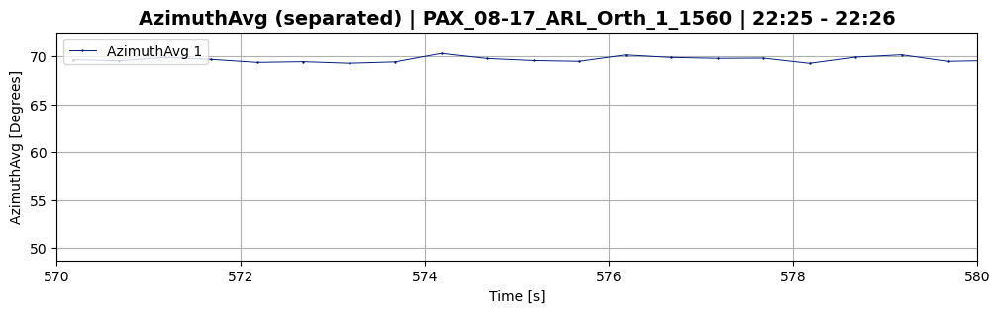

In [133]:
ds_1560.plot_separated(plot_param='AzimuthAvg',plot_signal=1,sample_range=(570,580))

In [134]:
reset_times_1560 = ds_1560.calc_stokes_ptf(reference=reset_times_1345, angle_threshold_deg=2, print_process=True);

Using provided reset times to reset reference matrix
Reference matrix was reset 34 times
Reset at time t=855.81
Reset at time t=1149.81
Reset at time t=1155.31
Reset at time t=1166.81
Reset at time t=1178.31
Reset at time t=1363.31
Reset at time t=1370.81
Reset at time t=1724.81
Reset at time t=1752.81
Reset at time t=1867.81
...


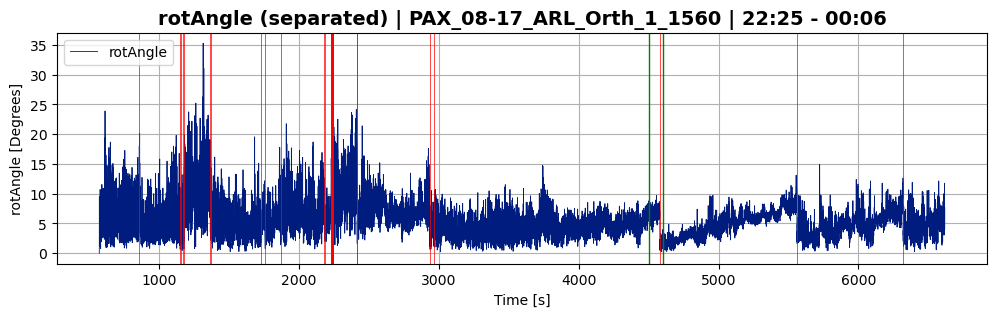

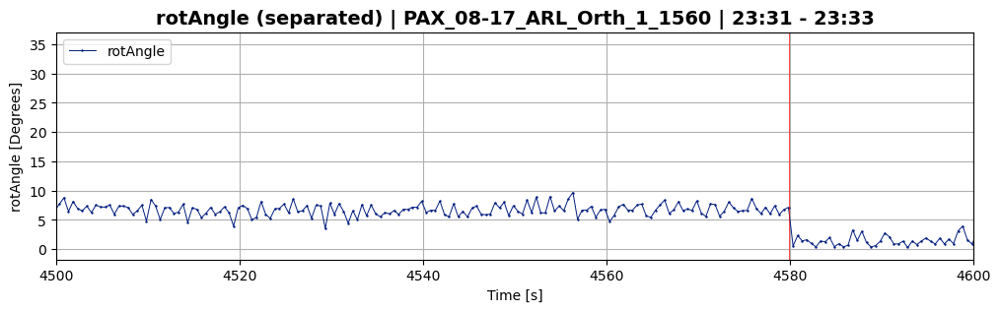

In [138]:
ds_1560.plot_separated(plot_param='rotAngle',plot_signal=1,sample_range=(4500,4600))

##### Both 1345 and 1560 rotAngle

In [136]:
ds_arl_08_17 = (ds_1345, ds_1560)

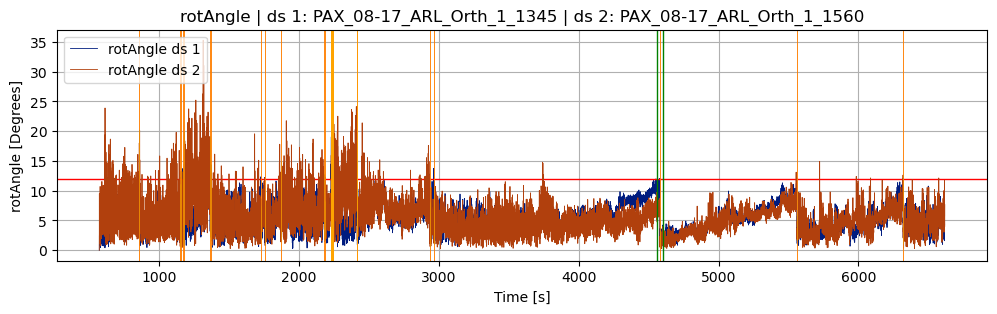

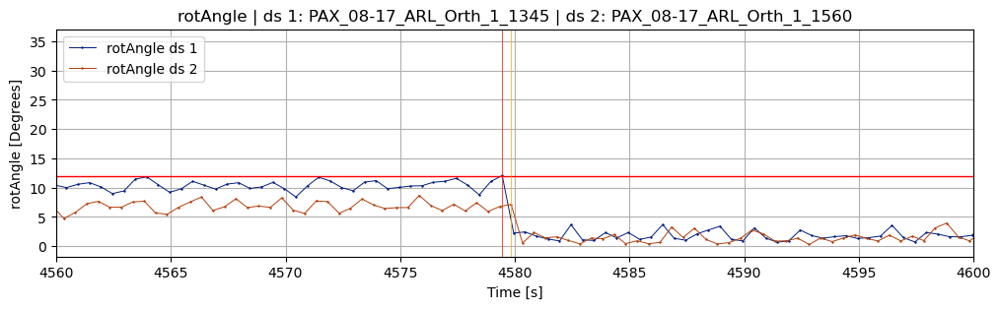

In [140]:
plot_rot_angle(ds_1345, ds_1560, birds_eye=True, sample_range=(4560,4600))

### ARL dataset 23-10-30

##### 1345 dataset

In [11]:
plt.ioff()
plt.close('all')

In [6]:
filename = DATA + 'Whole_setup/10-30/PAX_10-30_ARL_Orth_1345_desktop.csv'
ds_test = Dataset(filename,set_range=(0,0.01),skip_default_signal_baseline=False)

Time range: min=0.029, max=955.284


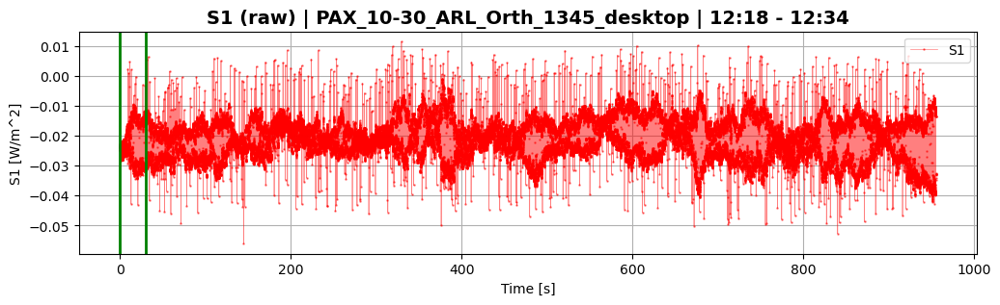

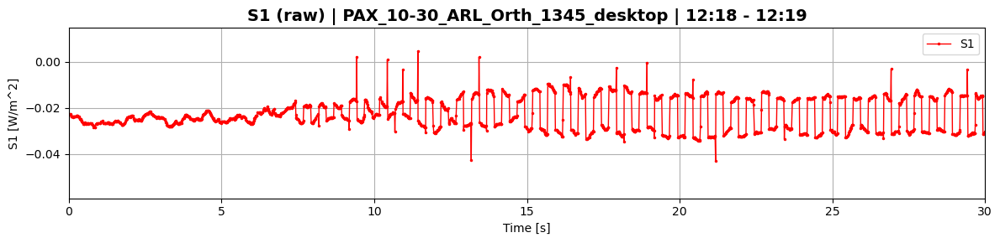

(<Figure size 1200x300 with 1 Axes>, <Figure size 1200x300 with 1 Axes>)

In [10]:
#ds_test.plot_raw(plot_param="S1",sample_range=(0,30))

Time range: min=20.0, max=3836.263
Determining change point ranges automatically...
Using change_point_range_1=(20.0, 120.0)
Using change_point_range_2=(3020.0, 3120.0)
=== performing change point detection ===
cp range: (20.0, 120.0)
using 7736 data entries
skipping 0 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (7736,)
computing range... ---> range = (0.15,0.20)
displaying jump_fig for switch parameter = s1



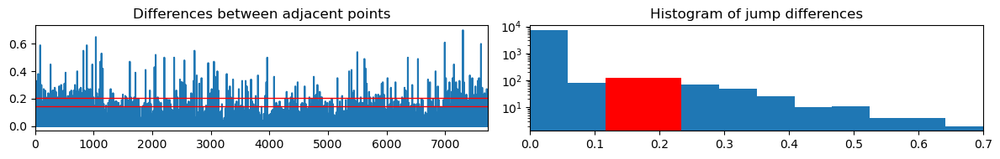



found width of 0.058 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (7736,)
computing range... ---> range = (0.06,0.11)
displaying jump_fig for switch parameter = s2



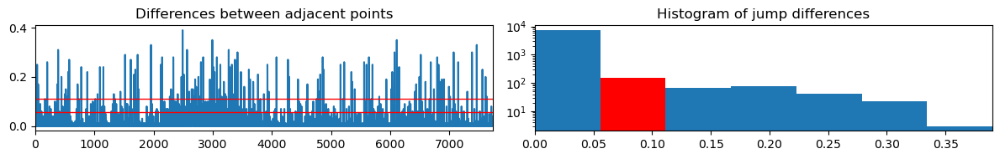



--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (7736,)
computing range... ---> range = (1.31,1.37)
displaying jump_fig for switch parameter = s3



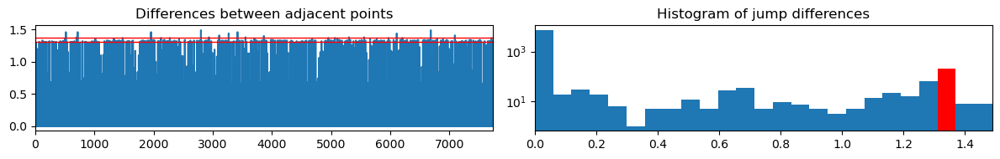



found width of 0.060 for s3
greater than prev width of 0.058 for s1
--- end of switch param: s3 ---

---> switch parameter found: s3 <---
finding differences within range = (1.31,1.37)
Jump points detected: 207
out of total: ~400.0

computing offset...


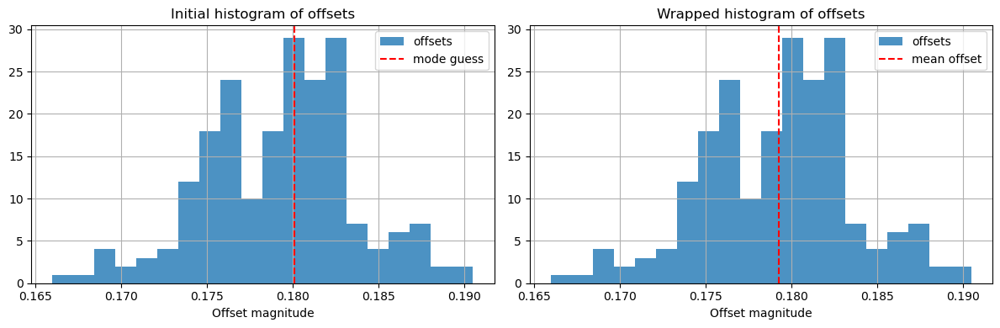



offset = 0.179 seconds
=== end change point detection ===
=== performing change point detection ===
cp range: (3020.0, 3120.0)
using 7707 data entries
skipping 232326 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (7707,)
computing range... ---> range = (0.77,0.83)
displaying jump_fig for switch parameter = s1



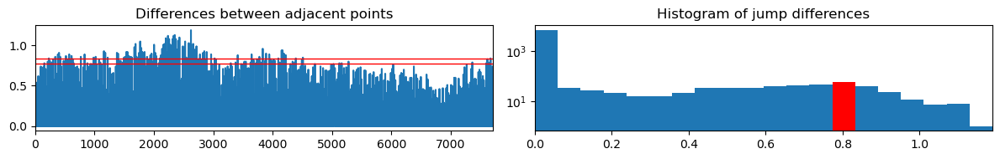



found width of 0.059 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (7707,)
computing range... ---> range = (1.14,1.19)
displaying jump_fig for switch parameter = s2



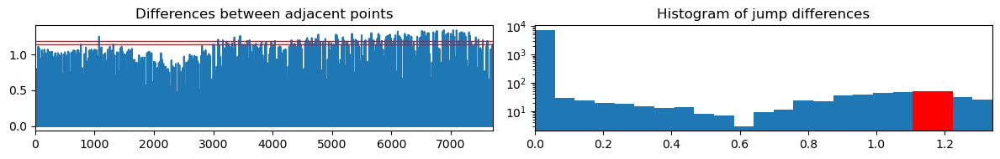



--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (7707,)
computing range... ---> range = (0.09,0.15)
displaying jump_fig for switch parameter = s3



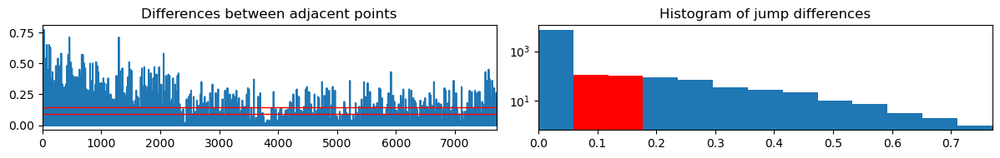



--- end of switch param: s3 ---

---> switch parameter found: s1 <---
finding differences within range = (0.77,0.83)
Jump points detected: 57
out of total: ~400.0

computing offset...


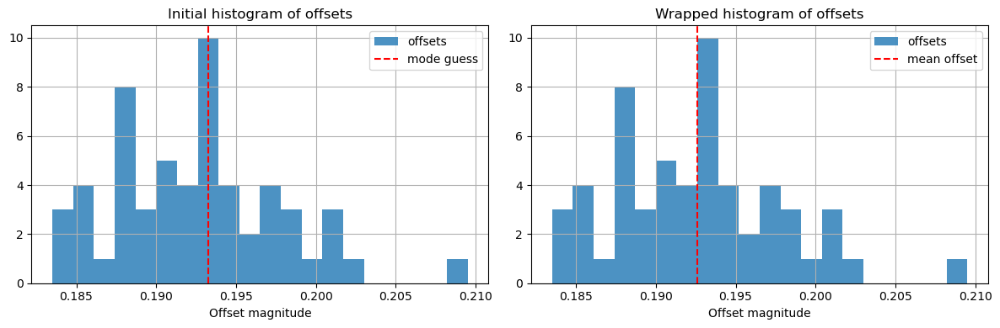



offset = 0.193 seconds
=== end change point detection ===
Nominal Switch Time = 0.2500000
Offset change of 0.013 seconds over 12000.0 switches
Corrected Switch Time = 0.2500011


In [16]:
filename = DATA + 'Whole_setup/10-30/PAX_10-30_ARL_Orth_1345_desktop.csv'
ds_1345 = SwitchSet(filename, set_range=(0,0.04), skip_default_signal_baseline=20)
ds_1345.find_switches(nominal_switch_rate=2, print_process=True)

In [30]:
ds_1345.average_data(print_process=True)

=== starting average_data ===
averaging data... Done
Dropped 0 observations with <4 points (out of total 15264 observations)

--- interpolating data ---
length before: 7632
length after: 7632
0 total added
--- end interpolating data ---

--- interpolating data ---
length before: 7632
length after: 7632
0 total added
--- end interpolating data ---
Signal 1 size=7632	Signal 1 range: t=(20.55,3836.07)
Signal 2 size=7632	Signal 2 range: t=(20.30,3835.82)
=== end average_data ===


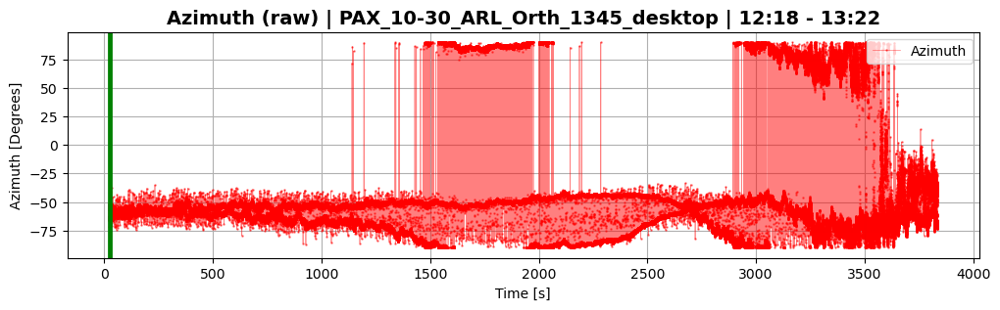

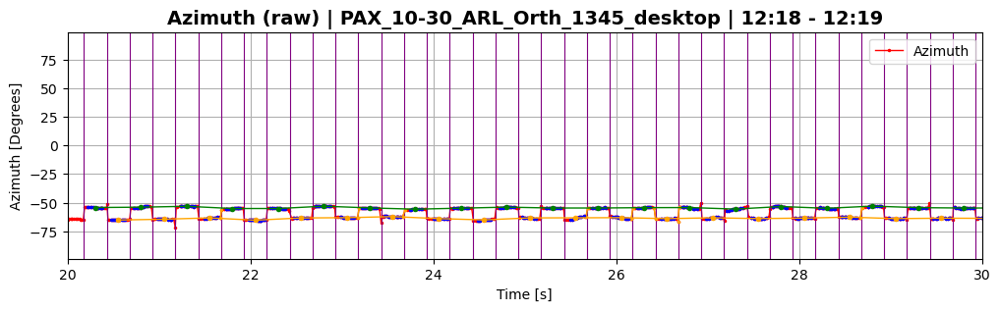

In [31]:
ds_1345.plot_raw(plot_param='Azimuth', sample_range=(20,30),plot_switch=True,plot_jumps=True,plot_valid=True,plot_avg=True)

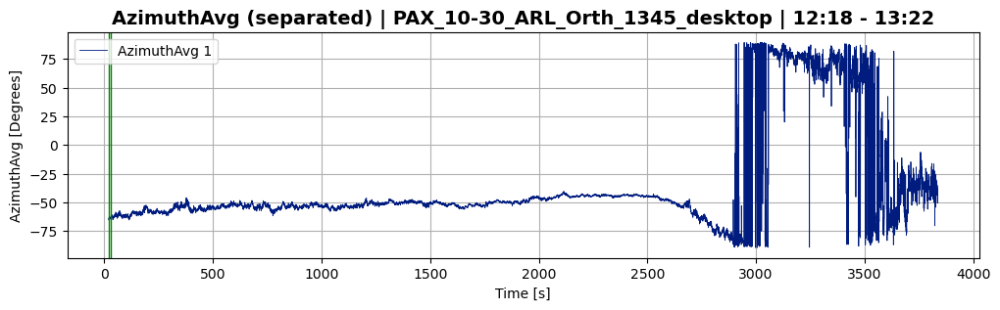

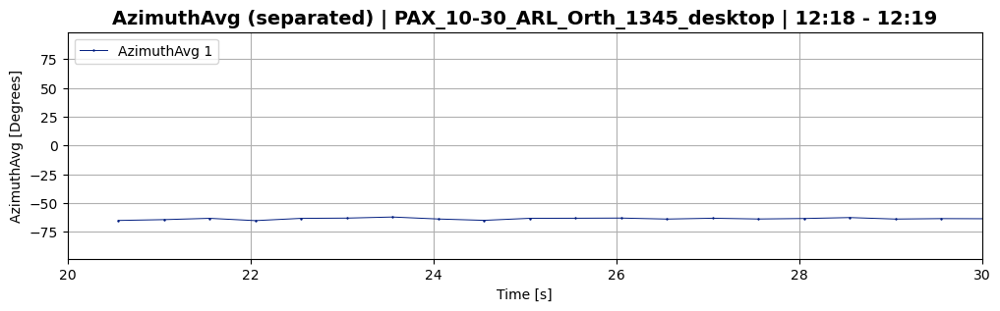

In [32]:
ds_1345.plot_separated(plot_param='AzimuthAvg',plot_signal=1,sample_range=(20,30))

In [43]:
reset_times_1345 = ds_1345.calc_stokes_ptf(reference=None, angle_threshold_deg=20, print_process=True);

Using "resetting reference SOPs" approach with threshold = 20.0 degrees


/tmp/ipykernel_137629/1855016075.py:983: RuntimeWarning:

invalid value encountered in arccos



Reference matrix was reset 351 times
Reset at time t=183.93
Reset at time t=678.43
Reset at time t=686.93
Reset at time t=1313.43
Reset at time t=1474.94
Reset at time t=1686.44
Reset at time t=1836.94
Reset at time t=2110.94
Reset at time t=2324.94
Reset at time t=2454.94
...


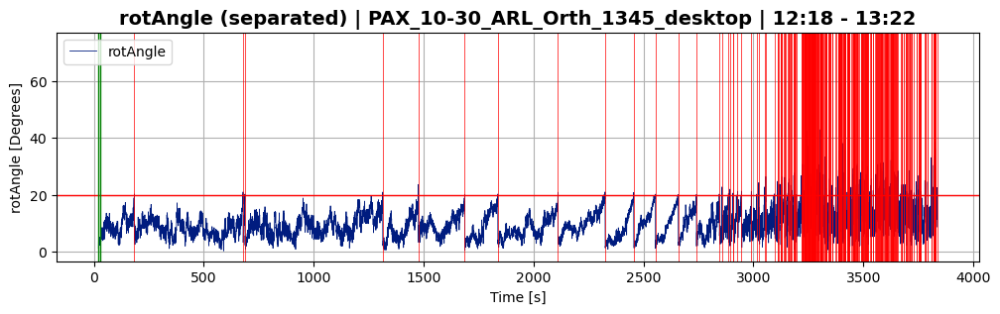

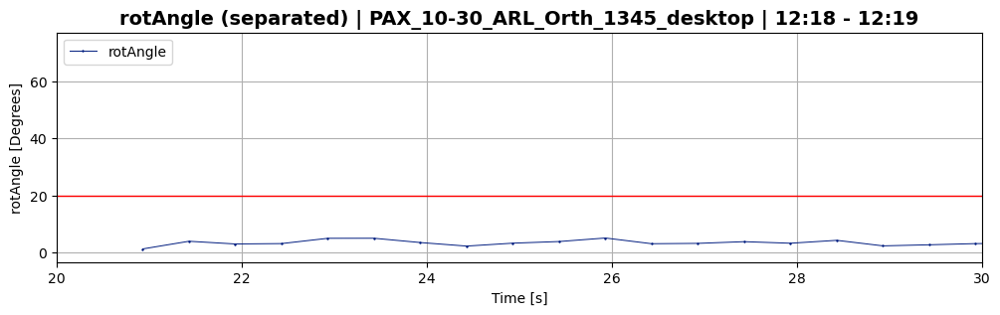

In [44]:
ds_1345.plot_separated(plot_param='rotAngle',sample_range=(20,30))

##### 1560 dataset

Time range: min=20.005, max=4035.361
Determining change point ranges automatically...
Using change_point_range_1=(20.005, 120.005)
Using change_point_range_2=(3020.005, 3120.005)
=== performing change point detection ===
cp range: (20.005, 120.005)
using 5029 data entries
skipping 0 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (5029,)
computing range... ---> range = (0.09,0.15)
displaying jump_fig for switch parameter = s1



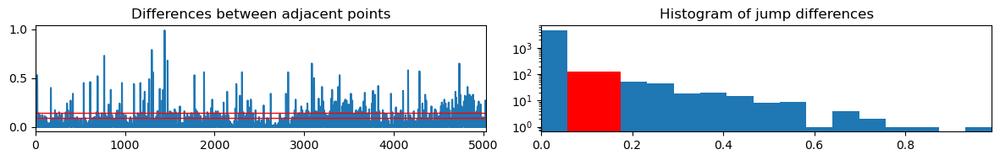



found width of 0.058 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (5029,)
computing range... ---> range = (1.03,1.08)
displaying jump_fig for switch parameter = s2



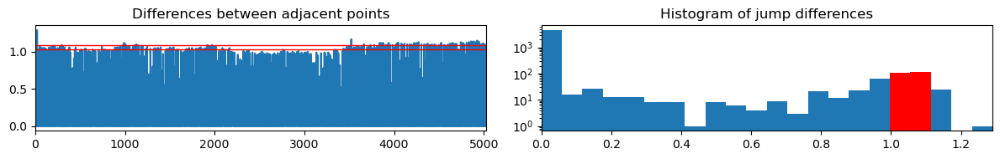



found width of 0.059 for s2
greater than prev width of 0.058 for s1
--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (5029,)
computing range... ---> range = (0.92,0.98)
displaying jump_fig for switch parameter = s3



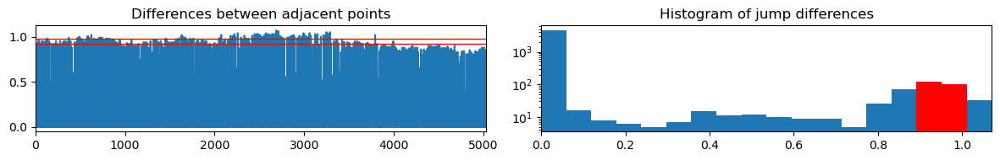



found width of 0.059 for s3
greater than prev width of 0.059 for s2
--- end of switch param: s3 ---

---> switch parameter found: s3 <---
finding differences within range = (0.92,0.98)
Jump points detected: 122
out of total: ~399.9

computing offset...


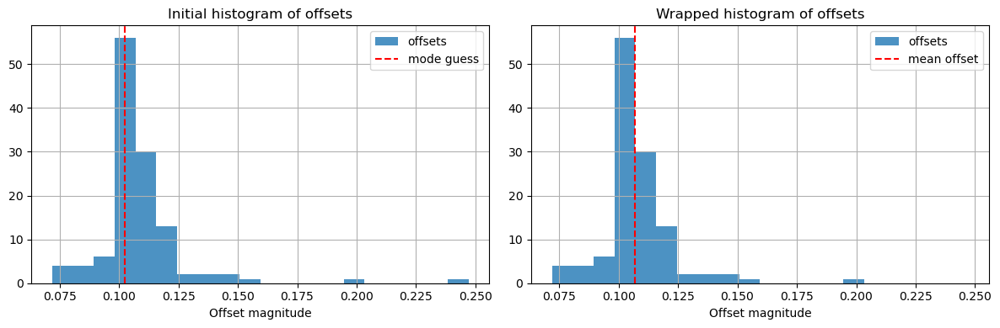



offset = 0.107 seconds
=== end change point detection ===
=== performing change point detection ===
cp range: (3020.005, 3120.005)
using 5168 data entries
skipping 150647 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (5168,)
computing range... ---> range = (1.13,1.19)
displaying jump_fig for switch parameter = s1



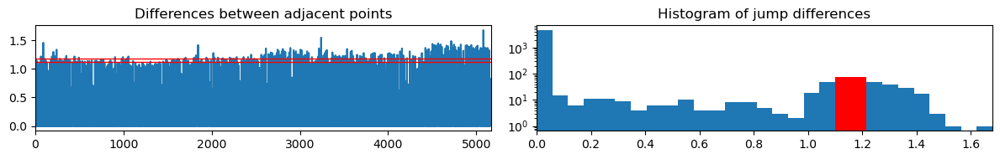



found width of 0.058 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (5168,)
computing range... ---> range = (0.08,0.14)
displaying jump_fig for switch parameter = s2



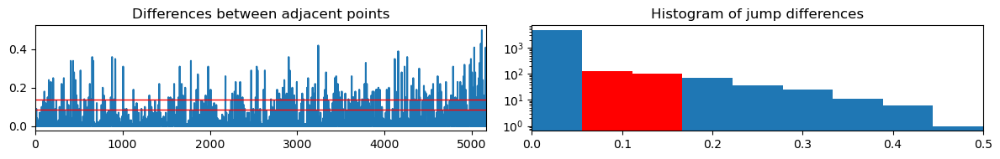



--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (5168,)
computing range... ---> range = (0.80,0.86)
displaying jump_fig for switch parameter = s3



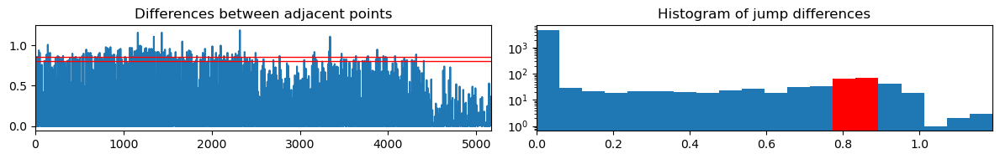



found width of 0.059 for s3
greater than prev width of 0.058 for s1
--- end of switch param: s3 ---

---> switch parameter found: s3 <---
finding differences within range = (0.80,0.86)
Jump points detected: 79
out of total: ~399.8

computing offset...


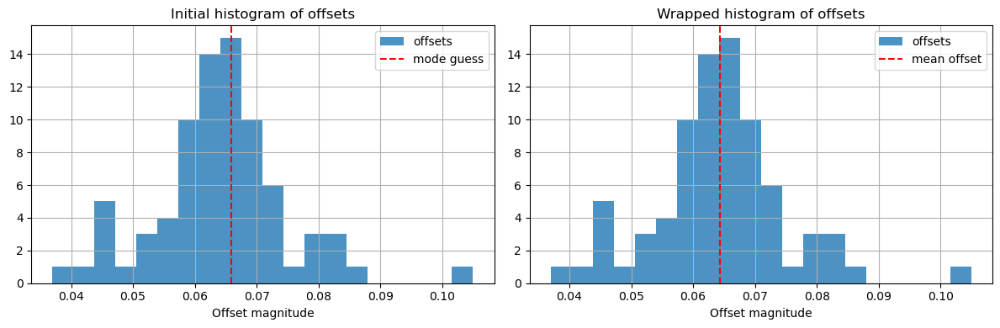



offset = 0.064 seconds
=== end change point detection ===
Nominal Switch Time = 0.2500000
Offset change of -0.043 seconds over 12000.0 switches
Corrected Switch Time = 0.2499964


In [35]:
filename = 'Datasets/Whole_setup/10-30/PAX_10-30_ARL_Orth_1560_laptop.csv'
ds_1560 = SwitchSet(filename, set_range=(0,0.056), skip_default_signal_baseline=20)
ds_1560.find_switches(nominal_switch_rate=2, print_process=True)

In [36]:
ds_1560.average_data(print_process=True)

=== starting average_data ===
averaging data... Done
Dropped 834 observations with <4 points (out of total 15847 observations)

--- interpolating data ---
length before: 7499
length after: 8031
532 total added
--- end interpolating data ---

--- interpolating data ---
length before: 7514
length after: 8030
516 total added
--- end interpolating data ---
Signal 1 size=8030	Signal 1 range: t=(20.48,4034.93)
Signal 2 size=8031	Signal 2 range: t=(20.23,4035.18)
=== end average_data ===


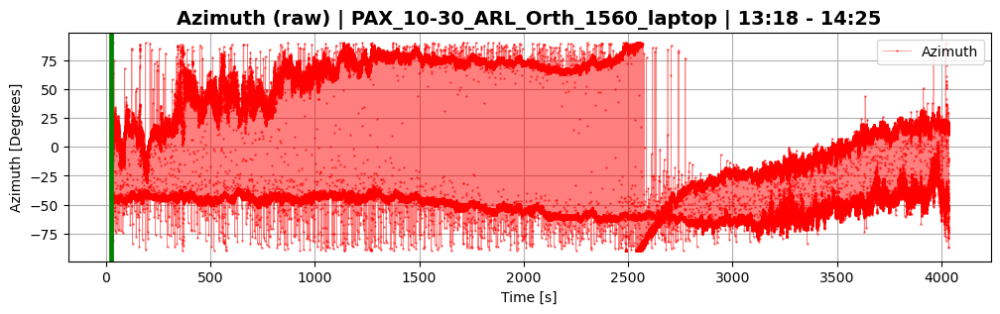

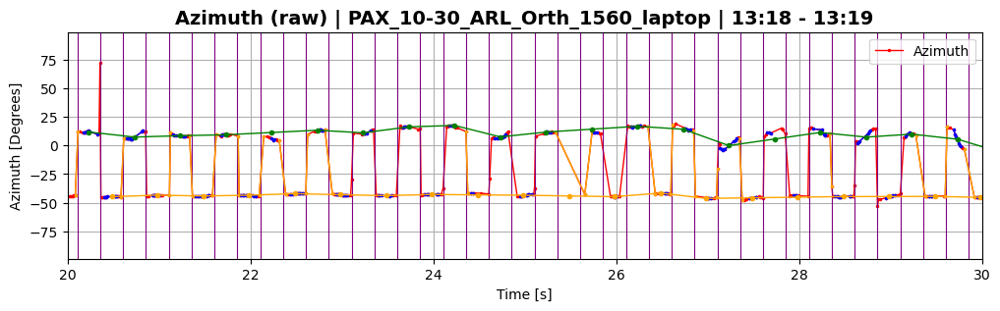

In [37]:
ds_1560.plot_raw(plot_param='Azimuth', sample_range=(20,30),plot_switch=True,plot_jumps=True,plot_valid=True,plot_avg=True)

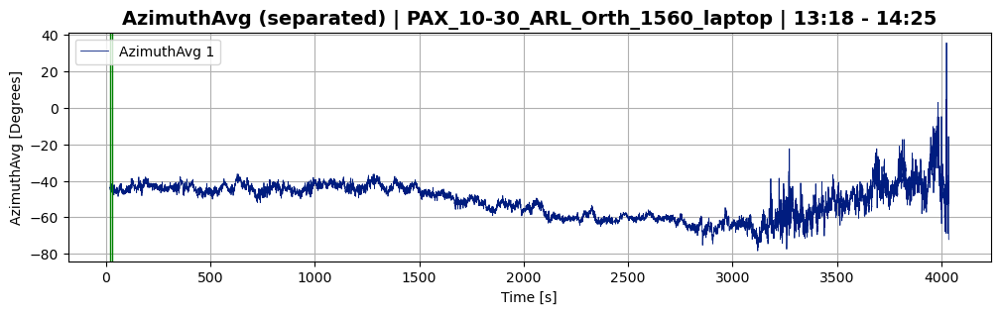

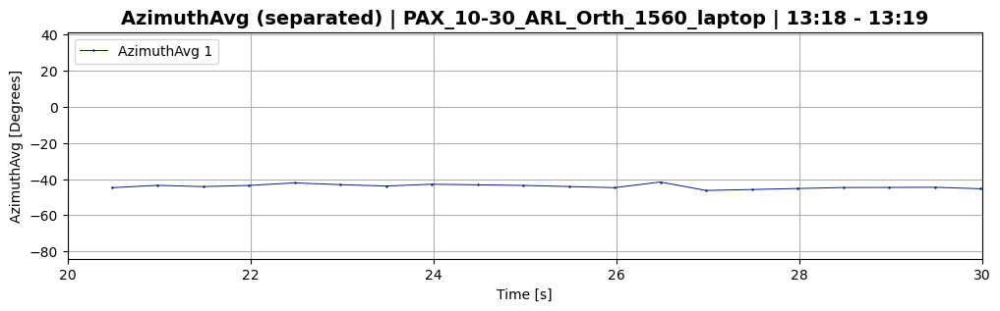

In [38]:
ds_1560.plot_separated(plot_param='AzimuthAvg',plot_signal=1,sample_range=(20,30))

In [45]:
reset_times_1560 = ds_1560.calc_stokes_ptf(reference=reset_times_1345, reset_delay=5, print_process=True);

Using provided reset times to reset reference matrix
Reference matrix was reset 351 times
Reset at time t=189.36
Reset at time t=683.85
Reset at time t=692.35
Reset at time t=1318.84
Reset at time t=1480.34
Reset at time t=1691.83
Reset at time t=1842.33
Reset at time t=2116.33
Reset at time t=2330.32
Reset at time t=2460.32
...


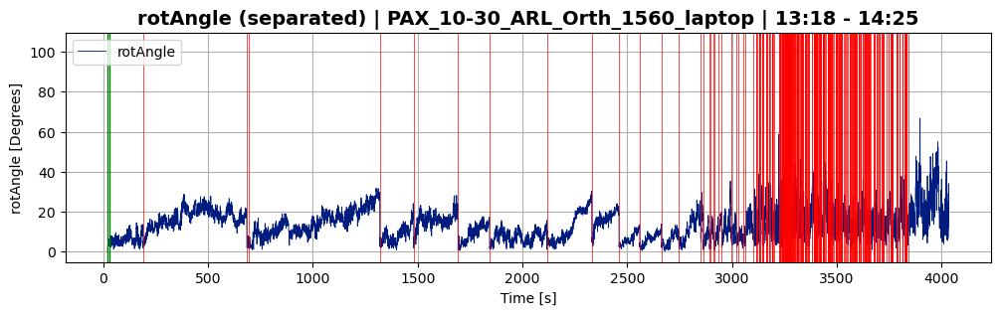

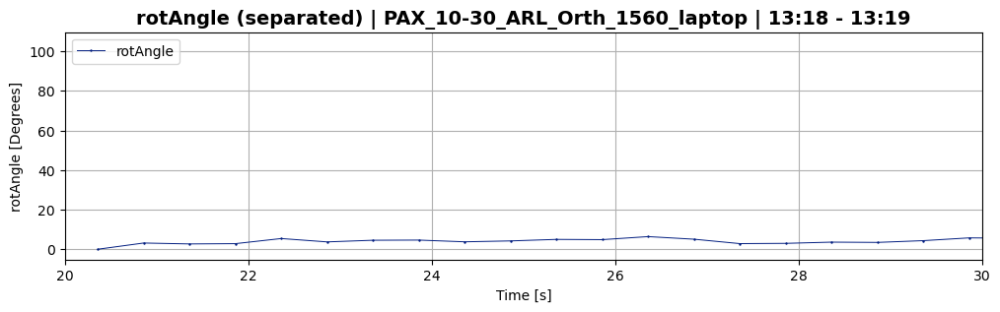

In [46]:
ds_1560.plot_separated(plot_param='rotAngle',sample_range=(20,30))

##### Both 1345 and 1560 rotAngle

In [47]:
ds_arl_10_30 = (ds_1345, ds_1560)

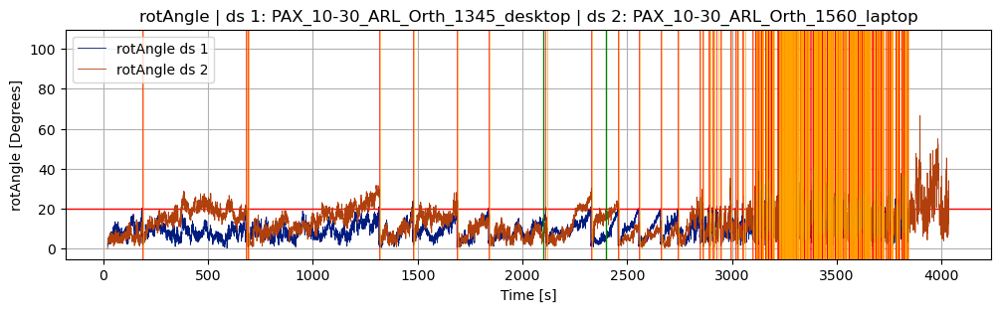

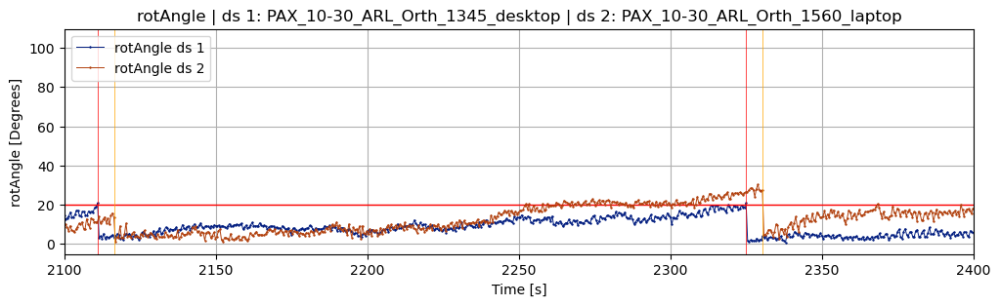

In [77]:
plot_rot_angle(ds_arl_10_30[0], ds_arl_10_30[1], birds_eye=True, sample_range=(2100,2400))

In [78]:
import statistics
statistics.mean(reset_times_1560)

1276.6427284609322

### ARL dataset 24-03-11

1345 -> 18:56 - 18:56

    * 86400 seconds

1560 -> 19:57 - 19:57

    * 86400 seconds

Times probably messed up because of daylight savings??

##### 1345 dataset

In [5]:
plt.ioff()
plt.close('all')

In [31]:
filename = DATA + 'Whole_setup/24-03-11/PAX_3-11_ARL_Orth_1345_desktop.csv'
ds_test = Dataset(filename,set_range=(None,0.001),skip_default_signal_baseline=False)

Time range: min=0.06, max=95.742


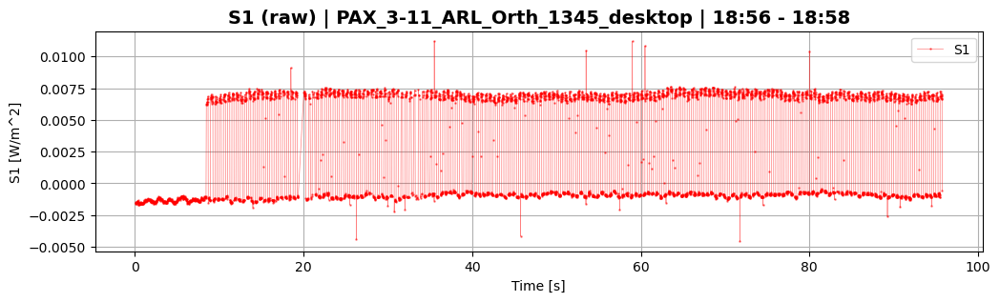

(<Figure size 1200x300 with 1 Axes>, None)

In [32]:
ds_test.plot_raw(plot_param="S1")

Time range: min=22049.152, max=30954.769
Determining change point ranges automatically...
Using change_point_range_1=(22049.152, 22149.152)
Using change_point_range_2=(25049.152, 25149.152)
=== performing change point detection ===
cp range: (22049.152, 22149.152)
using 5971 data entries
skipping 0 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (5971,)
computing range... ---> range = (1.19,1.25)
displaying jump_fig for switch parameter = s1



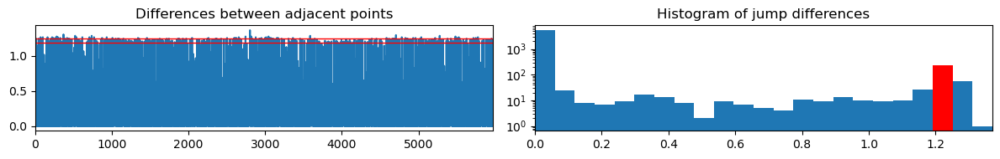



found width of 0.060 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (5971,)
computing range... ---> range = (0.43,0.49)
displaying jump_fig for switch parameter = s2



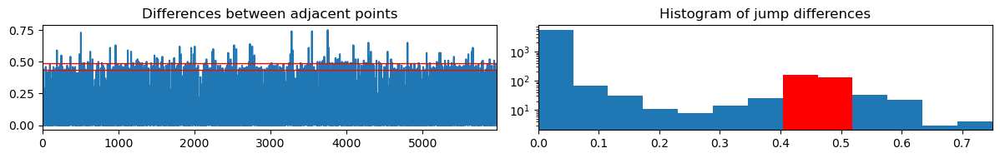



--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (5971,)
computing range... ---> range = (0.36,0.42)
displaying jump_fig for switch parameter = s3



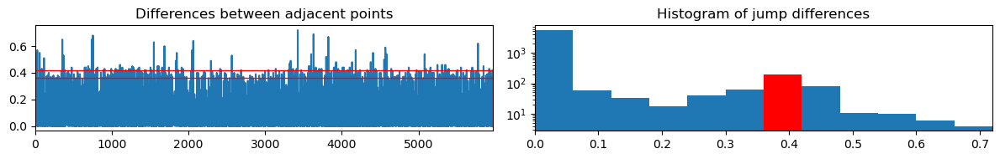



found width of 0.060 for s3
greater than prev width of 0.060 for s1
--- end of switch param: s3 ---

---> switch parameter found: s3 <---
finding differences within range = (0.36,0.42)
Jump points detected: 206
out of total: ~400.0

computing offset...


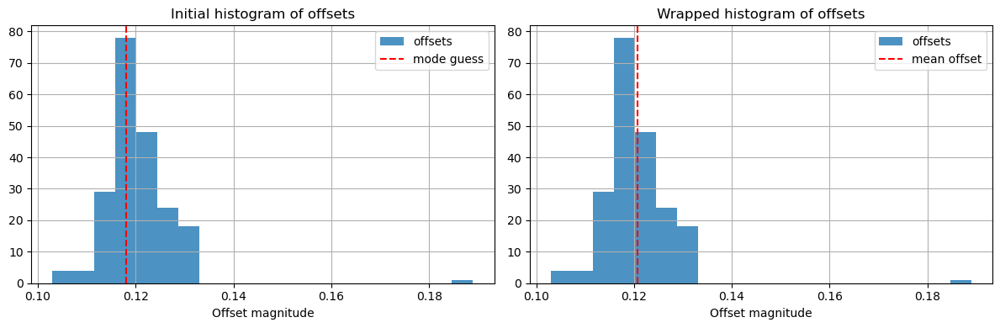



offset = 0.121 seconds
=== end change point detection ===
=== performing change point detection ===
cp range: (25049.152, 25149.152)
using 5955 data entries
skipping 179259 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (5955,)
computing range... ---> range = (1.32,1.38)
displaying jump_fig for switch parameter = s1



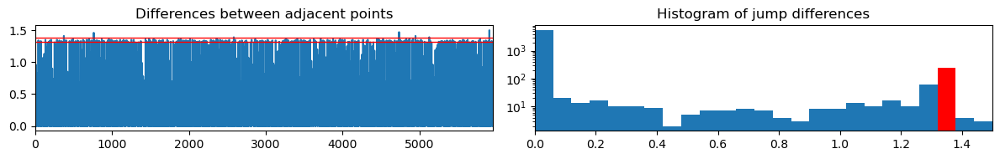



found width of 0.060 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (5955,)
computing range... ---> range = (0.28,0.34)
displaying jump_fig for switch parameter = s2



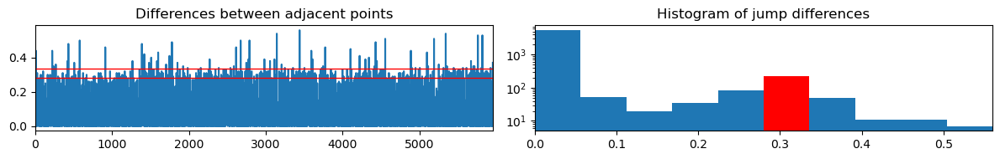



--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (5955,)
computing range... ---> range = (0.11,0.17)
displaying jump_fig for switch parameter = s3



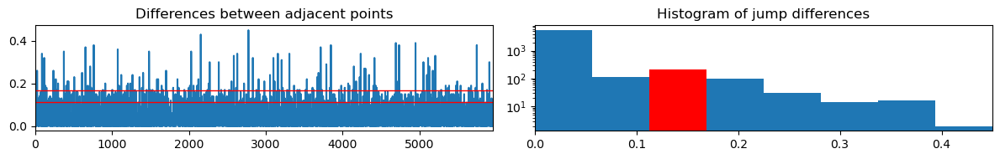



--- end of switch param: s3 ---

---> switch parameter found: s1 <---
finding differences within range = (1.32,1.38)
Jump points detected: 246
out of total: ~399.9

computing offset...


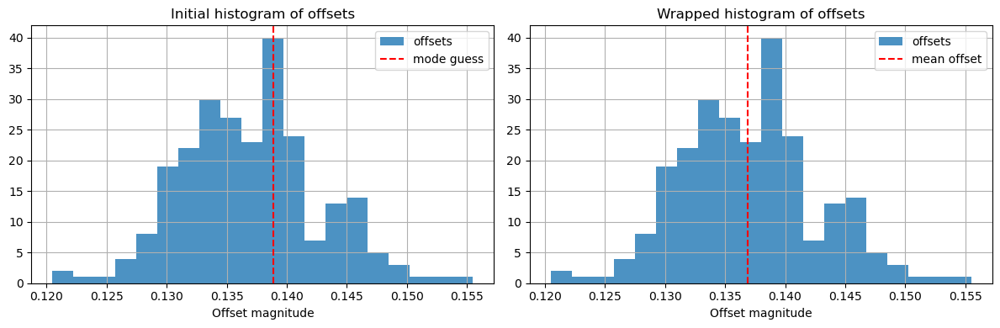



offset = 0.137 seconds
=== end change point detection ===
Nominal Switch Time = 0.2500000
Offset change of 0.016 seconds over 12000.0 switches
Corrected Switch Time = 0.2500013


In [117]:
filename = DATA + 'Whole_setup/24-03-11/PAX_3-11_ARL_Orth_1345_desktop.csv'
ds_1345 = SwitchSet(filename, set_range=(0.25,0.35), skip_default_signal_baseline=25)
ds_1345.find_switches(nominal_switch_rate=2, print_process=True)

In [118]:
ds_1345.average_data(print_process=True)

=== starting average_data ===
averaging data... Done
Dropped 35 observations with <4 points (out of total 35592 observations)

--- interpolating data ---
length before: 17776
length after: 17810
34 total added
--- end interpolating data ---

--- interpolating data ---
length before: 17781
length after: 17811
30 total added
--- end interpolating data ---
Signal 1 size=17810	Signal 1 range: t=(22049.75,30954.29)
Signal 2 size=17811	Signal 2 range: t=(22049.50,30954.54)
=== end average_data ===


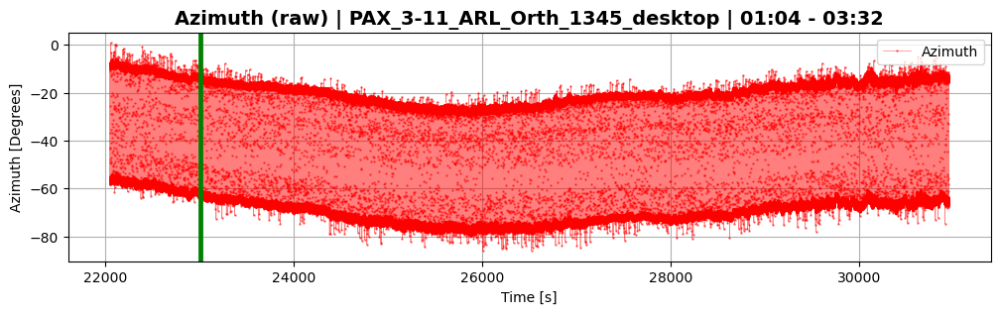

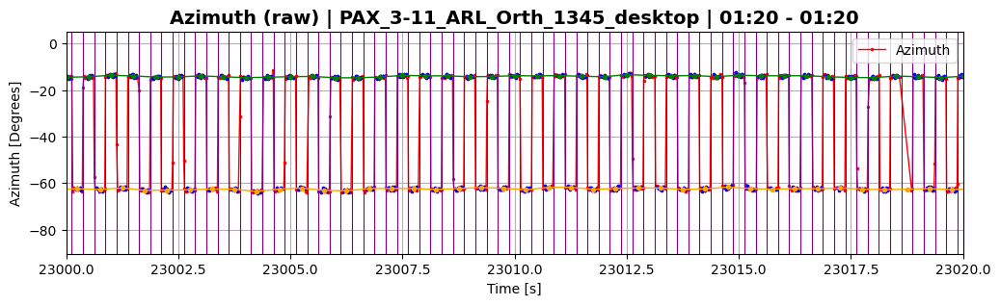

In [119]:
ds_1345.plot_raw(plot_param='Azimuth', sample_range=(23000,23020),plot_switch=True,plot_jumps=True,plot_valid=True,plot_avg=True)

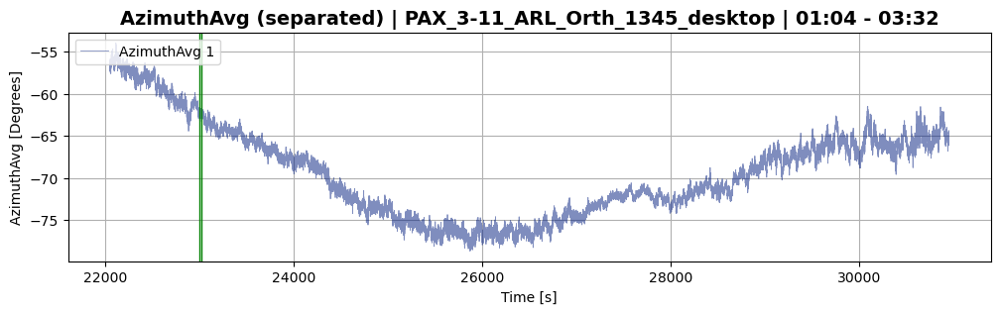

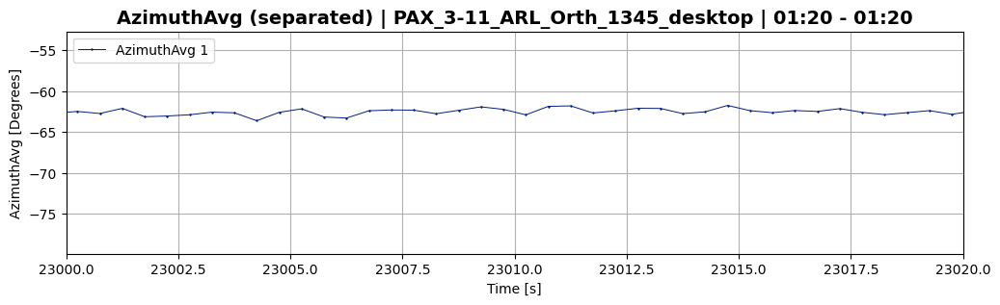

In [120]:
ds_1345.plot_separated(plot_param='AzimuthAvg',plot_signal=1,sample_range=(23000,23020))

In [121]:
reset_times_1345 = ds_1345.calc_stokes_ptf(reference=None, angle_threshold_deg=10, reset_by_rolling=True, rolling_pts=30, print_process=True);

Using "resetting reference SOPs" approach with threshold = 10.0 degrees
Reference matrix was reset 6 times
Reset at time t=22762.62
Reset at time t=23725.63
Reset at time t=24626.13
Reset at time t=28858.16
Reset at time t=30092.66
Reset at time t=30360.17


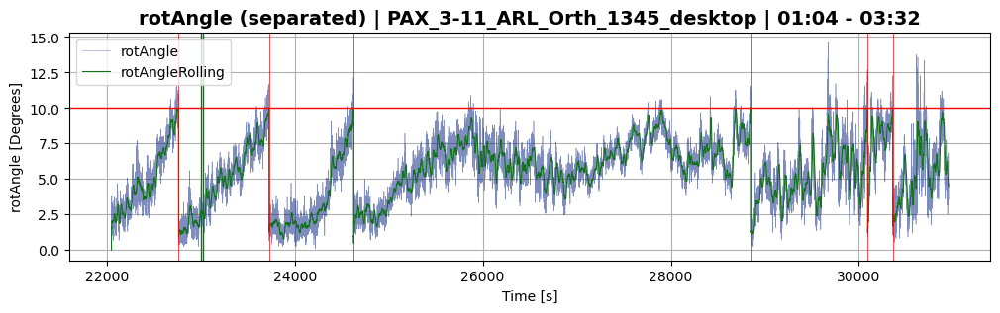

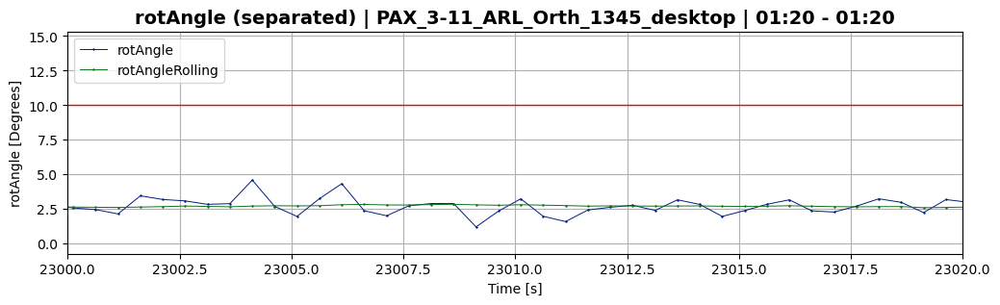

In [122]:
ds_1345.plot_separated(plot_param='rotAngle',sample_range=(23000,23020))

##### 1560 dataset

In [29]:
filename = DATA + 'Whole_setup/24-03-11/PAX_3-11_ARL_Orth_1560_laptop.csv'
ds_test = Dataset(filename,set_range=(0.999,None),skip_default_signal_baseline=False)

Time range: min=86324.937, max=86400.013


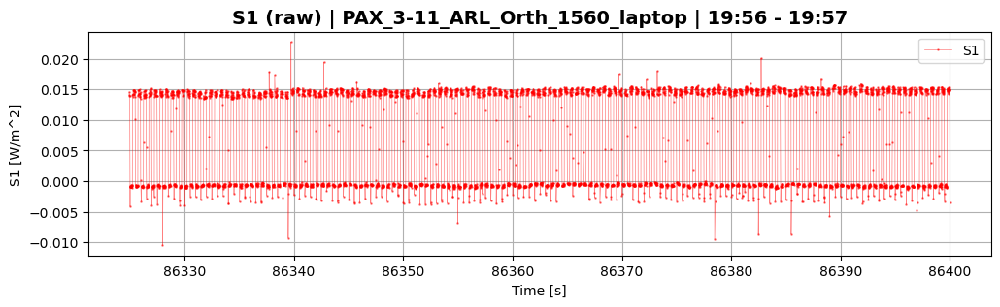

(<Figure size 1200x300 with 1 Axes>, None)

In [30]:
ds_test.plot_raw(plot_param="S1")

Time range: min=22651.678, max=31719.131
Determining change point ranges automatically...
Using change_point_range_1=(22651.678, 22751.678)
Using change_point_range_2=(25651.678, 25751.678)
=== performing change point detection ===
cp range: (22651.678, 22751.678)
using 5869 data entries
skipping 0 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (5869,)
computing range... ---> range = (0.21,0.27)
displaying jump_fig for switch parameter = s1



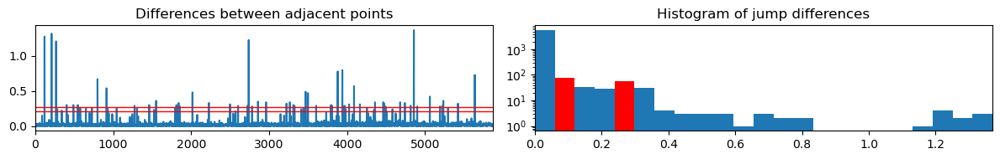



found width of 0.060 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (5869,)
computing range... ---> range = (0.15,0.21)
displaying jump_fig for switch parameter = s2



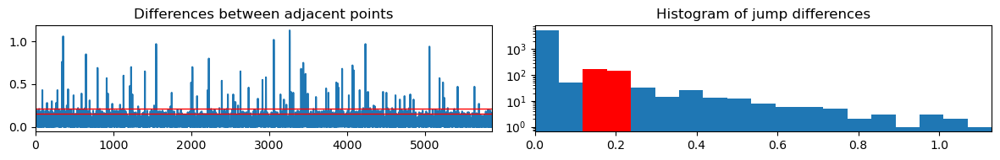



--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (5869,)
computing range... ---> range = (1.38,1.44)
displaying jump_fig for switch parameter = s3



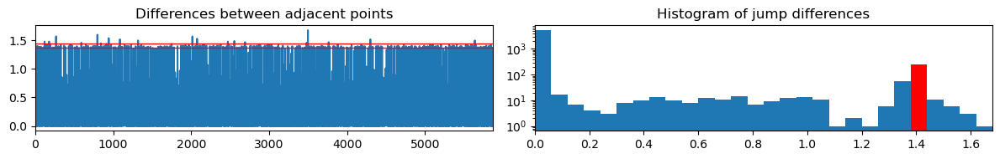



found width of 0.060 for s3
greater than prev width of 0.060 for s1
--- end of switch param: s3 ---

---> switch parameter found: s3 <---
finding differences within range = (1.38,1.44)
Jump points detected: 247
out of total: ~400.0

computing offset...


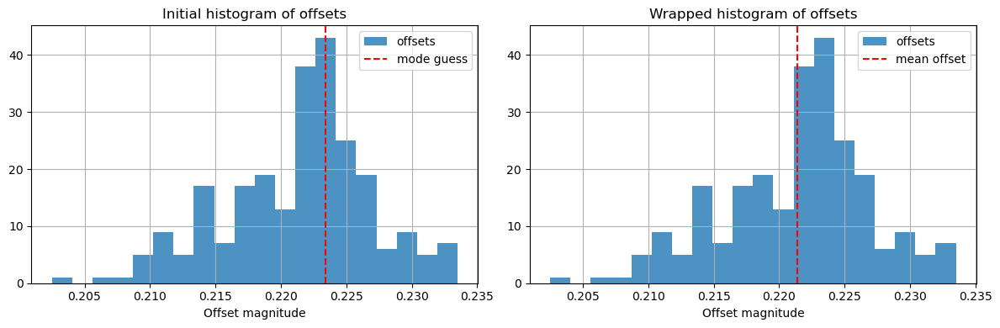



offset = 0.221 seconds
=== end change point detection ===
=== performing change point detection ===
cp range: (25651.678, 25751.678)
using 5902 data entries
skipping 176401 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (5902,)
computing range... ---> range = (0.15,0.20)
displaying jump_fig for switch parameter = s1



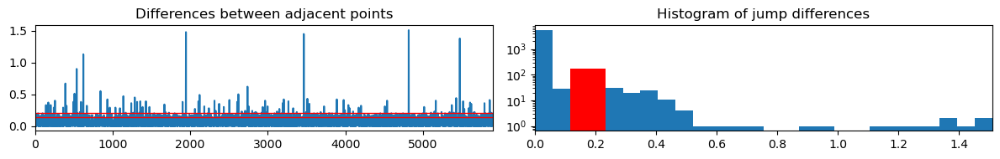



found width of 0.058 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (5902,)
computing range... ---> range = (0.06,0.12)
displaying jump_fig for switch parameter = s2



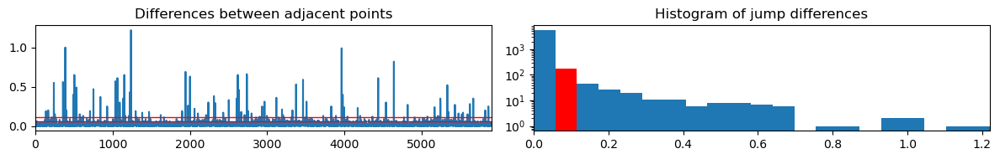



found width of 0.058 for s2
greater than prev width of 0.058 for s1
--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (5902,)
computing range... ---> range = (1.36,1.42)
displaying jump_fig for switch parameter = s3



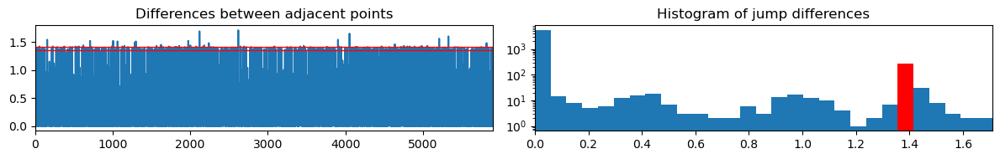



found width of 0.059 for s3
greater than prev width of 0.058 for s2
--- end of switch param: s3 ---

---> switch parameter found: s3 <---
finding differences within range = (1.36,1.42)
Jump points detected: 277
out of total: ~400.0

computing offset...


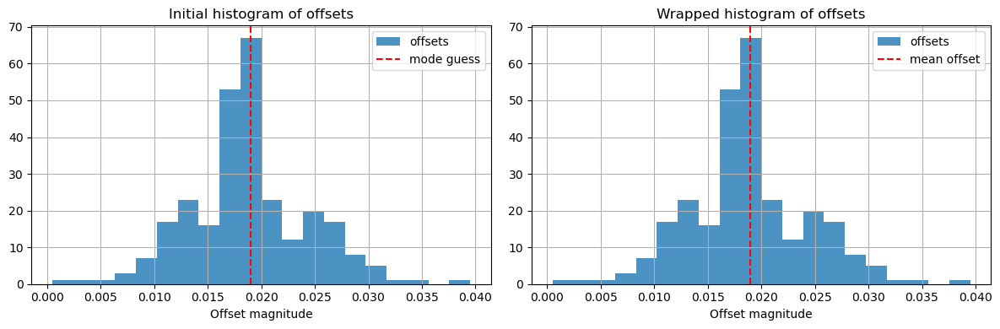



offset = 0.019 seconds
=== end change point detection ===
Nominal Switch Time = 0.2500000
Offset change of 0.048 seconds over 12000.0 switches
Corrected Switch Time = 0.2500040


In [123]:
filename = DATA + 'Whole_setup/24-03-11/PAX_3-11_ARL_Orth_1560_laptop.csv'
ds_1560 = SwitchSet(filename, set_range=(0.25,0.35), skip_default_signal_baseline=25)
ds_1560.find_switches(nominal_switch_rate=2, print_process=True)

In [124]:
ds_1560.average_data(print_process=True)

=== starting average_data ===
averaging data... Done
Dropped 0 observations with <4 points (out of total 36264 observations)

--- interpolating data ---
length before: 18133
length after: 18134
1 total added
--- end interpolating data ---

--- interpolating data ---
length before: 18131
length after: 18133
2 total added
--- end interpolating data ---
Signal 1 size=18134	Signal 1 range: t=(22652.10,31718.74)
Signal 2 size=18133	Signal 2 range: t=(22652.35,31718.49)
=== end average_data ===


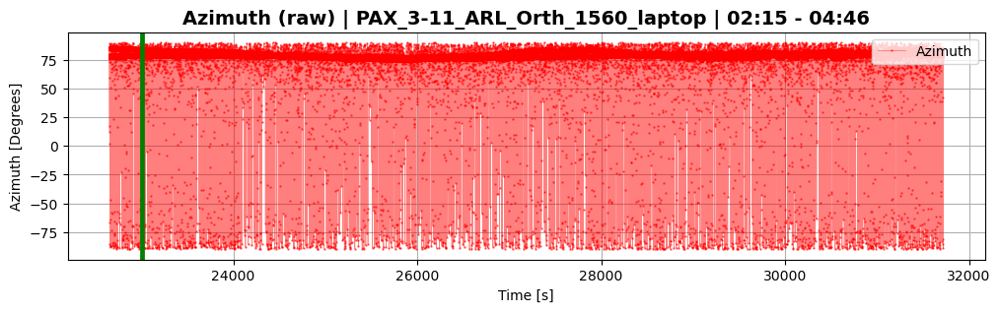

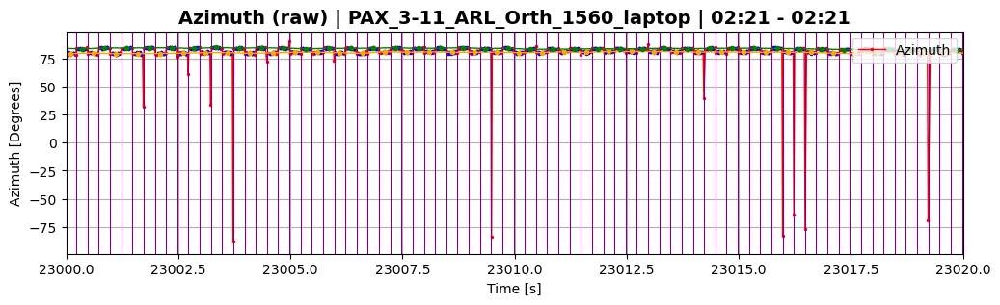

In [125]:
ds_1560.plot_raw(plot_param='Azimuth', sample_range=(23000,23020),plot_switch=True,plot_jumps=True,plot_valid=True,plot_avg=True)

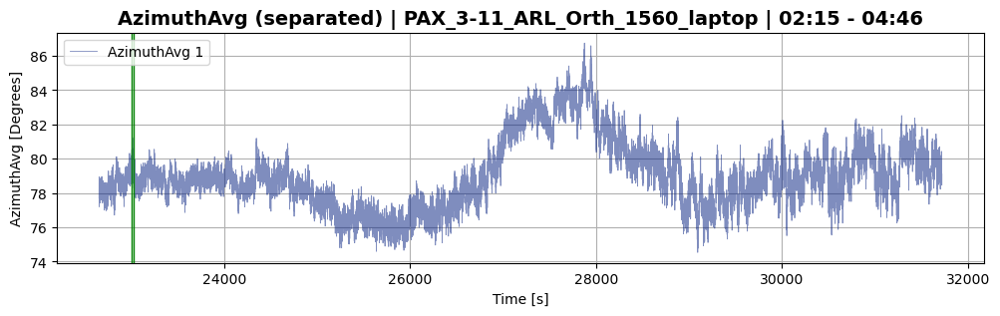

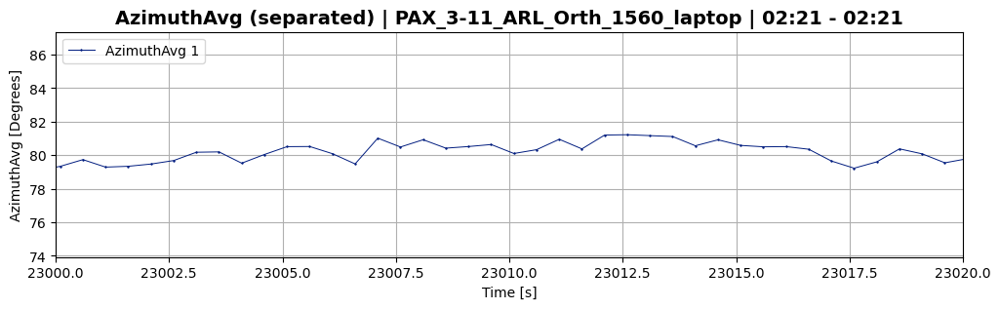

In [126]:
ds_1560.plot_separated(plot_param='AzimuthAvg',plot_signal=1,sample_range=(23000,23020))

In [127]:
reset_times_1560 = ds_1560.calc_stokes_ptf(reference=reset_times_1345, rolling_pts=30, print_process=True);

Using provided reset times to reset reference matrix
Reference matrix was reset 6 times
Reset at time t=22762.72
Reset at time t=23725.74
Reset at time t=24626.25
Reset at time t=28858.32
Reset at time t=30092.84
Reset at time t=30360.34


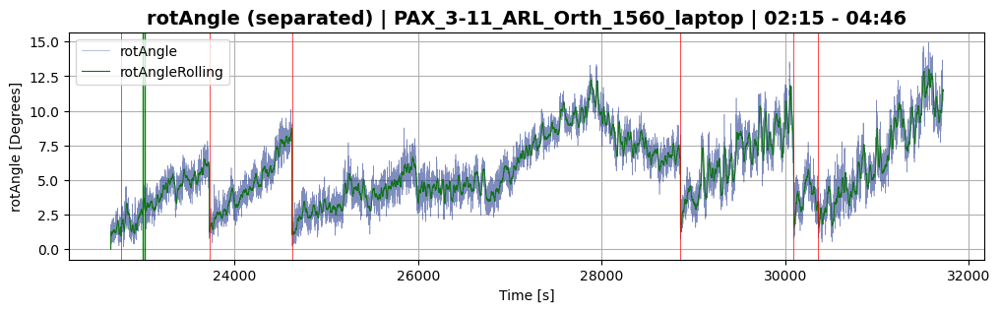

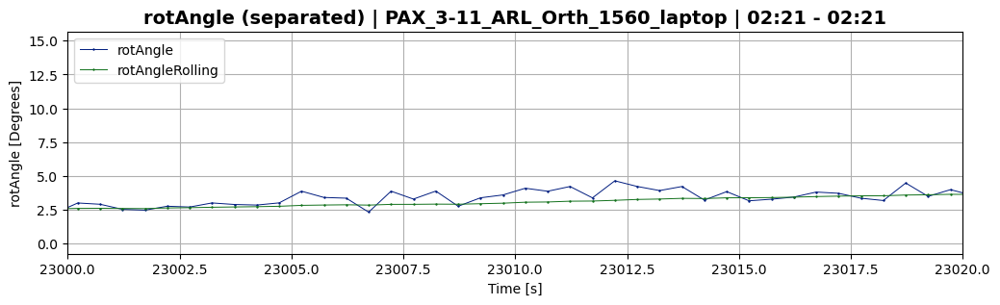

In [128]:
ds_1560.plot_separated(plot_param='rotAngle',sample_range=(23000,23020))

##### Both 1345 and 1560 rotAngle

In [129]:
ds_arl_24_03_11 = (ds_1345, ds_1560)

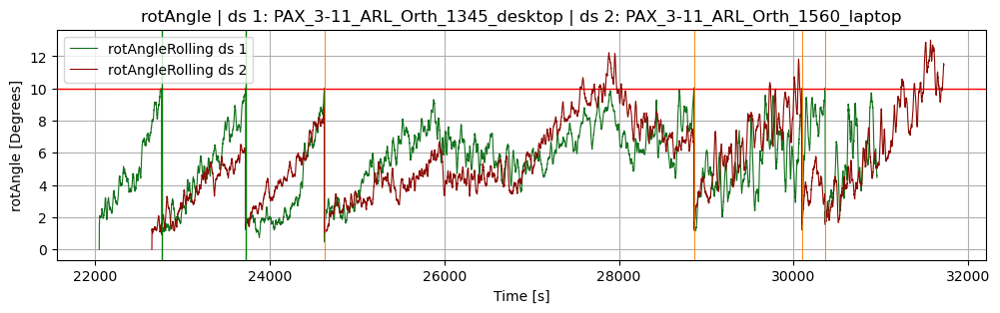

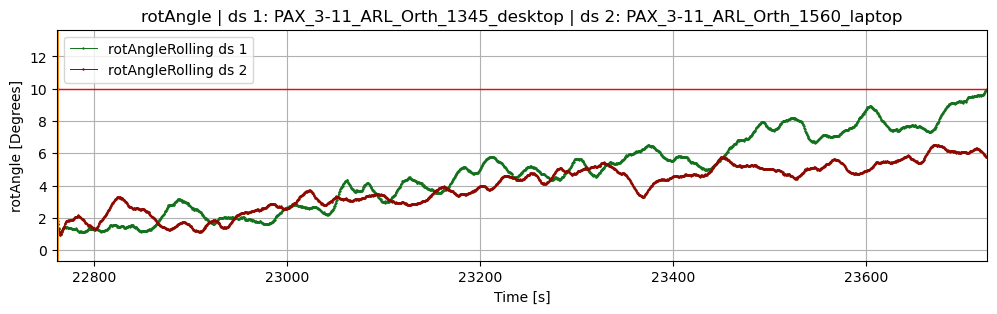

In [131]:
plot_rot_angle(ds_arl_24_03_11[0], ds_arl_24_03_11[1], birds_eye=True, sample_range=(22762,23725), plot_raw=False)

# Random Walk calculations

## Testing

### 1345 dataset

In [7]:
plt.ioff()
plt.close('all')

In [8]:
# filename = DATA + 'Whole_setup/24-03-11/PAX_3-11_ARL_Orth_1345_desktop.csv'
# ds_test = Dataset(filename,set_range=(0,0.01),skip_default_signal_baseline=False)

In [9]:
# ds_test.plot_raw(plot_param="S1",sample_range=(0,30))

Time range: min=22049.152, max=30954.769
Determining change point ranges automatically...
Using change_point_range_1=(22049.152, 22149.152)
Using change_point_range_2=(25049.152, 25149.152)
=== performing change point detection ===
cp range: (22049.152, 22149.152)
using 5971 data entries
skipping 0 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (5971,)
computing range... ---> range = (1.19,1.25)
displaying jump_fig for switch parameter = s1



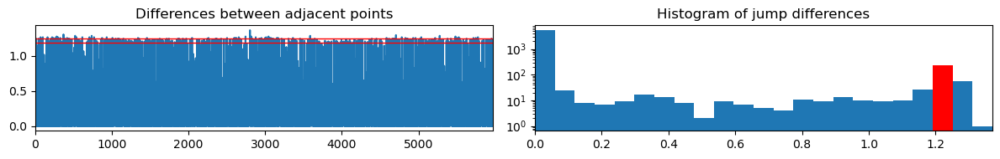



found width of 0.060 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (5971,)
computing range... ---> range = (0.43,0.49)
displaying jump_fig for switch parameter = s2



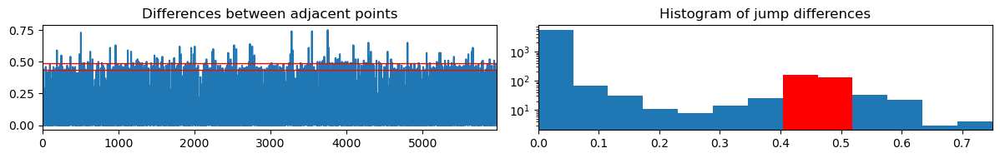



--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (5971,)
computing range... ---> range = (0.36,0.42)
displaying jump_fig for switch parameter = s3



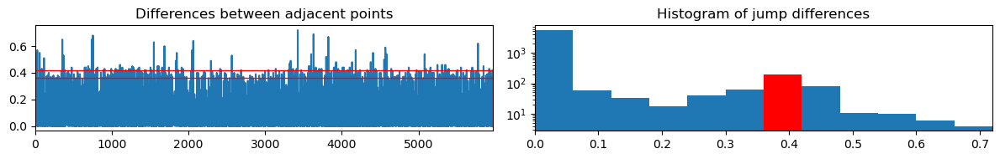



found width of 0.060 for s3
greater than prev width of 0.060 for s1
--- end of switch param: s3 ---

---> switch parameter found: s3 <---
finding differences within range = (0.36,0.42)
Jump points detected: 206
out of total: ~400.0

computing offset...


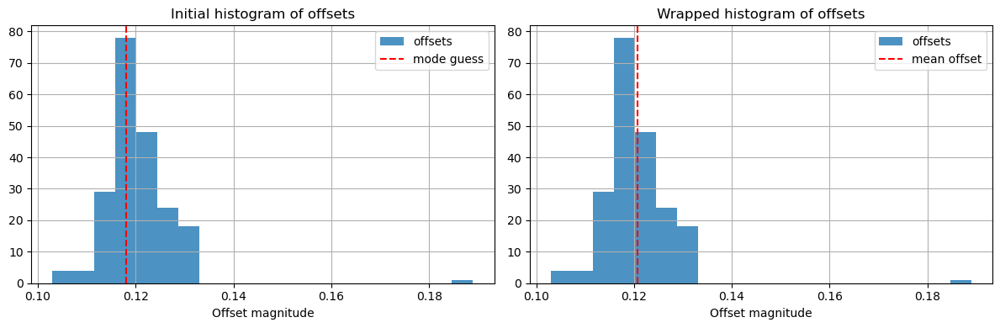



offset = 0.121 seconds
=== end change point detection ===
=== performing change point detection ===
cp range: (25049.152, 25149.152)
using 5955 data entries
skipping 179259 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (5955,)
computing range... ---> range = (1.32,1.38)
displaying jump_fig for switch parameter = s1



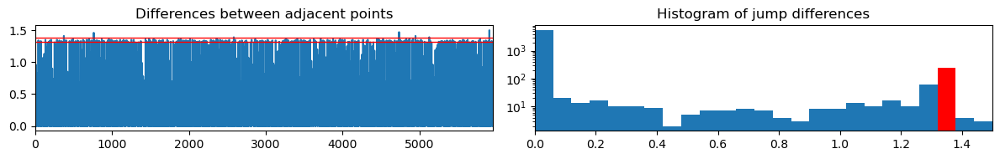



found width of 0.060 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (5955,)
computing range... ---> range = (0.28,0.34)
displaying jump_fig for switch parameter = s2



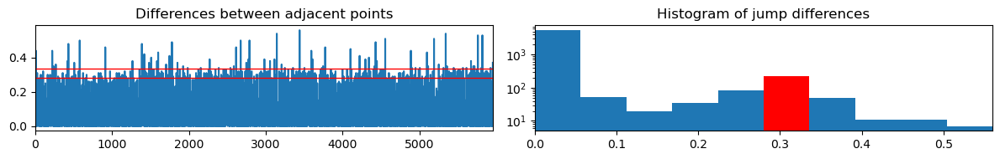



--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (5955,)
computing range... ---> range = (0.11,0.17)
displaying jump_fig for switch parameter = s3



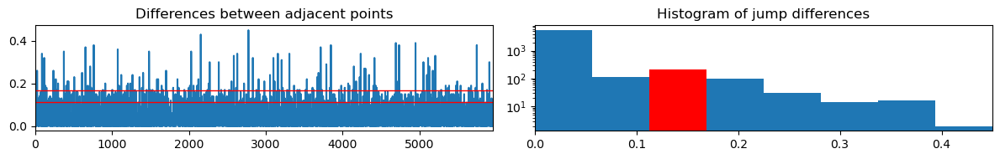



--- end of switch param: s3 ---

---> switch parameter found: s1 <---
finding differences within range = (1.32,1.38)
Jump points detected: 246
out of total: ~399.9

computing offset...


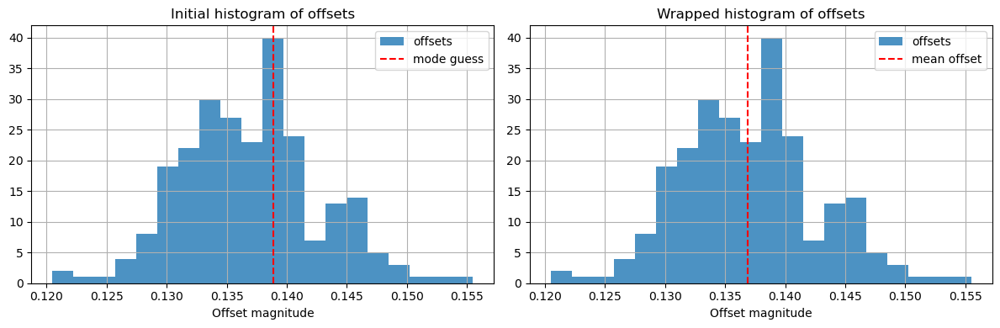



offset = 0.137 seconds
=== end change point detection ===
Nominal Switch Time = 0.2500000
Offset change of 0.016 seconds over 12000.0 switches
Corrected Switch Time = 0.2500013


In [10]:
filename = DATA + 'Whole_setup/24-03-11/PAX_3-11_ARL_Orth_1345_desktop.csv'
#ds_1345 = SwitchSet(filename, set_range=(0,0.04), skip_default_signal_baseline=25)
ds_1345 = SwitchSet(filename, set_range=(0.25,0.35), skip_default_signal_baseline=25)
ds_1345.find_switches(nominal_switch_rate=2, print_process=True)

In [11]:
ds_1345.average_data(print_process=True)

=== starting average_data ===
averaging data... Done
Dropped 35 observations with <4 points (out of total 35592 observations)

--- interpolating data ---
length before: 17776
length after: 17810
34 total added
--- end interpolating data ---

--- interpolating data ---
length before: 17781
length after: 17811
30 total added
--- end interpolating data ---
Signal 1 size=17810	Signal 1 range: t=(22049.75,30954.29)
Signal 2 size=17811	Signal 2 range: t=(22049.50,30954.54)
=== end average_data ===


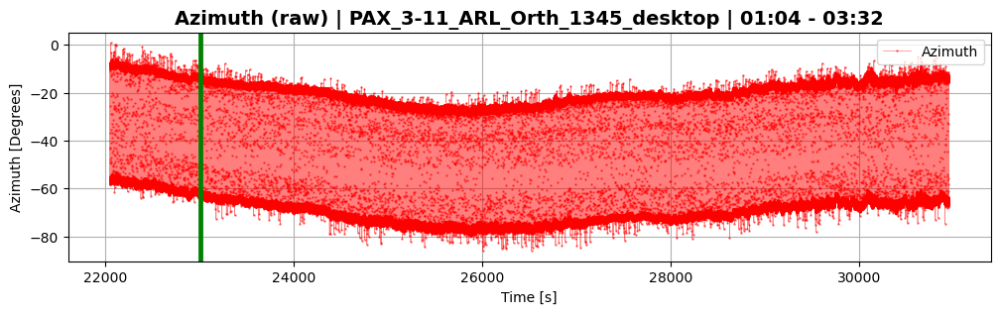

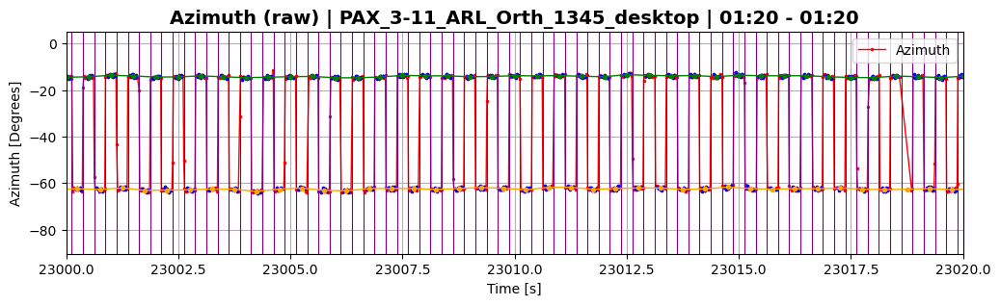

In [12]:
ds_1345.plot_raw(plot_param='Azimuth', sample_range=(23000,23020),plot_switch=True,plot_jumps=True,plot_valid=True,plot_avg=True)

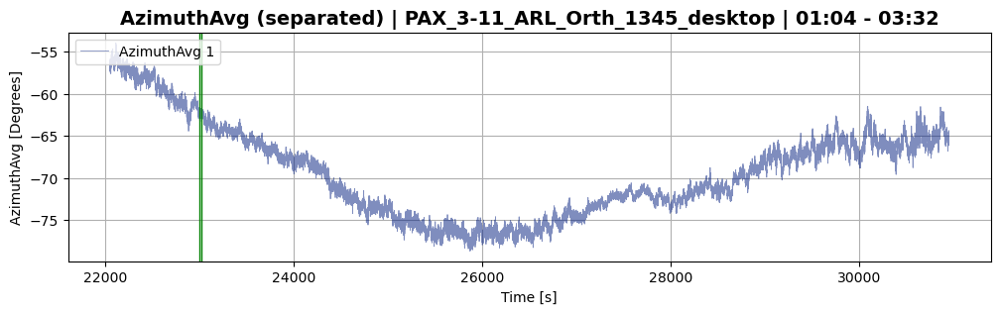

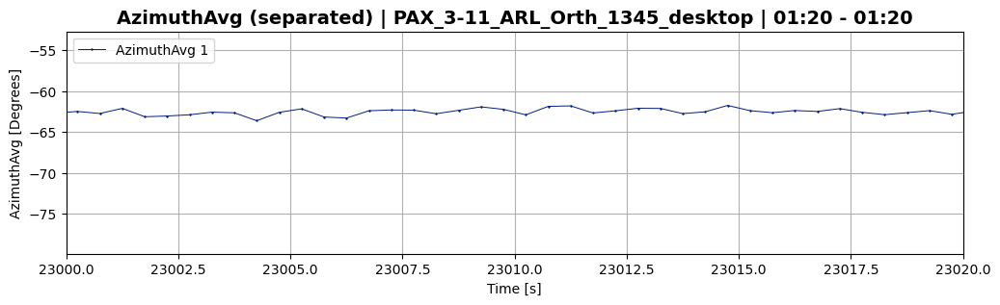

In [13]:
ds_1345.plot_separated(plot_param='AzimuthAvg',plot_signal=1,sample_range=(23000,23020))

In [14]:
reset_times_1345 = ds_1345.calc_stokes_ptf(reference=None, angle_threshold_deg=10, reset_by_rolling=True, rolling_pts=5, print_process=True);

Using "resetting reference SOPs" approach with threshold = 10.0 degrees
Averaging rotAngle using 5 rolling points
Reference matrix was reset 12 times
Reset at time t=22741.62
Reset at time t=23592.13
Reset at time t=24585.63
Reset at time t=25848.14
Reset at time t=26762.65
Reset at time t=28421.15
Reset at time t=29363.66
Reset at time t=30087.66
Reset at time t=30359.17
Reset at time t=30697.67
...


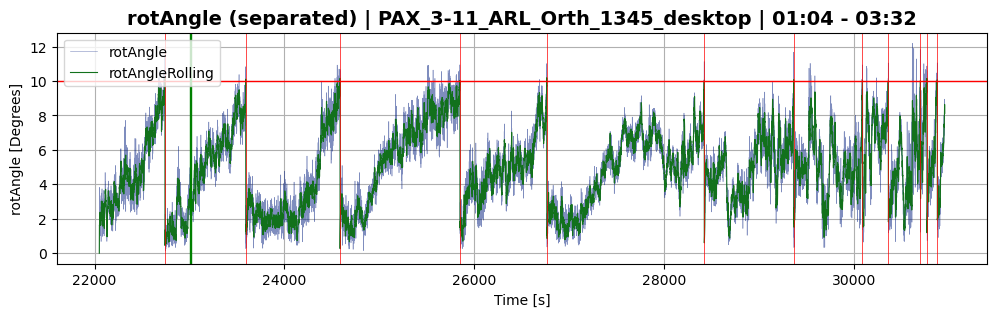

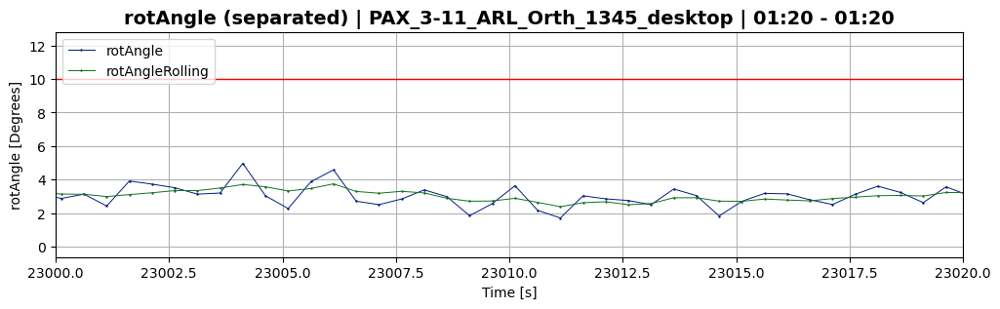

In [15]:
ds_1345.plot_separated(plot_param='rotAngle',sample_range=(23000,23020))

### rotAngleDif

In [87]:
sdf = ds_1345.stokes_ptf_df.copy(deep=True)

In [88]:
### This has been moved to calc_stokes_ptf method in SwitchSet
sdf['rotAngleDif'] = sdf['rotAngle'].diff()
for i in range(len(sdf) - 1):  # -1 because we'll look at the next row inside the loop
    if sdf.loc[i, 'WasReset']:
        sdf.loc[i + 1, 'rotAngleDif'] = np.nan

In [89]:
sdf[sdf['WasReset']==True].head()

,EstTime,basesMatrix,sig1Stokes,sig2Stokes,axis,rotAngle,angleDif,rotAngleRolling,WasReset,rotAngleDif
1384,22741.624190,"[[-0.43400798540218344, 0.896088826448114, -0....","[-0.0051998999999999995, -0.0084202, -0.0067534]","[0.01001675, -0.005283375, -0.00270025]","[-0.13416140773159735, 0.0281257026598099, -0....",9.690807,85.626540,10.166004,True,-1.103693
3085,23592.128779,"[[-0.5951936757963652, 0.7982982436994261, -0....","[-0.007058888888888889, -0.007336333333333334,...","[0.0090312, -0.0065201999999999994, -0.0036643]","[0.02073152281797771, 0.22207314091143185, -0....",10.834784,87.372681,10.110370,True,1.577316
5072,24585.634140,"[[-0.7195372798362216, 0.6807084667531041, -0....","[-0.0085893, -0.0057383, -0.0059828]","[0.007447199999999999, -0.0075555, -0.0045769]","[0.11499450697280075, 0.13155901731962852, -0....",10.687311,87.185579,10.160970,True,0.696666
7597,25848.140952,"[[-0.8039857827113164, 0.5484824941811318, -0....","[-0.0095245, -0.004281875, -0.005593875]","[0.0059896666666666674, -0.008897777777777777,...","[-0.07923732100273922, 0.03166588901209077, -0...",10.689590,87.891774,10.041084,True,1.340476
9426,26762.645886,"[[-0.7430910231503972, 0.6571490393509524, -0....","[-0.0087705, -0.00529225, -0.005863]","[0.0072173, -0.0073875, -0.0049575]","[0.1577782964023702, 0.01961293753039916, 0.32...",10.338740,87.938886,10.191338,True,-0.675327


In [90]:
sdf.iloc[1383:1387]

,EstTime,basesMatrix,sig1Stokes,sig2Stokes,axis,rotAngle,angleDif,rotAngleRolling,WasReset,rotAngleDif
1383,22741.124187,"[[-0.45670050661204575, 0.8857181388541719, -0...","[-0.005435444444444444, -0.008337777777777777,...","[0.010041625, -0.0051565, -0.002659125]","[-0.15227569851203823, 0.0727661789031658, -0....",10.794500,87.605919,9.999334,False,1.225909
1384,22741.624190,"[[-0.43400798540218344, 0.896088826448114, -0....","[-0.0051998999999999995, -0.0084202, -0.0067534]","[0.01001675, -0.005283375, -0.00270025]","[-0.13416140773159735, 0.0281257026598099, -0....",9.690807,85.626540,10.166004,True,-1.103693
1385,22742.124193,"[[-0.43235382354192964, 0.8975213997178666, -0...","[-0.005284375, -0.008647125, -0.006832875]","[0.010253333333333333, -0.005008777777777778, ...","[-0.00833297005532219, 0.007776341324630296, 0...",0.451458,87.436005,0.451458,False,NaN
1386,22742.624195,"[[-0.42278532877531955, 0.9010708187526004, -0...","[-0.005067888888888889, -0.008487111111111112,...","[0.010252222222222223, -0.005093333333333333, ...","[-0.006651866968241874, -0.020127700819094815,...",0.755832,86.714064,0.603645,False,0.304374


### Histogram code

In [122]:
### This has now been moved to plotting.py module

def ptr_walk_hist(ds_switch, bins=150):
    # Gaussian function
    def gauss(x, mu, sigma, A):
        return A * np.exp(-0.5 * ((x - mu) / sigma)**2)
    
    # Histogram data
    hist_data = ds_switch.stokes_ptf_df['rotAngleDif'].dropna()
    bin_list = np.linspace(min(hist_data), max(hist_data), bins)
    hist, bin_edges = np.histogram(hist_data, bins=bin_list)
    bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
    
    # Fit the Gaussian function to the histogram data
    popt, pcov = curve_fit(gauss, bin_centers, hist, p0=[np.mean(hist_data), np.std(hist_data), 1])
    # Extracting the uncertainties (standard errors) of the fitted parameters
    perr = np.sqrt(np.diag(pcov))

    print('----- Gauss fit params -----')
    parameter_names = ['mu', 'sigma', 'A']
    for param, uncertainty, name in zip(popt, perr, parameter_names):
        print(f"{name} = {param:.5f} ± {uncertainty:.5f}")
    print('----------------------------')
    
    # Plot the histogram and the fit
    fig, ax = plt.subplots(figsize=(12, 3))
    ax.hist(hist_data, bins=bin_list, alpha=0.6, color='blue')
    ax.plot(bin_centers, gauss(bin_centers, *popt), 'orange', linewidth=2)
    
    # Adding a vertical red line at the mean
    ax.axvline(x=popt[0], color='red', lw=2, label=f'Mean: {popt[0]:.5f}')
    # Adding a horizontal purple line for the standard deviation
    ax.hlines(popt[2]*0.05, popt[0], popt[0] + popt[1], color='purple', lw=2, label=f'STD: {popt[1]:.5f}')
    
    ax.set_title('Histogram of rotAngleDif with Gaussian Fit')
    ax.set_xlabel('rotAngleDif')
    ax.set_ylabel('Frequency')
    ax.legend()
    
    display(fig); plt.close(fig)

    return popt, pcov

----- Gauss fit params -----
mu = 0.00267 ± 0.00561
sigma = 0.80869 ± 0.00561
A = 867.20018 ± 5.21319
----------------------------


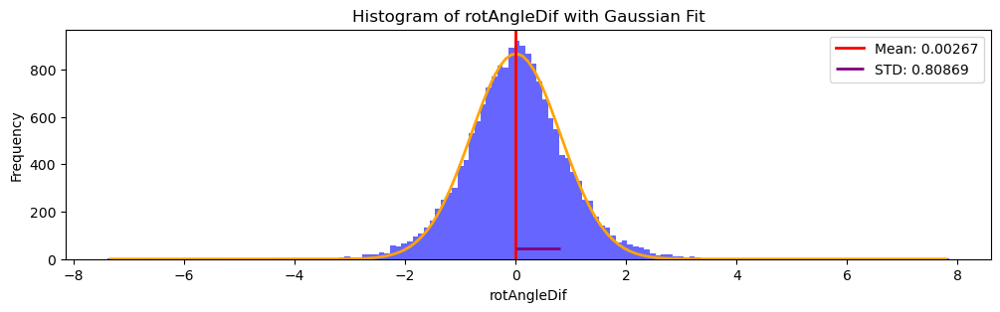

In [119]:
ptr_walk_hist(sdf,bins=150);

### ADev code

In [33]:
dif_data = ds_1345.stokes_ptf_df['rotAngleDif'].dropna()
walk_data = np.cumsum(dif_data)

In [45]:
# ds.switch_time is time between switches from channel to channel;
# 2*ds.switch_time is time resolution for measurements on any one channel
# 1/(2*ds.switch_time) is rate at which these measurements are made
# We use one measurement from each channel to determine the new rotation matrix,
# so this is the correct rate to use
meas_rate = 1/(2*ds_1345.switch_time)
elm = allantools.oadev(walk_data.values, rate = meas_rate, taus='all', data_type="freq")

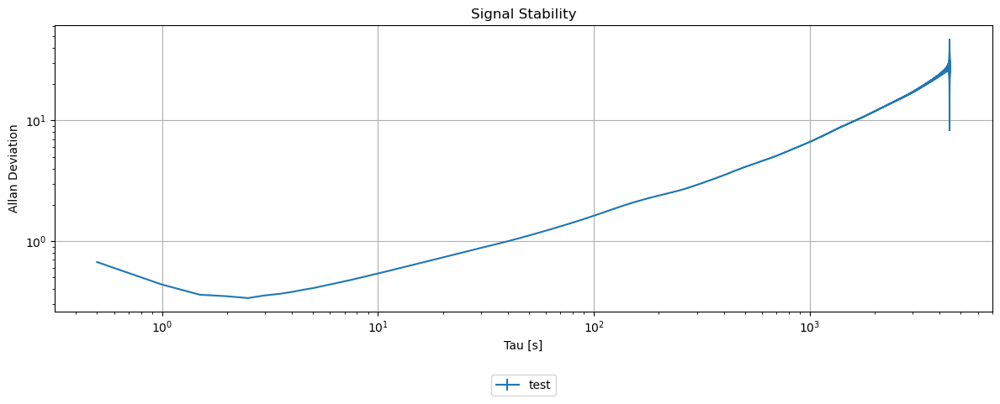

In [46]:
plot_adev([(*elm, "test")])

## Histogram

### Nighttime ARL rotAngleDif walk

In [5]:
plt.ioff()
plt.close('all')

In [6]:
# filename = DATA + 'Whole_setup/24-03-11/PAX_3-11_ARL_Orth_1345_desktop.csv'
# ds_test = Dataset(filename,set_range=(0,0.01),skip_default_signal_baseline=False)

In [7]:
# ds_test.plot_raw(plot_param="S1",sample_range=(0,30))

Time range: min=22049.152, max=30954.769
Determining change point ranges automatically...
Using change_point_range_1=(22049.152, 22149.152)
Using change_point_range_2=(25049.152, 25149.152)
=== performing change point detection ===
cp range: (22049.152, 22149.152)
using 5971 data entries
skipping 0 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (5971,)
computing range... ---> range = (1.19,1.25)
displaying jump_fig for switch parameter = s1



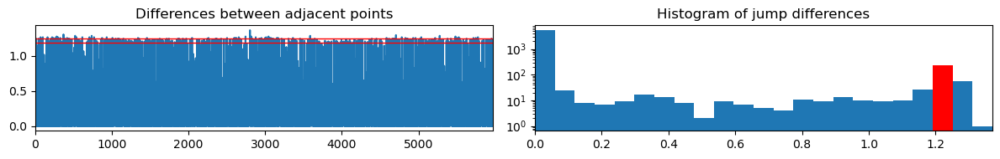



found width of 0.060 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (5971,)
computing range... ---> range = (0.43,0.49)
displaying jump_fig for switch parameter = s2



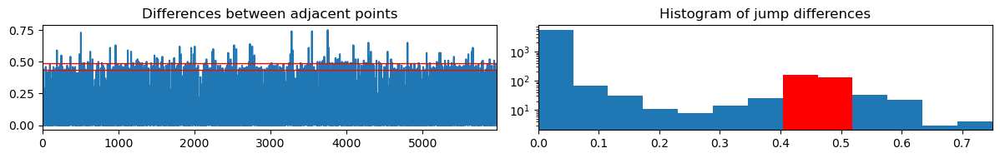



--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (5971,)
computing range... ---> range = (0.36,0.42)
displaying jump_fig for switch parameter = s3



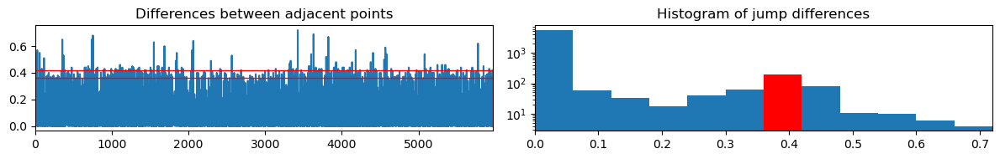



found width of 0.060 for s3
greater than prev width of 0.060 for s1
--- end of switch param: s3 ---

---> switch parameter found: s3 <---
finding differences within range = (0.36,0.42)
Jump points detected: 206
out of total: ~400.0

computing offset...


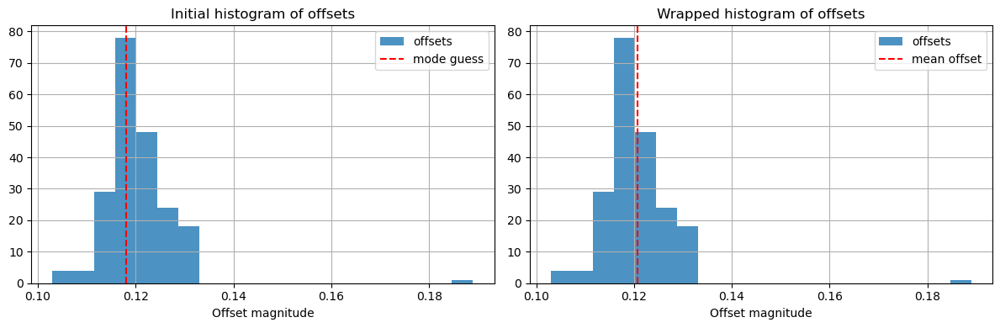



offset = 0.121 seconds
=== end change point detection ===
=== performing change point detection ===
cp range: (25049.152, 25149.152)
using 5955 data entries
skipping 179259 points
considering params: ['s1', 's2', 's3']

--- switch param: s1 ---
size of data we are using = (5955,)
computing range... ---> range = (1.32,1.38)
displaying jump_fig for switch parameter = s1



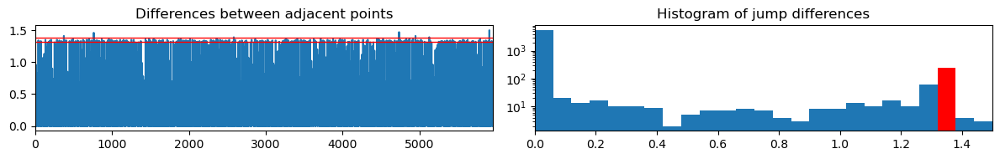



found width of 0.060 for s1
greater than prev width of -1.000 for None
--- end of switch param: s1 ---

--- switch param: s2 ---
size of data we are using = (5955,)
computing range... ---> range = (0.28,0.34)
displaying jump_fig for switch parameter = s2



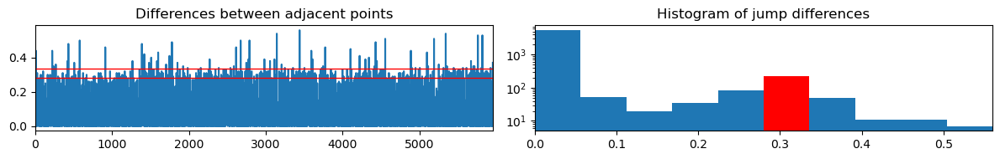



--- end of switch param: s2 ---

--- switch param: s3 ---
size of data we are using = (5955,)
computing range... ---> range = (0.11,0.17)
displaying jump_fig for switch parameter = s3



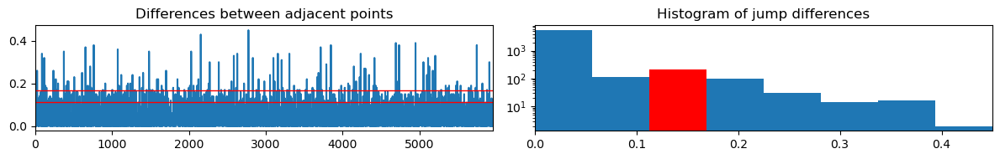



--- end of switch param: s3 ---

---> switch parameter found: s1 <---
finding differences within range = (1.32,1.38)
Jump points detected: 246
out of total: ~399.9

computing offset...


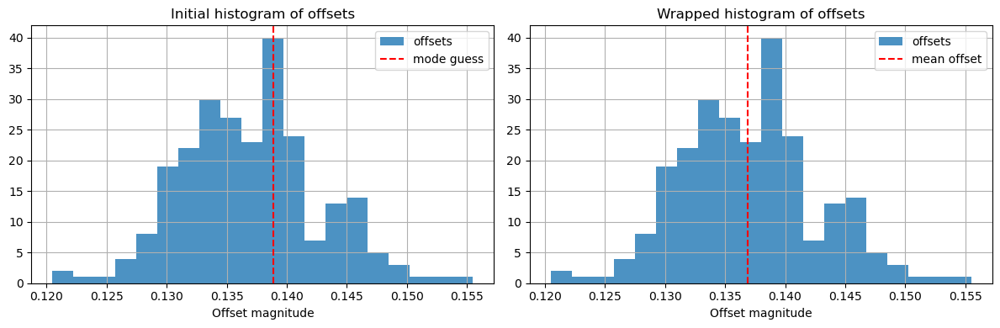



offset = 0.137 seconds
=== end change point detection ===
Nominal Switch Time = 0.2500000
Offset change of 0.016 seconds over 12000.0 switches
Corrected Switch Time = 0.2500013


In [8]:
filename = DATA + 'Whole_setup/24-03-11/PAX_3-11_ARL_Orth_1345_desktop.csv'
#ds_1345 = SwitchSet(filename, set_range=(0,0.04), skip_default_signal_baseline=25)
ds_1345 = SwitchSet(filename, set_range=(0.25,0.35), skip_default_signal_baseline=25)
ds_1345.find_switches(nominal_switch_rate=2, print_process=True)

In [9]:
ds_1345.average_data(print_process=True)

=== starting average_data ===
averaging data... Done
Dropped 35 observations with <4 points (out of total 35592 observations)

--- interpolating data ---
length before: 17776
length after: 17810
34 total added
--- end interpolating data ---

--- interpolating data ---
length before: 17781
length after: 17811
30 total added
--- end interpolating data ---
Signal 1 size=17810	Signal 1 range: t=(22049.75,30954.29)
Signal 2 size=17811	Signal 2 range: t=(22049.50,30954.54)
=== end average_data ===


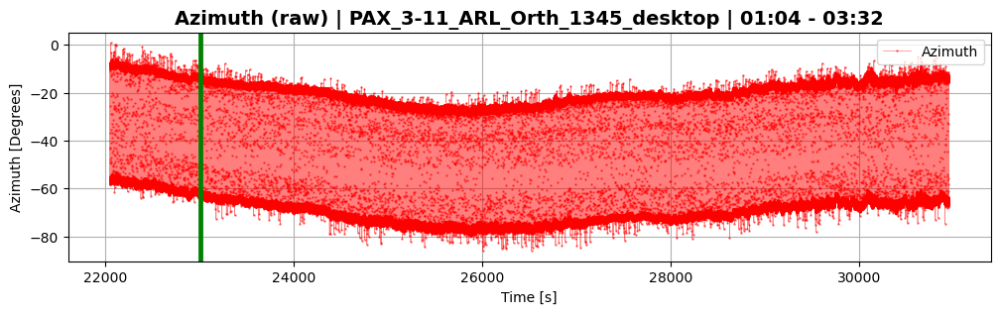

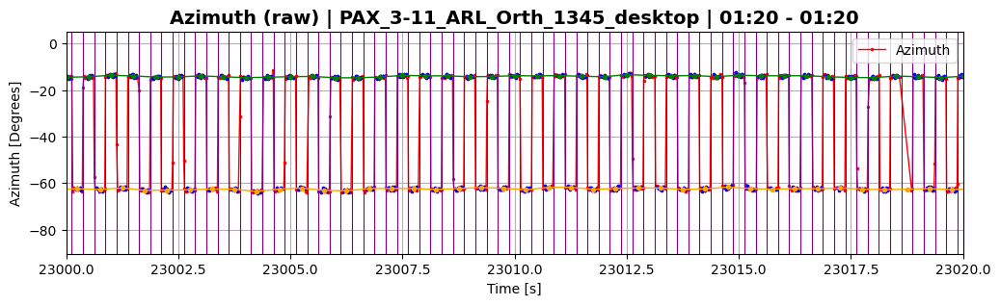

In [10]:
ds_1345.plot_raw(plot_param='Azimuth', sample_range=(23000,23020),plot_switch=True,plot_jumps=True,plot_valid=True,plot_avg=True)

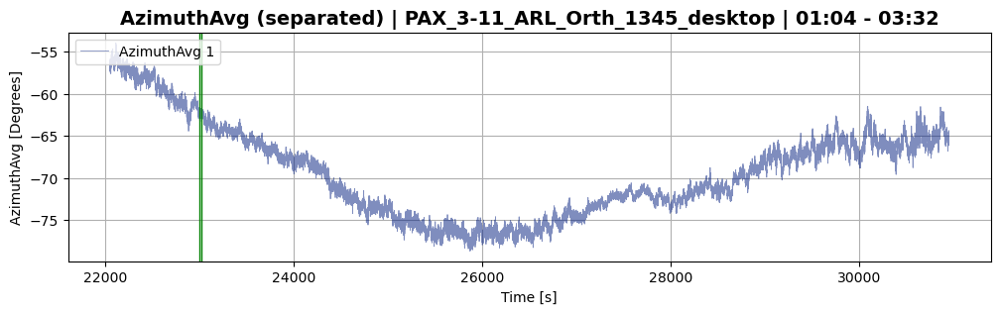

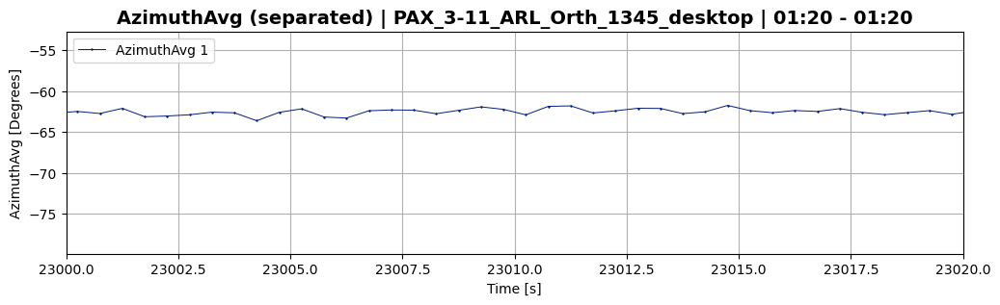

In [11]:
ds_1345.plot_separated(plot_param='AzimuthAvg',plot_signal=1,sample_range=(23000,23020))

In [12]:
reset_times_1345 = ds_1345.calc_stokes_ptf(reference=None, angle_threshold_deg=10, reset_by_rolling=True, rolling_pts=5, print_process=True);

Using "resetting reference SOPs" approach with threshold = 10.0 degrees
Averaging rotAngle using 5 rolling points
Reference matrix was reset 12 times
Reset at time t=22741.62
Reset at time t=23592.13
Reset at time t=24585.63
Reset at time t=25848.14
Reset at time t=26762.65
Reset at time t=28421.15
Reset at time t=29363.66
Reset at time t=30087.66
Reset at time t=30359.17
Reset at time t=30697.67
...


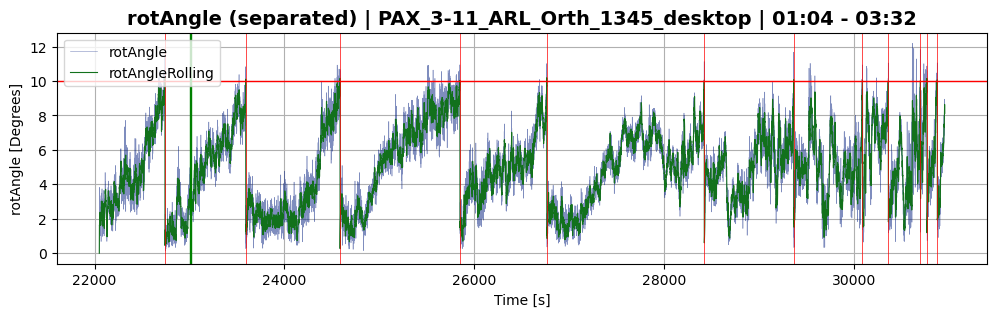

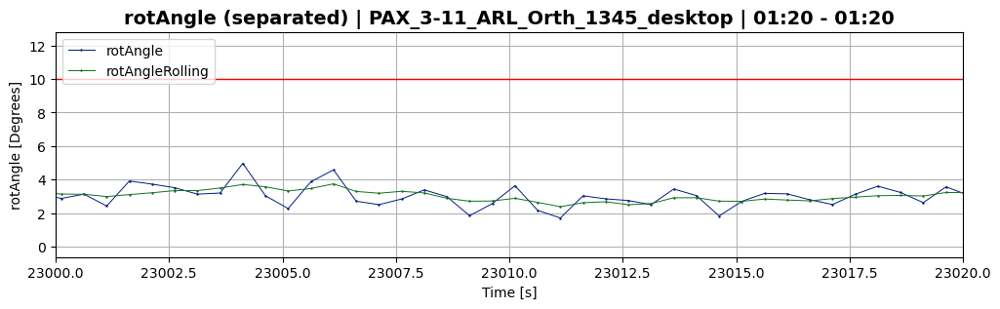

In [13]:
ds_1345.plot_separated(plot_param='rotAngle',sample_range=(23000,23020))

----- Gauss fit params | PAX_3-11_ARL_Orth_1345_desktop | 01:04 - 03:32 -----
	mu = 0.00267 ± 0.00561
	sigma = 0.80869 ± 0.00561
	A = 867.20018 ± 5.21319
-----------------------------------------------------------


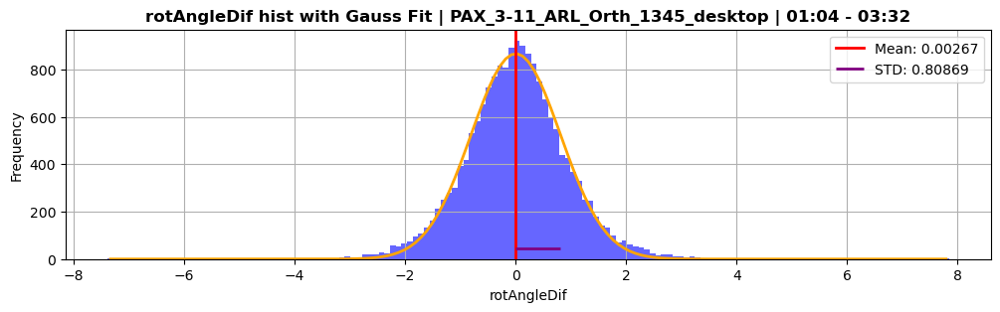

In [14]:
ptr_walk_hist(ds_1345,bins=150);

### Statistical descriptions

In [69]:
### Calculates the sample moments of the provided data
### Mean is central tendency
### (Sample) Variance is amount of variation from mean
### Skew is symmetry; positive/negative means longer or fatter tail to the right/left, respectively
### Note: skew=0 means symmetrical
### (Excess) Kurtosis measures "tailedness"; positive/negative means heavier/lighter tails than normal distribution, respectively
### Note: Excess kurtosis = 0 means normal tailidness
def calc_moments(data, print_results=False):
    n = len(data)
    alpha = 0.05  # 95% confidence interval
    std_dev = np.std(data, ddof=1)

    # Confidence interval for the mean
    mean = np.mean(data)
    t_critical = ss.t.ppf(1 - alpha/2, n - 1)
    margin_of_error = t_critical * (std_dev / np.sqrt(n))
    mean_ci = (mean - margin_of_error, mean + margin_of_error)

    # Confidence interval for the variance
    var = np.var(data, ddof=1)
    chi2_lower = ss.chi2.ppf(alpha / 2, n - 1)
    chi2_upper = ss.chi2.ppf(1 - alpha / 2, n - 1)
    var_ci = ((n - 1) * std_dev**2 / chi2_upper, (n - 1) * std_dev**2 / chi2_lower)

    # Skew and Kurtosis
    skew = ss.skew(data)
    # Excess Kurtosis (fisher=True): kurtosis beyond what is expected of normal distribution
    # Absolute Kurtosis (fisher=False): subtract 3 from excess kurtosis
    kurtosis = ss.kurtosis(data, fisher=True)

    if print_results:
        print("Mean =\t\t\t{:.5f}   |   conf int = ({:.5f},{:.5f})".format(mean,mean_ci[0],mean_ci[1]))
        print("Var =\t\t\t{:.5f}   |   conf int = ({:.5f},{:.5f})".format(var,var_ci[0],var_ci[1]))
        print("Skew =\t\t\t{:.5f}".format(skew))
        print("Excess Kurtosis =\t{:.5f}".format(kurtosis))
        #print(var_ci[1]-var)
        #print(var-var_ci[0])
    
    return (mean, mean_ci, var, var_ci, skew, kurtosis)

In [72]:
data = ds_1345.stokes_ptf_df['rotAngleDif'].dropna()
(mean, mean_ci, var, var_ci, skew, kurtosis) = calc_moments(data, print_results=True);

Mean =			0.00651   |   conf int = (-0.00745,0.02048)
Var =			0.90390   |   conf int = (0.88541,0.92298)
Skew =			-0.00854
Excess Kurtosis =	2.78703


In [74]:
ks_stat, ks_p_value = ss.kstest(data, 'norm', args=(mean, np.sqrt(var)))

print(f'K-S statistic: {ks_stat}')
print(f'p-value: {ks_p_value}')

# Interpret the result
alpha = 0.05
if ks_p_value > alpha:
    print('Data seems to be normally distributed (fail to reject H0).')
else:
    print('Data does not seem to be normally distributed (reject H0).')

K-S statistic: 0.03218722956224518
p-value: 1.875722673977825e-16
Data does not seem to be normally distributed (reject H0).


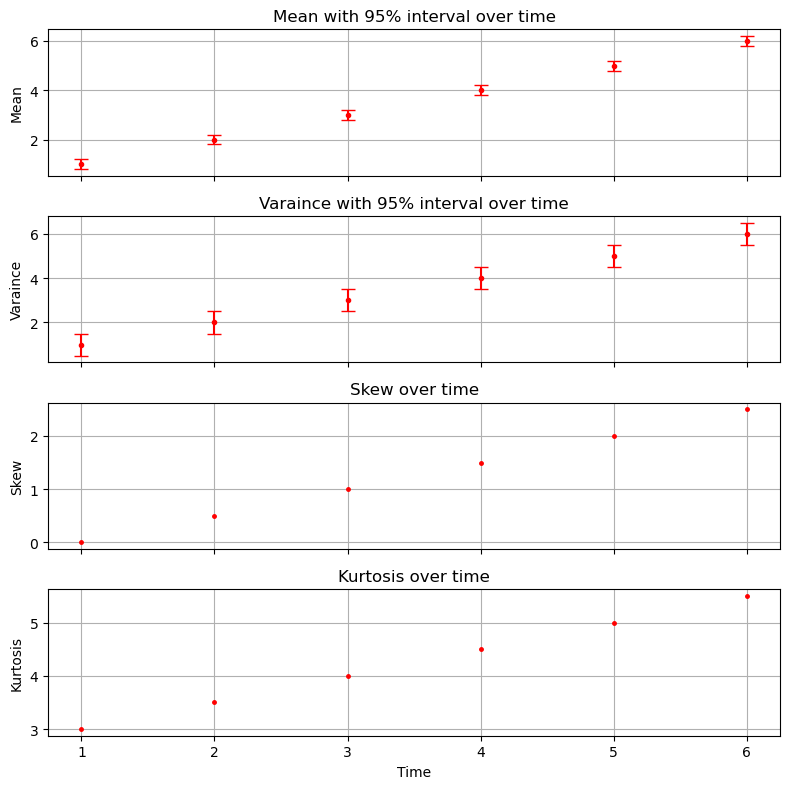

In [61]:
# Sample data
times = [1, 2, 3, 4, 5, 6]
means = [1, 2, 3, 4, 5, 6]
mean_conf_intervals = [(0.8, 1.2), (1.8, 2.2), (2.8, 3.2), (3.8, 4.2), (4.8, 5.2), (5.8, 6.2)]
variances = [1, 2, 3, 4, 5, 6]
variance_conf_intervals = [(0.5, 1.5), (1.5, 2.5), (2.5, 3.5), (3.5, 4.5), (4.5, 5.5), (5.5, 6.5)]
skews = [0, 0.5, 1, 1.5, 2, 2.5]
kurtoses = [3, 3.5, 4, 4.5, 5, 5.5]

def calc_errors(values, intervals):
    return [[value - conf[0] for value, conf in zip(values, intervals)],
            [conf[1] - value for value, conf in zip(values, intervals)]]

def plot_moment_ci(ax, times, values, intervals, ylabel):
    errors = calc_errors(values, intervals)
    ax.errorbar(times, means, yerr=errors, fmt='.', color='red', capsize=5)
    ax.set_title(ylabel + ' with 95% interval over time')
    ax.set_ylabel(ylabel)
    ax.grid(True)

def plot_moment(ax, times, values, ylabel):
    ax.plot(times, values, '.', color='red', markersize=5)
    ax.set_title(ylabel + ' over time')
    ax.set_ylabel(ylabel)
    ax.grid(True)

# Creating subplots
fig, axs = plt.subplots(4, 1, figsize=(8, 2*4), sharex=True)

plot_moment_ci(axs[0], times, means, mean_conf_intervals, "Mean") # Mean
plot_moment_ci(axs[1], times, variances, variance_conf_intervals, "Varaince") # Variance
plot_moment(axs[2], times, skews, "Skew") # Skewness
plot_moment(axs[3], times, kurtoses, "Kurtosis") # Kurtosis
axs[-1].set_xlabel('Time')

fig.tight_layout()
display(fig)
plt.close(fig)

### Hist by times of day

In [15]:
plt.ioff()
plt.close('all')

In [16]:
# filename = DATA + 'Whole_setup/24-03-11/PAX_3-11_ARL_Orth_1345_desktop.csv'
# ds_test = Dataset(filename,set_range=(0,0.01),skip_default_signal_baseline=False)

In [17]:
# ds_test.plot_raw(plot_param="S1",sample_range=(0,30))

Time range: min=4403.407, max=13210.364
Using "resetting reference SOPs" approach with threshold = 10.0 degrees
Averaging rotAngle using 5 rolling points
Reference matrix was reset 9 times
----- Gauss fit params | PAX_3-11_ARL_Orth_1345_desktop | 20:10 - 22:37 -----
	mu = 0.00312 ± 0.00632
	sigma = 0.91297 ± 0.00632
	A = 1046.57243 ± 6.27751
-----------------------------------------------------------


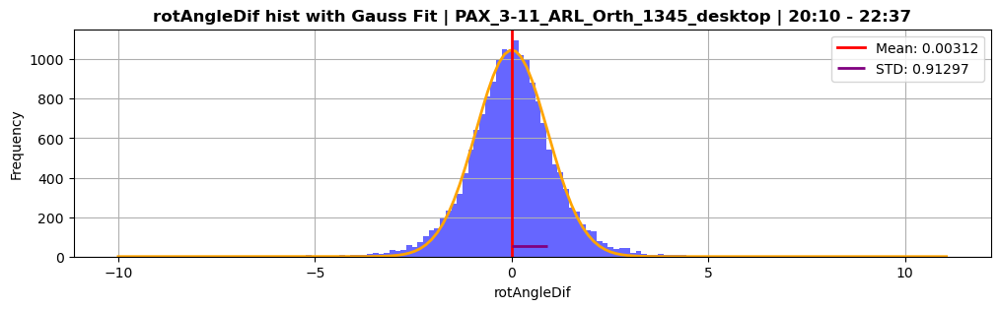




Time range: min=13210.39, max=22049.137
Using "resetting reference SOPs" approach with threshold = 10.0 degrees
Averaging rotAngle using 5 rolling points
Reference matrix was reset 28 times
----- Gauss fit params | PAX_3-11_ARL_Orth_1345_desktop | 22:37 - 01:04 -----
	mu = 0.01587 ± 0.00851
	sigma = 1.15924 ± 0.00851
	A = 824.47792 ± 5.24394
-----------------------------------------------------------


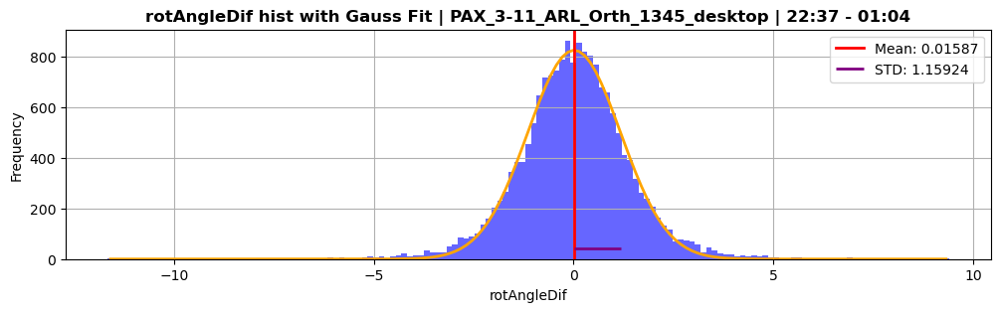




Time range: min=22049.152, max=30954.769


/mnt/c/Users/2020n/Documents/Career/Locations/Britton Lab/QWDM_Project/F1_Code/PolRepo/data_manager/switch.py:461: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  jump_fig_iter, (jump_ax1_iter, jump_ax2_iter) = plt.subplots(1,2,figsize=(12,2))


Using "resetting reference SOPs" approach with threshold = 10.0 degrees
Averaging rotAngle using 5 rolling points
Reference matrix was reset 12 times
----- Gauss fit params | PAX_3-11_ARL_Orth_1345_desktop | 01:04 - 03:32 -----
	mu = 0.00267 ± 0.00561
	sigma = 0.80869 ± 0.00561
	A = 867.20018 ± 5.21319
-----------------------------------------------------------


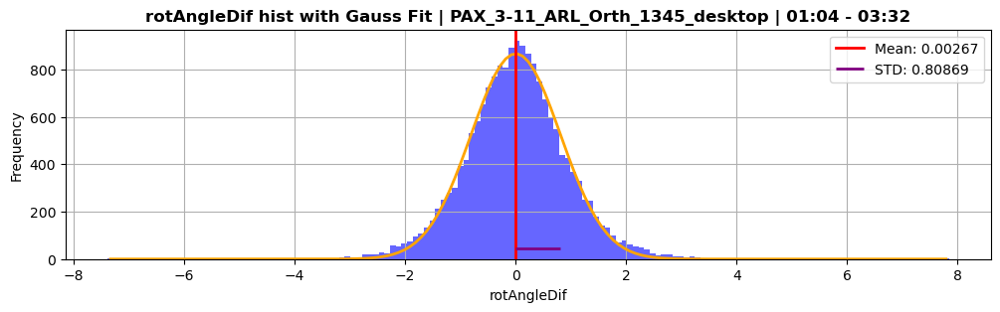




Time range: min=30954.801, max=39895.562
Using "resetting reference SOPs" approach with threshold = 10.0 degrees
Averaging rotAngle using 5 rolling points
Reference matrix was reset 819 times
----- Gauss fit params | PAX_3-11_ARL_Orth_1345_desktop | 03:32 - 06:01 -----
	mu = 0.15097 ± 0.03086
	sigma = 2.33399 ± 0.03086
	A = 773.45436 ± 8.85744
-----------------------------------------------------------


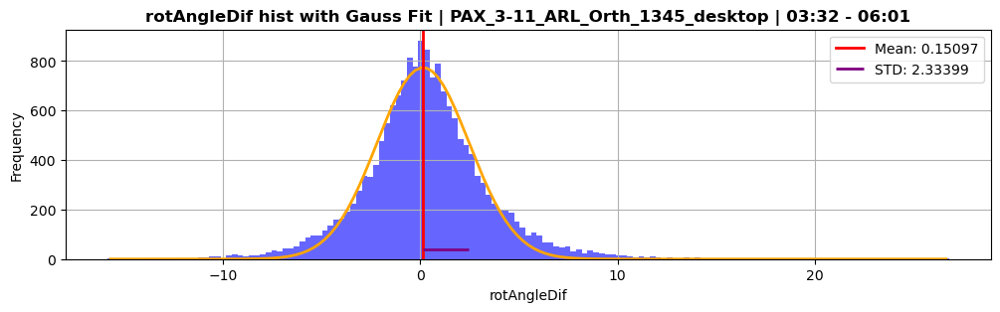




Time range: min=39895.592, max=48431.137
Using "resetting reference SOPs" approach with threshold = 10.0 degrees
Averaging rotAngle using 5 rolling points
Reference matrix was reset 575 times
----- Gauss fit params | PAX_3-11_ARL_Orth_1345_desktop | 06:01 - 08:24 -----
	mu = 0.14132 ± 0.02258
	sigma = -2.20313 ± 0.02258
	A = 888.84169 ± 7.88756
-----------------------------------------------------------


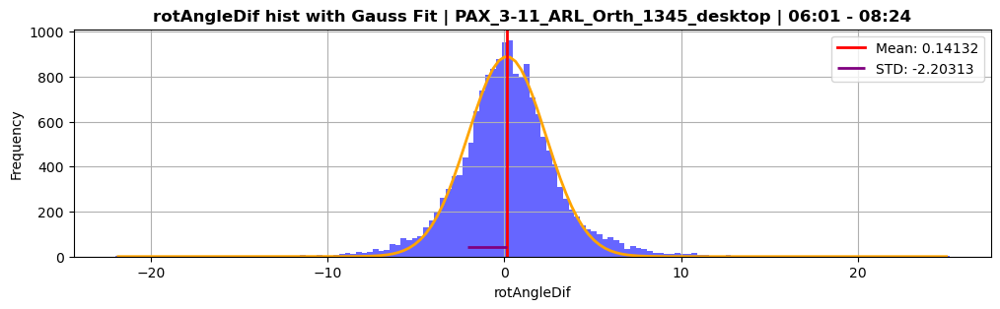




Time range: min=48431.155, max=57350.727
Using "resetting reference SOPs" approach with threshold = 10.0 degrees
Averaging rotAngle using 5 rolling points
Reference matrix was reset 5309 times
----- Gauss fit params | PAX_3-11_ARL_Orth_1345_desktop | 08:24 - 10:52 -----
	mu = 0.60690 ± 0.04190
	sigma = 3.74931 ± 0.04190
	A = 489.19136 ± 4.73437
-----------------------------------------------------------


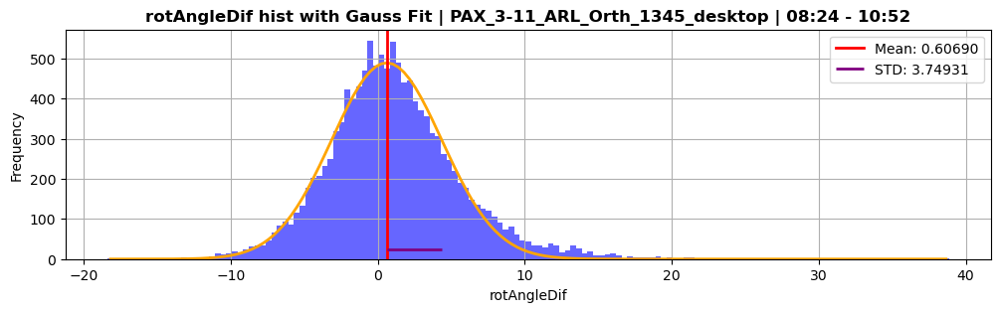




Time range: min=57350.745, max=65764.444
Using "resetting reference SOPs" approach with threshold = 10.0 degrees
Averaging rotAngle using 5 rolling points
Reference matrix was reset 11162 times
----- Gauss fit params | PAX_3-11_ARL_Orth_1345_desktop | 10:52 - 13:13 -----
	mu = 2.60339 ± 0.08044
	sigma = -5.76780 ± 0.08044
	A = 171.65342 ± 2.07324
-----------------------------------------------------------


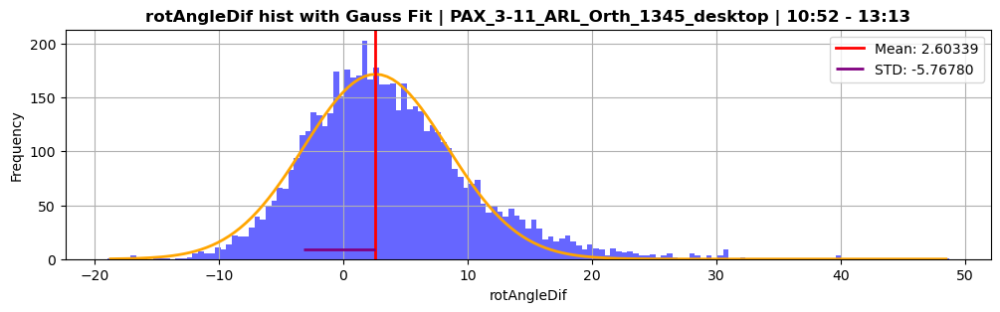




Time range: min=65764.472, max=73027.189
Using "resetting reference SOPs" approach with threshold = 10.0 degrees
Averaging rotAngle using 5 rolling points
Reference matrix was reset 11265 times
----- Gauss fit params | PAX_3-11_ARL_Orth_1345_desktop | 13:13 - 15:14 -----
	mu = 4.20084 ± 0.10982
	sigma = -6.49026 ± 0.10991
	A = 86.77027 ± 1.27167
-----------------------------------------------------------


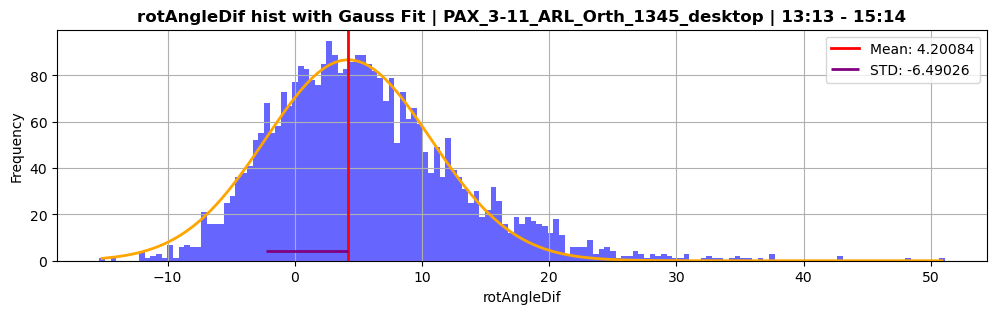




Time range: min=73027.201, max=81756.255
Using "resetting reference SOPs" approach with threshold = 10.0 degrees
Averaging rotAngle using 5 rolling points
Reference matrix was reset 9153 times
----- Gauss fit params | PAX_3-11_ARL_Orth_1345_desktop | 15:14 - 17:39 -----
	mu = 0.99406 ± 0.07019
	sigma = 4.36143 ± 0.07019
	A = 442.52231 ± 6.16772
-----------------------------------------------------------


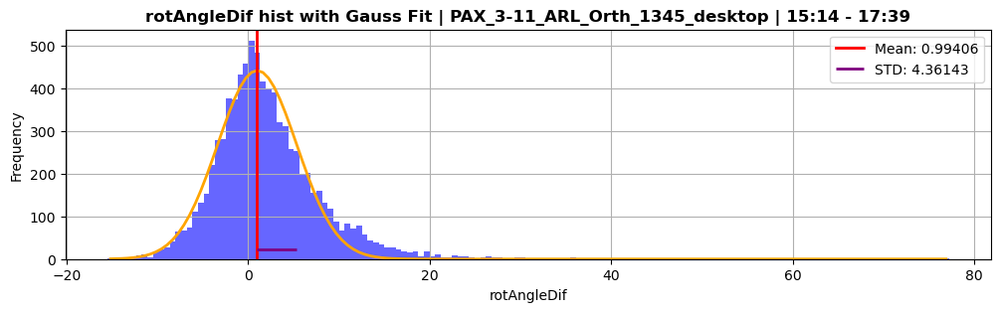

In [18]:
filename = DATA + 'Whole_setup/24-03-11/PAX_3-11_ARL_Orth_1345_desktop.csv'
#ds_1345 = SwitchSet(filename, set_range=(0,0.04), skip_default_signal_baseline=25)
length = 0.1
start = 0.05
params_list = []
while start+length <= 1.0:
    ds_1345 = SwitchSet(filename, set_range=(start, start+length), skip_default_signal_baseline=25)
    ds_1345.find_switches(nominal_switch_rate=2, print_process=False)

    ds_1345.average_data(print_process=False)

    reset_times_1345 = ds_1345.calc_stokes_ptf(reference=None, angle_threshold_deg=10, reset_by_rolling=True, rolling_pts=5, print_process=False);

    params_list.append(ptr_walk_hist(ds_1345,bins=150))
    print('\n\n')

    start += length

In [19]:
parameter_names = ['mu', 'sigma', 'A']
print(BOLD_ON + '----- sigma from Gauss fit -----' + BOLD_OFF)
for (title, time_str, popt, perr) in params_list:
    print(f"{time_str} | {parameter_names[1]} = {popt[1]:.5f} ± {perr[1]:.5f}")
print(BOLD_ON + '---------------------------------\n\n' + BOLD_OFF)

----- sigma from Gauss fit -----
20:10 - 22:37 | sigma = 0.91297 ± 0.00632
22:37 - 01:04 | sigma = 1.15924 ± 0.00851
01:04 - 03:32 | sigma = 0.80869 ± 0.00561
03:32 - 06:01 | sigma = 2.33399 ± 0.03086
06:01 - 08:24 | sigma = -2.20313 ± 0.02258
08:24 - 10:52 | sigma = 3.74931 ± 0.04190
10:52 - 13:13 | sigma = -5.76780 ± 0.08044
13:13 - 15:14 | sigma = -6.49026 ± 0.10991
15:14 - 17:39 | sigma = 4.36143 ± 0.07019
---------------------------------




In [20]:
parameter_names = ['mu', 'sigma', 'A']
print(BOLD_ON + '----- mu from Gauss fit -----' + BOLD_OFF)
for (title, time_str, popt, perr) in params_list:
    print(f"{time_str} | {parameter_names[0]} = {popt[0]:.5f} ± {perr[0]:.5f}")
print(BOLD_ON + '---------------------------------\n\n' + BOLD_OFF)

----- mu from Gauss fit -----
20:10 - 22:37 | mu = 0.00312 ± 0.00632
22:37 - 01:04 | mu = 0.01587 ± 0.00851
01:04 - 03:32 | mu = 0.00267 ± 0.00561
03:32 - 06:01 | mu = 0.15097 ± 0.03086
06:01 - 08:24 | mu = 0.14132 ± 0.02258
08:24 - 10:52 | mu = 0.60690 ± 0.04190
10:52 - 13:13 | mu = 2.60339 ± 0.08044
13:13 - 15:14 | mu = 4.20084 ± 0.10982
15:14 - 17:39 | mu = 0.99406 ± 0.07019
---------------------------------




### Hist double quick

In [15]:
plt.ioff()
plt.close('all')

In [16]:
# filename = DATA + 'Whole_setup/24-03-11/PAX_3-11_ARL_Orth_1345_desktop.csv'
# ds_test = Dataset(filename,set_range=(0,0.01),skip_default_signal_baseline=False)

In [17]:
# ds_test.plot_raw(plot_param="S1",sample_range=(0,30))

Time range: min=4403.407, max=13210.364
Using "resetting reference SOPs" approach with threshold = 10.0 degrees
Averaging rotAngle using 5 rolling points
Reference matrix was reset 9 times
----- Gauss fit params | PAX_3-11_ARL_Orth_1345_desktop | 20:10 - 22:37 -----
	mu = 0.00312 ± 0.00632
	sigma = 0.91297 ± 0.00632
	A = 1046.57243 ± 6.27751
-----------------------------------------------------------


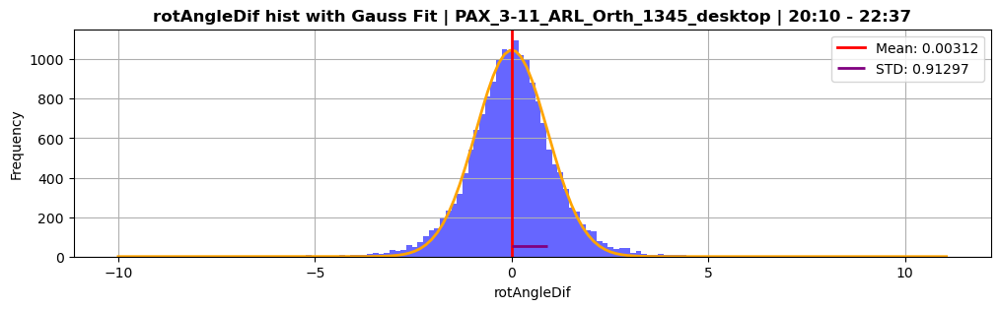




Time range: min=13210.39, max=22049.137
Using "resetting reference SOPs" approach with threshold = 10.0 degrees
Averaging rotAngle using 5 rolling points
Reference matrix was reset 28 times
----- Gauss fit params | PAX_3-11_ARL_Orth_1345_desktop | 22:37 - 01:04 -----
	mu = 0.01587 ± 0.00851
	sigma = 1.15924 ± 0.00851
	A = 824.47792 ± 5.24394
-----------------------------------------------------------


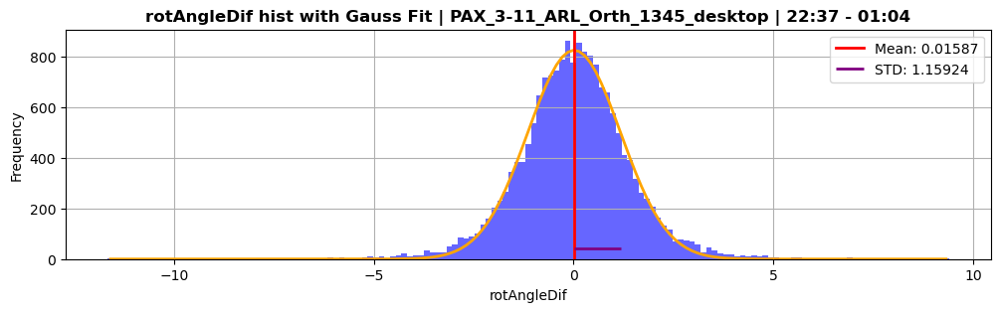




Time range: min=22049.152, max=30954.769


/mnt/c/Users/2020n/Documents/Career/Locations/Britton Lab/QWDM_Project/F1_Code/PolRepo/data_manager/switch.py:461: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  jump_fig_iter, (jump_ax1_iter, jump_ax2_iter) = plt.subplots(1,2,figsize=(12,2))


Using "resetting reference SOPs" approach with threshold = 10.0 degrees
Averaging rotAngle using 5 rolling points
Reference matrix was reset 12 times
----- Gauss fit params | PAX_3-11_ARL_Orth_1345_desktop | 01:04 - 03:32 -----
	mu = 0.00267 ± 0.00561
	sigma = 0.80869 ± 0.00561
	A = 867.20018 ± 5.21319
-----------------------------------------------------------


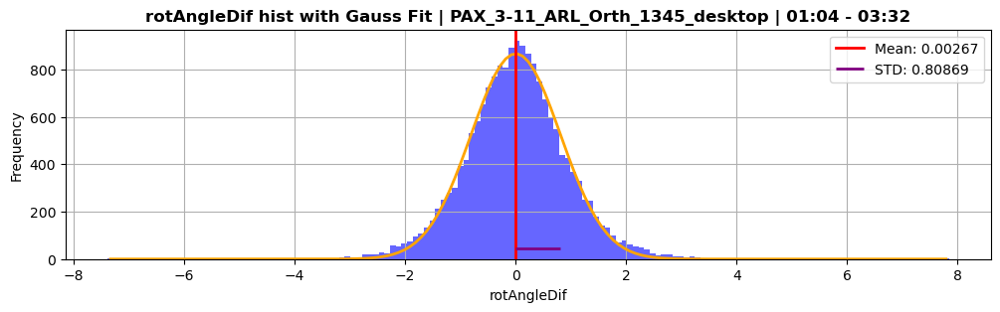




Time range: min=30954.801, max=39895.562
Using "resetting reference SOPs" approach with threshold = 10.0 degrees
Averaging rotAngle using 5 rolling points
Reference matrix was reset 819 times
----- Gauss fit params | PAX_3-11_ARL_Orth_1345_desktop | 03:32 - 06:01 -----
	mu = 0.15097 ± 0.03086
	sigma = 2.33399 ± 0.03086
	A = 773.45436 ± 8.85744
-----------------------------------------------------------


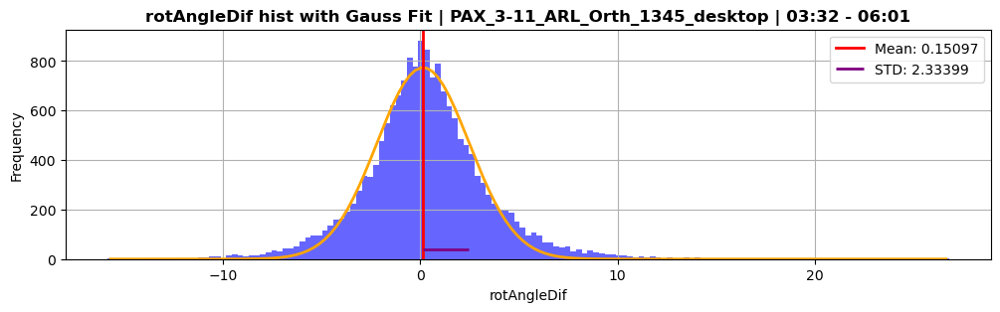




Time range: min=39895.592, max=48431.137
Using "resetting reference SOPs" approach with threshold = 10.0 degrees
Averaging rotAngle using 5 rolling points
Reference matrix was reset 575 times
----- Gauss fit params | PAX_3-11_ARL_Orth_1345_desktop | 06:01 - 08:24 -----
	mu = 0.14132 ± 0.02258
	sigma = -2.20313 ± 0.02258
	A = 888.84169 ± 7.88756
-----------------------------------------------------------


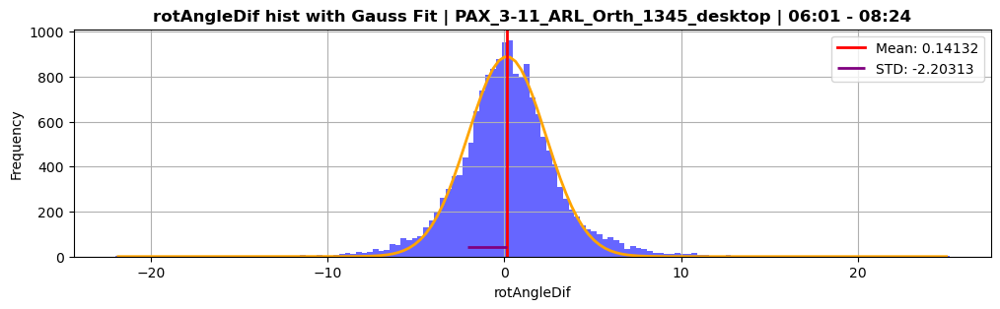




Time range: min=48431.155, max=57350.727
Using "resetting reference SOPs" approach with threshold = 10.0 degrees
Averaging rotAngle using 5 rolling points
Reference matrix was reset 5309 times
----- Gauss fit params | PAX_3-11_ARL_Orth_1345_desktop | 08:24 - 10:52 -----
	mu = 0.60690 ± 0.04190
	sigma = 3.74931 ± 0.04190
	A = 489.19136 ± 4.73437
-----------------------------------------------------------


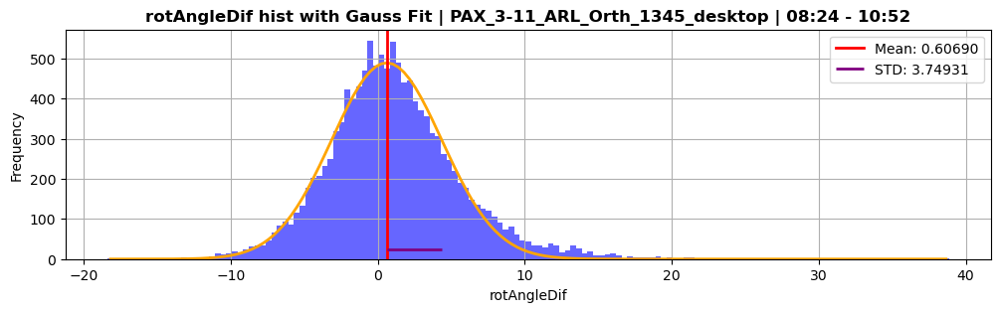




Time range: min=57350.745, max=65764.444
Using "resetting reference SOPs" approach with threshold = 10.0 degrees
Averaging rotAngle using 5 rolling points
Reference matrix was reset 11162 times
----- Gauss fit params | PAX_3-11_ARL_Orth_1345_desktop | 10:52 - 13:13 -----
	mu = 2.60339 ± 0.08044
	sigma = -5.76780 ± 0.08044
	A = 171.65342 ± 2.07324
-----------------------------------------------------------


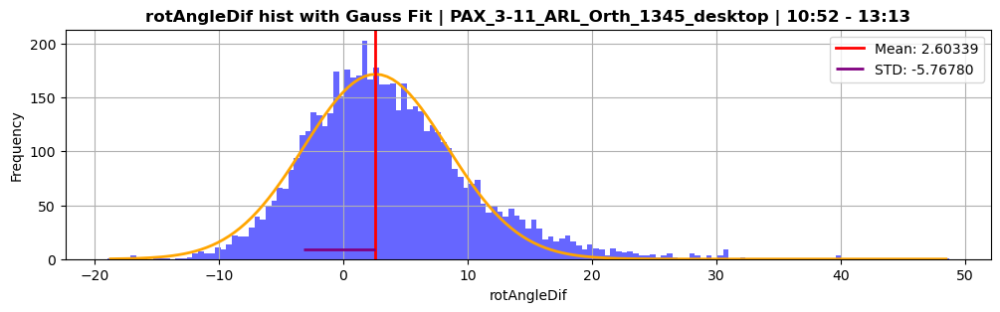




Time range: min=65764.472, max=73027.189
Using "resetting reference SOPs" approach with threshold = 10.0 degrees
Averaging rotAngle using 5 rolling points
Reference matrix was reset 11265 times
----- Gauss fit params | PAX_3-11_ARL_Orth_1345_desktop | 13:13 - 15:14 -----
	mu = 4.20084 ± 0.10982
	sigma = -6.49026 ± 0.10991
	A = 86.77027 ± 1.27167
-----------------------------------------------------------


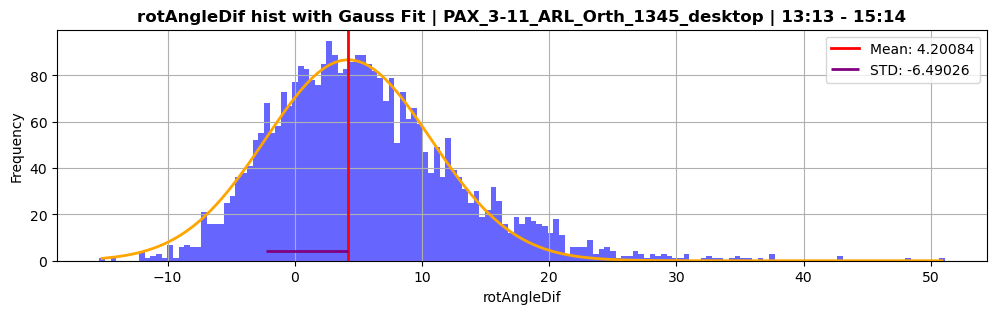




Time range: min=73027.201, max=81756.255
Using "resetting reference SOPs" approach with threshold = 10.0 degrees
Averaging rotAngle using 5 rolling points
Reference matrix was reset 9153 times
----- Gauss fit params | PAX_3-11_ARL_Orth_1345_desktop | 15:14 - 17:39 -----
	mu = 0.99406 ± 0.07019
	sigma = 4.36143 ± 0.07019
	A = 442.52231 ± 6.16772
-----------------------------------------------------------


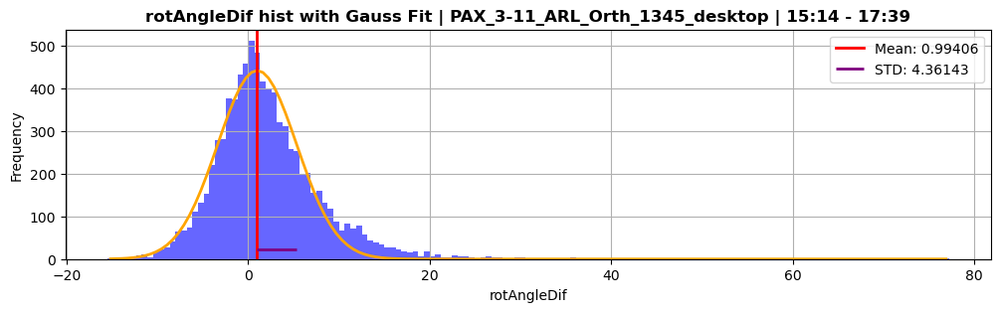

In [18]:
filename_1345 = DATA + 'Whole_setup/24-03-11/PAX_3-11_ARL_Orth_1345_desktop.csv'
filename_1560 = DATA + 'Whole_setup/24-03-11/PAX_3-11_ARL_Orth_1560_laptop.csv'
#ds_1345 = SwitchSet(filename, set_range=(0,0.04), skip_default_signal_baseline=25)
length = 0.1
start = 0.05
params_list = []
while start+length <= 1.0:
    ds_1345 = SwitchSet(filename_1345, set_range=(start, start+length), skip_default_signal_baseline=25)
    ds_1345.find_switches(nominal_switch_rate=2, print_process=False)
    ds_1345.average_data(print_process=False)
    reset_times_1345 = ds_1345.calc_stokes_ptf(reference=None, angle_threshold_deg=10, reset_by_rolling=True, rolling_pts=5, print_process=False);

    params_list.append(ptr_walk_hist(ds_1345,bins=150))
    print('\n\n')

    start += length

In [19]:
parameter_names = ['mu', 'sigma', 'A']
print(BOLD_ON + '----- sigma from Gauss fit -----' + BOLD_OFF)
for (title, time_str, popt, perr) in params_list:
    print(f"{time_str} | {parameter_names[1]} = {popt[1]:.5f} ± {perr[1]:.5f}")
print(BOLD_ON + '---------------------------------\n\n' + BOLD_OFF)

----- sigma from Gauss fit -----
20:10 - 22:37 | sigma = 0.91297 ± 0.00632
22:37 - 01:04 | sigma = 1.15924 ± 0.00851
01:04 - 03:32 | sigma = 0.80869 ± 0.00561
03:32 - 06:01 | sigma = 2.33399 ± 0.03086
06:01 - 08:24 | sigma = -2.20313 ± 0.02258
08:24 - 10:52 | sigma = 3.74931 ± 0.04190
10:52 - 13:13 | sigma = -5.76780 ± 0.08044
13:13 - 15:14 | sigma = -6.49026 ± 0.10991
15:14 - 17:39 | sigma = 4.36143 ± 0.07019
---------------------------------




In [20]:
parameter_names = ['mu', 'sigma', 'A']
print(BOLD_ON + '----- mu from Gauss fit -----' + BOLD_OFF)
for (title, time_str, popt, perr) in params_list:
    print(f"{time_str} | {parameter_names[0]} = {popt[0]:.5f} ± {perr[0]:.5f}")
print(BOLD_ON + '---------------------------------\n\n' + BOLD_OFF)

----- mu from Gauss fit -----
20:10 - 22:37 | mu = 0.00312 ± 0.00632
22:37 - 01:04 | mu = 0.01587 ± 0.00851
01:04 - 03:32 | mu = 0.00267 ± 0.00561
03:32 - 06:01 | mu = 0.15097 ± 0.03086
06:01 - 08:24 | mu = 0.14132 ± 0.02258
08:24 - 10:52 | mu = 0.60690 ± 0.04190
10:52 - 13:13 | mu = 2.60339 ± 0.08044
13:13 - 15:14 | mu = 4.20084 ± 0.10982
15:14 - 17:39 | mu = 0.99406 ± 0.07019
---------------------------------




### Testing

In [22]:
ds_1345.df

,TimeElapsed,TimeDiff,IsJump,IsSwitch,IsValidPoint,IsStartPoint,IsEndPoint,Timestamp,s1,s2,...,Azimuth,Ellipticity,DOP,DOCP,DOLP,Power,Power_pol,Power_unpol,Power_split_ratio,Phase_difference
0,73027.201,0.000,False,False,False,False,False,2024-03-12 15:14:02.910,0.17,-0.40,...,-33.32,31.93,99.20,89.06,43.69,0.01171,0.01161,0.000093,0.59,114.24
1,73027.218,0.017,False,False,False,False,False,2024-03-12 15:14:02.920,0.22,-0.42,...,-31.22,30.71,100.49,88.25,48.07,0.01149,0.01155,-0.000057,0.61,115.78
2,73027.239,0.021,False,False,False,False,False,2024-03-12 15:14:02.950,0.24,-0.41,...,-29.60,30.80,100.70,88.58,47.90,0.01134,0.01142,-0.000079,0.62,114.91
3,73027.245,0.006,False,False,False,False,False,2024-03-12 15:14:02.950,0.22,-0.41,...,-30.64,31.15,99.57,88.16,46.28,0.01151,0.01146,0.000050,0.61,114.72
4,73027.256,0.011,True,False,False,False,False,2024-03-12 15:14:02.960,0.24,-0.48,...,-31.42,28.86,100.47,84.94,53.66,0.01166,0.01172,-0.000055,0.62,119.34
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
532429,81756.192,0.015,False,False,False,False,False,2024-03-12 17:39:31.900,0.78,0.16,...,5.63,-18.70,99.14,60.22,78.76,0.01174,0.01163,0.000101,0.89,-75.68
532430,81756.209,0.017,False,False,False,False,False,2024-03-12 17:39:31.920,0.04,0.30,...,41.63,-36.22,101.47,96.74,30.62,0.01078,0.01094,-0.000159,0.52,-72.55
532431,81756.223,0.014,False,False,False,False,False,2024-03-12 17:39:31.930,-0.39,-0.07,...,-85.08,-33.28,99.26,91.07,39.47,0.01145,0.01136,0.000085,0.30,-94.23
532432,81756.239,0.016,False,False,False,False,False,2024-03-12 17:39:31.950,-0.38,0.00,...,-89.67,-33.81,99.26,91.78,37.80,0.01130,0.01121,0.000084,0.31,-90.27


### Hist double

1345 -> 18:56 - 18:56

    * 86400 seconds

1560 -> 19:57 - 19:57

    * 86400 seconds

Times probably messed up because of daylight savings??

In [15]:
plt.ioff()
plt.close('all')

In [16]:
# filename = DATA + 'Whole_setup/24-03-11/PAX_3-11_ARL_Orth_1345_desktop.csv'
# ds_test = Dataset(filename,set_range=(0,0.01),skip_default_signal_baseline=False)

In [17]:
# ds_test.plot_raw(plot_param="S1",sample_range=(0,30))

In [34]:
filename_1345 = DATA + 'Whole_setup/24-03-11/PAX_3-11_ARL_Orth_1345_desktop.csv'
filename_1560 = DATA + 'Whole_setup/24-03-11/PAX_3-11_ARL_Orth_1560_laptop.csv'
start = 0.0
length = 0.05

ds_1345 = SwitchSet(filename_1345, set_range=(start, start+length), skip_default_signal_baseline=25)
ds_1345.find_switches(nominal_switch_rate=2, print_process=False)
ds_1345.average_data(print_process=False)
reset_times_1345 = ds_1345.calc_stokes_ptf(reference=None, angle_threshold_deg=10, reset_by_rolling=True, rolling_pts=5, print_process=False);

ds_1560 = SwitchSet(filename_1560, set_range=(start, start+length), skip_default_signal_baseline=25)
ds_1560.find_switches(nominal_switch_rate=2, print_process=False)
ds_1560.average_data(print_process=False)
reset_times_1560 = ds_1560.calc_stokes_ptf(reference=reset_times_1345, rolling_pts=5, print_process=False);

ds_arl_24_03_11 = (ds_1345, ds_1560)

Time range: min=25.006, max=4403.407
Using "resetting reference SOPs" approach with threshold = 10.0 degrees
Averaging rotAngle using 5 rolling points
Reference matrix was reset 16 times
Time range: min=25.009, max=4558.952
Using provided reset times to reset reference matrix
Averaging rotAngle using 5 rolling points
Reference matrix was reset 16 times


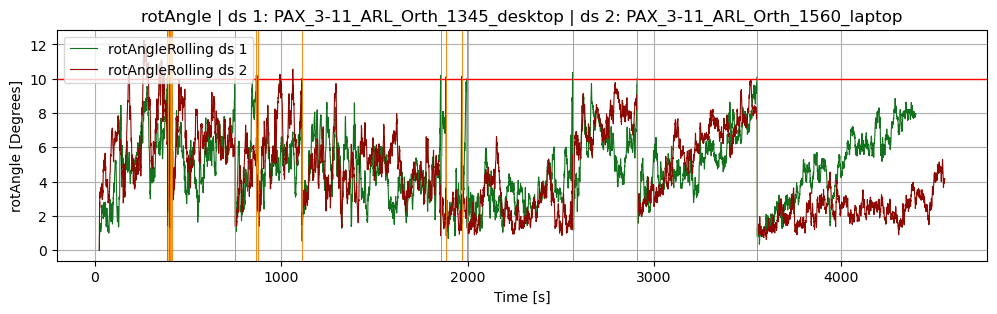

In [35]:
plot_rot_angle(ds_arl_24_03_11[0], ds_arl_24_03_11[1], birds_eye=True, plot_raw=False)

In [ ]:
hist_data = ds_1345.stokes_ptf_df['rotAngleDif'].dropna()
hist_data

In [42]:
df = ds_1345.stokes_ptf_df
df = df[(df['EstTime'] < 30.0) & (df['EstTime'] > 27.0)]
df['rotAngleDif'].dropna()

4    0.278511
5   -0.006595
6    0.111570
7   -0.406197
8    0.203316
9    1.716313
Name: rotAngleDif, dtype: float64

In [ ]:
params_list_1345 = []
params_list_1560 = []
while start+length <= 1.0:
    fig, ax = plt.subplots(figsize=(12, 3))
    params_list_1345.append(ptr_walk_hist_double(ds_1345,fig,ax,'blue',bins=150))

    

    params_list_1560.append(ptr_walk_hist_double(ds_1560,fig,ax,'blue',bins=150))
    
    
    
    ax.set_title('rotAngleDif hist with Gauss Fit | {:s} | {:s}'.format(ds_switch.title, time_str), fontweight='bold')
    ax.set_xlabel('rotAngleDif')
    ax.set_ylabel('Frequency')
    ax.legend()
    ax.grid(True)
    
    display(fig); plt.close(fig)
    print('\n\n')

    start += length

In [19]:
parameter_names = ['mu', 'sigma', 'A']
print(BOLD_ON + '----- sigma from Gauss fit -----' + BOLD_OFF)
for (title, time_str, popt, perr) in params_list:
    print(f"{time_str} | {parameter_names[1]} = {popt[1]:.5f} ± {perr[1]:.5f}")
print(BOLD_ON + '---------------------------------\n\n' + BOLD_OFF)

----- sigma from Gauss fit -----
20:10 - 22:37 | sigma = 0.91297 ± 0.00632
22:37 - 01:04 | sigma = 1.15924 ± 0.00851
01:04 - 03:32 | sigma = 0.80869 ± 0.00561
03:32 - 06:01 | sigma = 2.33399 ± 0.03086
06:01 - 08:24 | sigma = -2.20313 ± 0.02258
08:24 - 10:52 | sigma = 3.74931 ± 0.04190
10:52 - 13:13 | sigma = -5.76780 ± 0.08044
13:13 - 15:14 | sigma = -6.49026 ± 0.10991
15:14 - 17:39 | sigma = 4.36143 ± 0.07019
---------------------------------




In [20]:
parameter_names = ['mu', 'sigma', 'A']
print(BOLD_ON + '----- mu from Gauss fit -----' + BOLD_OFF)
for (title, time_str, popt, perr) in params_list:
    print(f"{time_str} | {parameter_names[0]} = {popt[0]:.5f} ± {perr[0]:.5f}")
print(BOLD_ON + '---------------------------------\n\n' + BOLD_OFF)

----- mu from Gauss fit -----
20:10 - 22:37 | mu = 0.00312 ± 0.00632
22:37 - 01:04 | mu = 0.01587 ± 0.00851
01:04 - 03:32 | mu = 0.00267 ± 0.00561
03:32 - 06:01 | mu = 0.15097 ± 0.03086
06:01 - 08:24 | mu = 0.14132 ± 0.02258
08:24 - 10:52 | mu = 0.60690 ± 0.04190
10:52 - 13:13 | mu = 2.60339 ± 0.08044
13:13 - 15:14 | mu = 4.20084 ± 0.10982
15:14 - 17:39 | mu = 0.99406 ± 0.07019
---------------------------------




## ADev

### First ADev

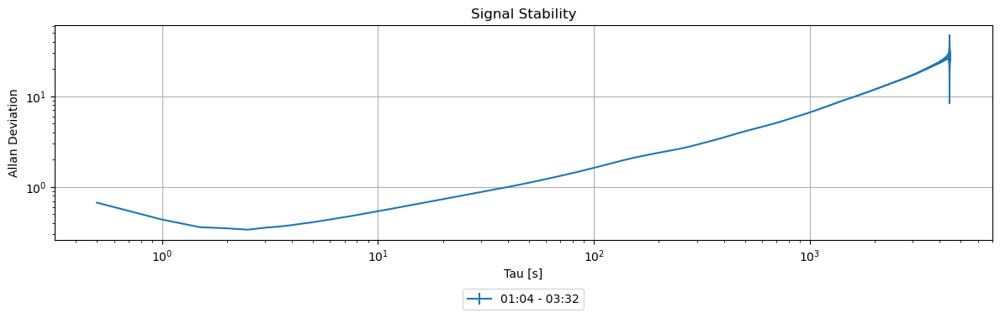

In [77]:
dif_data = ds_1345.stokes_ptf_df['rotAngleDif'].dropna()
walk_data = np.cumsum(dif_data)
meas_rate = 1/(2*ds_1345.switch_time)
elm = allantools.oadev(walk_data.values, rate = meas_rate, taus='all', data_type="freq")
params_arr=[]
params_arr.append((*elm,Dataset.gen_time_str(ds_1345.df)))
plot_adev(params_arr)

### ADev over time of day 24-03-11

In [47]:
plt.ioff()
plt.close('all')

In [51]:
filename = DATA + 'Whole_setup/24-03-11/PAX_3-11_ARL_Orth_1345_desktop.csv'
#ds_1345 = SwitchSet(filename, set_range=(0,0.04), skip_default_signal_baseline=25)
length = 0.1
start = 0.05
params_arr = []
while start+length <= 1.0:
    ds_1345 = SwitchSet(filename, set_range=(start, start+length), skip_default_signal_baseline=25)
    ds_1345.find_switches(nominal_switch_rate=2, print_process=False)

    ds_1345.average_data(print_process=False)

    reset_times_1345 = ds_1345.calc_stokes_ptf(reference=None, angle_threshold_deg=10, reset_by_rolling=True, rolling_pts=5, print_process=False);

    dif_data = ds_1345.stokes_ptf_df['rotAngleDif'].dropna()
    walk_data = np.cumsum(dif_data)
    meas_rate = 1/(2*ds_1345.switch_time)
    elm = allantools.oadev(walk_data.values, rate = meas_rate, taus='all', data_type="freq")
    params_arr.append((*elm,Dataset.gen_time_str(ds_1345.df)))

    start += length

Time range: min=4403.407, max=13210.364
Using "resetting reference SOPs" approach with threshold = 10.0 degrees
Averaging rotAngle using 5 rolling points
Reference matrix was reset 9 times
Time range: min=13210.39, max=22049.137


/mnt/c/Users/2020n/Documents/Career/Locations/Britton Lab/QWDM_Project/F1_Code/PolRepo/data_manager/switch.py:461: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  jump_fig_iter, (jump_ax1_iter, jump_ax2_iter) = plt.subplots(1,2,figsize=(12,2))


Using "resetting reference SOPs" approach with threshold = 10.0 degrees
Averaging rotAngle using 5 rolling points
Reference matrix was reset 28 times
Time range: min=22049.152, max=30954.769
Using "resetting reference SOPs" approach with threshold = 10.0 degrees
Averaging rotAngle using 5 rolling points
Reference matrix was reset 12 times
Time range: min=30954.801, max=39895.562
Using "resetting reference SOPs" approach with threshold = 10.0 degrees
Averaging rotAngle using 5 rolling points
Reference matrix was reset 819 times
Time range: min=39895.592, max=48431.137
Using "resetting reference SOPs" approach with threshold = 10.0 degrees
Averaging rotAngle using 5 rolling points
Reference matrix was reset 575 times
Time range: min=48431.155, max=57350.727
Using "resetting reference SOPs" approach with threshold = 10.0 degrees
Averaging rotAngle using 5 rolling points
Reference matrix was reset 5309 times
Time range: min=57350.745, max=65764.444
Using "resetting reference SOPs" approach

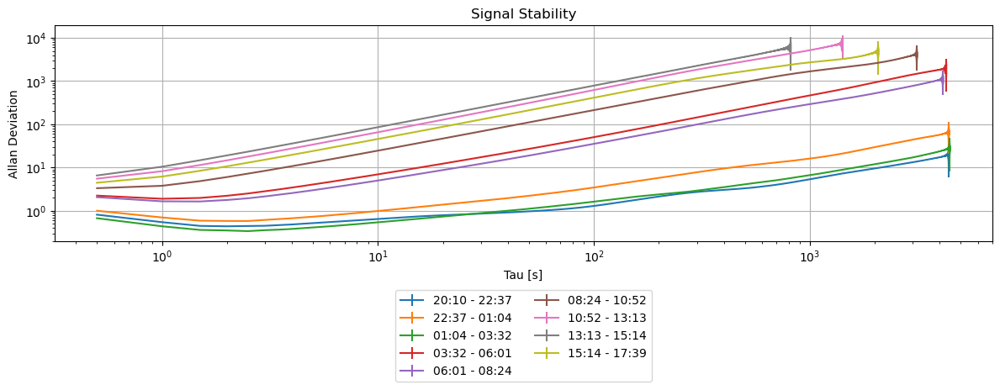

In [52]:
plot_adev(params_arr)

### Slope of ADev 24-03-13

#### 24-03-13 and pickling datasets

##### 1345 dataset

In [20]:
filename = DATA + 'Whole_setup/24-03-13/PAX_3-13_ARL_Orth_1345_desktop.csv'

In [21]:
ds_1345 = SwitchSet(filename, skip_default_signal_baseline=25)
ds_1345.find_switches(nominal_switch_rate=2, print_process=False)
ds_1345.average_data(print_process=False)

Time range: min=25.014, max=15672.311


In [ ]:
reset_times_1345 = ds_1345.calc_stokes_ptf(reference=None, angle_threshold_deg=5, reset_by_rolling=True, rolling_pts=5, print_process=False);

In [9]:
ds_1345.plot_separated(plot_param='rotAngle')

<Figure size 1200x300 with 1 Axes>

In [45]:
# Save object
picklename = DATA + 'Whole_setup/24-03-13/PAX_3-13_ARL_Orth_1345_desktop.pkl'
with open(picklename, 'wb') as output:
    pickle.dump(ds_1345, output, pickle.HIGHEST_PROTOCOL)

In [40]:
# Load object
with open(picklename, 'rb') as input:
    ds_1345 = pickle.load(input)

In [41]:
dif_data = ds_1345.stokes_ptf_df['rotAngleDif'].dropna()
walk_data = np.cumsum(dif_data)
meas_rate = 1/(2*ds_1345.switch_time)
elm = allantools.oadev(walk_data.values, rate = meas_rate, taus='all', data_type="freq")
set_title = ds_1345.title
time = Dataset.gen_time_str(ds_1345.df)

In [42]:
P.fit_adev(*elm, set_title, time)

##### 1560 dataset

In [5]:
filename = DATA + 'Whole_setup/24-03-13/PAX_3-13_ARL_Orth_1560_laptop.csv'
ds_1560 = SwitchSet(filename, skip_default_signal_baseline=25)
ds_1560.find_switches(nominal_switch_rate=2, print_process=False)
ds_1560.average_data(print_process=False)
reset_times_1560 = ds_1560.calc_stokes_ptf(reference=None, angle_threshold_deg=5, reset_by_rolling=True, rolling_pts=5, print_process=False);

Time range: min=25.015, max=15673.522
Using "resetting reference SOPs" approach with threshold = 5.0 degrees
Averaging rotAngle using 5 rolling points
Reference matrix was reset 51 times


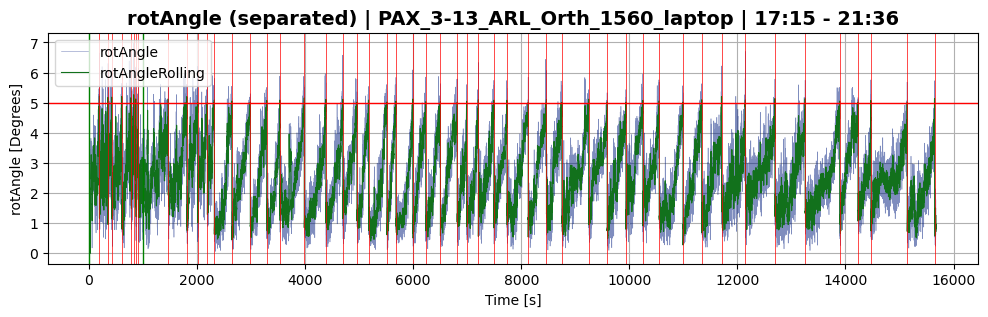

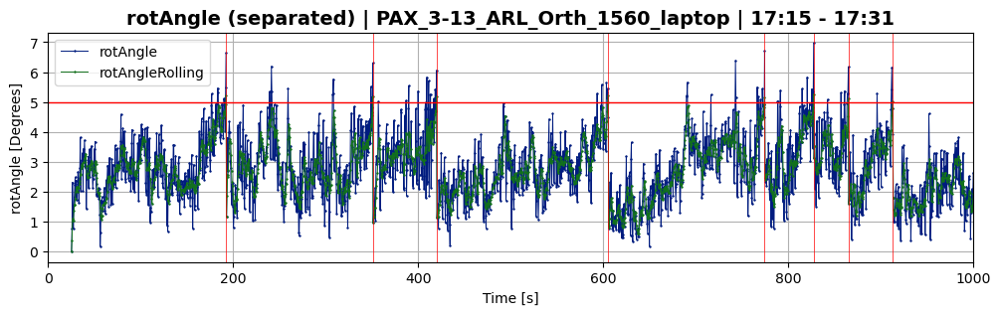

In [12]:
ds_1560.plot_separated(plot_param='rotAngle', sample_range=(0,1000))

In [7]:
# Save object
picklename = DATA + 'Whole_setup/24-03-13/PAX_3-13_ARL_Orth_1560_laptop.pkl'
with open(picklename, 'wb') as output:
    pickle.dump(ds_1560, output, pickle.HIGHEST_PROTOCOL)

In [96]:
# Load object
picklename = DATA + 'Whole_setup/24-03-13/PAX_3-13_ARL_Orth_1560_laptop.pkl'
with open(picklename, 'rb') as input:
    ds_1560 = pickle.load(input)

In [7]:
dif_data = self.stokes_ptf_df_slice['rotAngleDif'].dropna()
walk_data = np.cumsum(dif_data)
meas_rate = 1/(2*self.switch_time)
elm = allantools.oadev(walk_data.values, rate = meas_rate, taus='all', data_type="freq")
set_title = self.title
time = Dataset.gen_time_str(ds_1560.df)
params = (*elm, set_title, time)

In [15]:
P.fit_adev(*elm, set_title, time)

In [97]:
params_arr = ds_1560.calc_adev_divided()
P.plot_adev_color(params_arr)

#### 24-03-14 1345nm

In [5]:
filename = DATA + 'Whole_setup/24-03-14/PAX_3-14_ARL_Orth_1345_desktop.csv'
ds_1345 = SwitchSet(filename, set_range=(0.95,1.0), skip_default_signal_baseline=25)
ds_1345.find_switches(nominal_switch_rate=2, print_process=False)
ds_1345.average_data(print_process=False)
reset_times_1345 = ds_1345.calc_stokes_ptf(reference=None, angle_threshold_deg=5, reset_by_rolling=True, rolling_pts=5, print_process=False);

Time range: min=57911.443, max=61024.279
Using "resetting reference SOPs" approach with threshold = 5.0 degrees
Averaging rotAngle using 5 rolling points
Reference matrix was reset 39 times


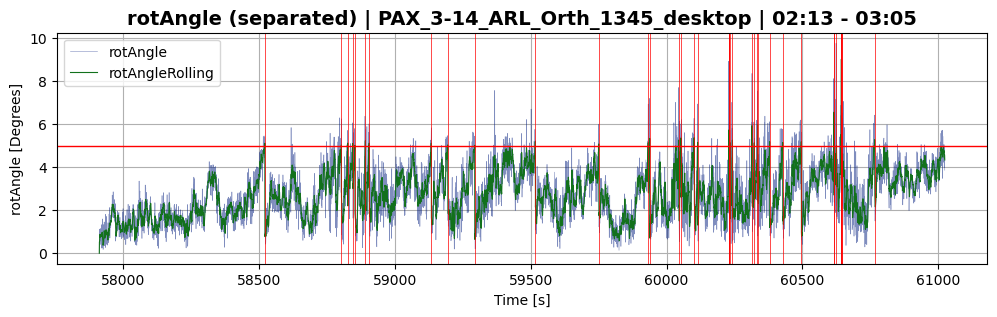

In [13]:
ds_1345.plot_separated(plot_param='rotAngle')

In [7]:
dif_data = ds_1345.stokes_ptf_df['rotAngleDif'].dropna()
walk_data = np.cumsum(dif_data)
meas_rate = 1/(2*ds_1345.switch_time)
elm = allantools.oadev(walk_data.values, rate = meas_rate, taus='all', data_type="freq")
set_title = ds_1345.title
time = Dataset.gen_time_str(ds_1345.df)

In [12]:
#%matplotlib tk
P.fit_adev(*elm, set_title, time)

#### 24-03-14 1560nm over time of day

In [25]:
filename = DATA + 'Whole_setup/24-03-14/PAX_3-14_ARL_Orth_1560_laptop.csv'
#ds_1345 = SwitchSet(filename, set_range=(0,0.04), skip_default_signal_baseline=25)
length = 0.05
start = 0.0
ds_arr = []
while start+length <= 1.01:
    print(BOLD_ON + "\nStarting {} range".format((start, start+length)) + BOLD_OFF)
    ds_1345 = SwitchSet(filename, set_range=(start, start+length), skip_default_signal_baseline=25)
    ds_1345.find_switches(nominal_switch_rate=2, print_process=False)
    ds_1345.average_data(print_process=False)
    reset_times_1345 = ds_1345.calc_stokes_ptf(reference=None, angle_threshold_deg=5, reset_by_rolling=True, rolling_pts=5, print_process=False);

    set_title = ds_1345.title
    time = Dataset.gen_time_str(ds_1345.df)
    entry = (ds_1345, set_title, time)
    ds_arr.append(entry)

    start += length
    plt.close('all')


Starting (0.0, 0.05) range
Time range: min=25.006, max=4922.984
Using "resetting reference SOPs" approach with threshold = 5.0 degrees
Averaging rotAngle using 5 rolling points
Reference matrix was reset 955 times

Starting (0.05, 0.1) range
Time range: min=4922.984, max=9394.238
Using "resetting reference SOPs" approach with threshold = 5.0 degrees
Averaging rotAngle using 5 rolling points
Reference matrix was reset 1686 times

Starting (0.1, 0.15000000000000002) range
Time range: min=9394.257, max=13893.567
Using "resetting reference SOPs" approach with threshold = 5.0 degrees
Averaging rotAngle using 5 rolling points
Reference matrix was reset 2208 times

Starting (0.15000000000000002, 0.2) range
Time range: min=13893.579, max=18400.3
Using "resetting reference SOPs" approach with threshold = 5.0 degrees
Averaging rotAngle using 5 rolling points
Reference matrix was reset 1926 times

Starting (0.2, 0.25) range
Time range: min=18400.318, max=23248.179
Using "resetting reference SOPs

/mnt/c/Users/2020n/Documents/Career/Locations/Britton Lab/QWDM_Project/F1_Code/PolRepo/data_manager/switch.py:1005: RuntimeWarning: invalid value encountered in arccos
  angle = np.rad2deg(np.arccos((np.trace(rotation_matrix)-1)/2))


Reference matrix was reset 11 times

Starting (0.39999999999999997, 0.44999999999999996) range
Time range: min=37677.227, max=42115.762
Using "resetting reference SOPs" approach with threshold = 5.0 degrees
Averaging rotAngle using 5 rolling points
Reference matrix was reset 7 times

Starting (0.44999999999999996, 0.49999999999999994) range
Time range: min=42115.768, max=47387.845
Using "resetting reference SOPs" approach with threshold = 5.0 degrees
Averaging rotAngle using 5 rolling points
Reference matrix was reset 4 times

Starting (0.49999999999999994, 0.5499999999999999) range
Time range: min=47387.861, max=52487.672
Using "resetting reference SOPs" approach with threshold = 5.0 degrees
Averaging rotAngle using 5 rolling points
Reference matrix was reset 74 times

Starting (0.5499999999999999, 0.6) range
Time range: min=52487.697, max=56991.897
Using "resetting reference SOPs" approach with threshold = 5.0 degrees
Averaging rotAngle using 5 rolling points
Reference matrix was res

In [26]:
params_arr = []
for ds_1345, set_title, time in ds_arr:
    dif_data = ds_1345.stokes_ptf_df['rotAngleDif'].dropna()
    walk_data = np.cumsum(dif_data)
    meas_rate = 1/(2*ds_1345.switch_time)
    elm = allantools.oadev(walk_data.values, rate = meas_rate, taus='all', data_type="freq")
    params_arr.append((*elm, set_title, time))

In [27]:
P.plot_adev_color(params_arr)

In [77]:
ds_1345, set_title, time = ds_arr[13]
dif_data = ds_1345.stokes_ptf_df['rotAngleDif'].dropna()
walk_data = np.cumsum(dif_data)
meas_rate = 1/(2*ds_1345.switch_time)
elm = allantools.oadev(walk_data.values, rate = meas_rate, taus='all', data_type="freq")

plt.close('all')
P.fit_adev(*elm, set_title, time)

In [76]:
ds_1345, set_title, time = ds_arr[19]
dif_data = ds_1345.stokes_ptf_df['rotAngleDif'].dropna()
walk_data = np.cumsum(dif_data)
meas_rate = 1/(2*ds_1345.switch_time)
elm = allantools.oadev(walk_data.values, rate = meas_rate, taus='all', data_type="freq")

plt.close('all')
P.fit_adev(*elm, set_title, time)

### Dividing dataset into hours of the day

In [5]:
# Load object
filename = DATA + 'Whole_setup/24-03-13/PAX_3-13_ARL_Orth_1345_desktop.csv'
picklename = filename.replace(".csv", ".pkl")
with open(picklename, 'rb') as input:
    ds = pickle.load(input)
params_arr = ds.calc_adev_divided()
P.plot_adev_color(params_arr)

In [5]:
def pickle_dataset(filename, ds, suffix=""):
    picklename = filename.replace(".csv", ".pkl")
    with open(picklename, 'wb') as output:
        pickle.dump(ds, output, pickle.HIGHEST_PROTOCOL)

In [6]:
def unpickle_dataset(filename):
    picklename = filename.replace(".csv", ".pkl")
    with open(picklename, 'rb') as input:
        ds = pickle.load(input)
    return ds

#### Development

In [42]:
ds_1560.stokes_ptf_df.head()

,EstTime,basesMatrix,sig1Stokes,sig2Stokes,axis,rotAngle,angleDif,rotAngleRolling,WasReset,rotAngleDif
0,25.493115,"[[-0.367447599987689, -0.42354022650715867, 0....","[-0.00816811111111111, -0.02017777777777778, -...","[-0.009420555555555555, 0.008078222222222223, ...","[0.0, 0.0, 0.0]",0.000000,90.278257,0.000000,False,NaN
1,25.993123,"[[-0.3612413544641952, -0.41505865257762264, 0...","[-0.008056444444444444, -0.020295555555555553,...","[-0.0092995, 0.00787175, -0.01878625]","[-0.007885769643773372, -0.023835767884682335,...",0.757851,89.958789,0.378926,False,0.757851
2,26.493131,"[[-0.3670288139830269, -0.38759543468409835, 0...","[-0.00813575, -0.020025, -0.004915625]","[-0.008724333333333334, 0.007950333333333334, ...","[0.010624173263512874, -0.078126880429009, -0....",2.313631,89.443219,1.023827,False,1.555780
3,26.993139,"[[-0.36725563566288255, -0.401619690715271, 0....","[-0.008138875, -0.020075, -0.004677375]","[-0.008679, 0.008605166666666665, -0.018588333...","[-0.0007193754041067853, -0.047854894965767406...",1.403796,91.762913,1.118819,False,-0.909835
4,27.493147,"[[-0.3776698987925241, -0.4148583902217146, 0....","[-0.008363375, -0.01999875, -0.004526625]","[-0.009279428571428572, 0.008192714285714286, ...","[-0.00014538980945016922, -0.01010290682441159...",0.768531,90.179529,1.048762,False,-0.635264


In [16]:
ds_1560.df.head()

,TimeElapsed,TimeDiff,IsJump,IsSwitch,IsValidPoint,IsStartPoint,IsEndPoint,Timestamp,s1,s2,...,Azimuth,Ellipticity,DOP,DOCP,DOLP,Power,Power_pol,Power_unpol,Power_split_ratio,Phase_difference
0,25.015,0.000,False,False,False,False,False,2024-03-13 17:15:37.320,-0.37,-0.91,...,-56.17,-5.92,101.53,20.83,99.37,0.02196,0.02229,-0.000336,0.31,-167.23
1,25.030,0.015,False,False,False,False,False,2024-03-13 17:15:37.330,-0.39,-0.90,...,-56.66,-6.36,100.69,22.18,98.22,0.02178,0.02193,-0.000151,0.31,-166.19
2,25.046,0.016,False,False,False,False,False,2024-03-13 17:15:37.350,-0.36,-0.91,...,-55.79,-6.18,98.96,21.20,96.66,0.02263,0.02240,0.000235,0.32,-166.73
3,25.062,0.016,False,False,False,False,False,2024-03-13 17:15:37.370,-0.37,-0.91,...,-55.96,-6.05,100.37,21.05,98.14,0.02255,0.02264,-0.000083,0.32,-166.98
4,25.077,0.015,False,False,False,False,False,2024-03-13 17:15:37.380,-0.36,-0.91,...,-55.90,-6.27,100.13,21.74,97.74,0.02260,0.02263,-0.000030,0.32,-166.53


In [40]:
sections = {}
start_time_elapsed = ds_1560.df.loc[0,'TimeElapsed']
start_dt = ds_1560.df.loc[0,'Timestamp'].to_pydatetime()
next_dt = round_to_next_hour(dt_1)
dif = next_dt-start_dt
dif.total_seconds()

2662.68

In [41]:
start_dt

datetime.datetime(2024, 3, 13, 17, 15, 37, 320000)

In [38]:
dt_next = round_to_next_hour(dt_1)
dt_next

datetime.datetime(2024, 3, 13, 18, 0)

In [30]:
dt = datetime.time(hour=timestamp.hour, minute=timestamp.minute, second=timestamp.second)
dt

datetime.time(17, 15, 37)

In [37]:
def round_to_next_hour(dt):
    # Check if the datetime is already on the hour
    if dt.minute == 0 and dt.second == 0 and dt.microsecond == 0:
        return dt
    else:
        # Increase hour by one and reset minutes, seconds, and microseconds
        # Check if adding one hour shifts the date
        if dt.hour == 23:
            return dt.replace(hour=0, minute=0, second=0, microsecond=0) + datetime.timedelta(days=1)
        else:
            return dt.replace(hour=dt.hour + 1, minute=0, second=0, microsecond=0)

In [75]:
class TimeSeriesData:
    def __init__(self, df, stokes_ptf_df):
        self.df = df
        self.stokes_ptf_df = stokes_ptf_df
    
    def compute_hourly_segments(self):
        # Initialize the dictionary to store the results
        segment_dict = {}

        # Get the initial timestamp from df
        initial_timestamp = self.df['Timestamp'].iloc[0]
        initial_day = 0  # Day starts from 0
        initial_hour = initial_timestamp.hour

        # Calculate the number of seconds from the beginning of the dataset to the start of the first full hour
        seconds_to_first_full_hour = (60 - initial_timestamp.minute) * 60 - initial_timestamp.second
        
        # Iterate over each full hour after the initial time
        start_time = initial_timestamp + pd.Timedelta(seconds=seconds_to_first_full_hour)
        end_time = start_time + pd.Timedelta(hours=1)
        idx = 0

        while end_time <= self.df['Timestamp'].iloc[-1] + pd.Timedelta(hours=1):
            current_day = (start_time - initial_timestamp).days
            current_hour = start_time.hour
            
            # Find indices in df that are within the current hour segment
            mask_df = (self.df['Timestamp'] >= start_time) & (self.df['Timestamp'] < end_time)
            relevant_df = self.df.loc[mask_df]
            
            if not relevant_df.empty:
                # TimeElapsed range
                timestamp_range = (relevant_df['Timestamp'].min(), relevant_df['Timestamp'].max())
                time_elapsed_range = (relevant_df['TimeElapsed'].min(), relevant_df['TimeElapsed'].max())
                df_idx_range = (relevant_df.index.min(), relevant_df.index.max())
                
                # Corresponding indices in stokes_ptf_df
                mask_stokes = (self.stokes_ptf_df['EstTime'] >= time_elapsed_range[0]) & \
                              (self.stokes_ptf_df['EstTime'] <= time_elapsed_range[1])
                relevant_stokes = self.stokes_ptf_df.loc[mask_stokes]
                
                # EstTime range and indices range
                est_time_range = (relevant_stokes['EstTime'].min(), relevant_stokes['EstTime'].max())
                stokes_idx_range = (relevant_stokes.index.min(), relevant_stokes.index.max())

                # Add to dictionary
                segment_dict[(current_day, current_hour)] = {
                    'TimestampRange': timestamp_range,
                    'TimeElapsedRange': time_elapsed_range,
                    'DfIdxRange': df_idx_range,
                    'EstTimeRange': est_time_range,
                    'StokesIdxRange': stokes_idx_range
                }

            # Move to the next hour
            start_time += pd.Timedelta(hours=1)
            end_time += pd.Timedelta(hours=1)
            idx += 1

        self.segment_dict = segment_dict
        return segment_dict

    def print_segment_dict(self):
        for (key, value) in self.segment_dict.items():
            print(key)

    def get_segment_adev(self, key):
        # Retrieve the index range from the segment_dict for the given key
        value_dict = self.segment_dict[key]
        stokes_idx_range = value_dict['StokesIdxRange']
        
        # Slice the stokes_ptf_df dataframe using the retrieved index range
        stokes_ptf_df_slice = self.stokes_ptf_df.iloc[stokes_idx_range[0]:stokes_idx_range[1]+1]

        # Perform the specified operations
        dif_data = stokes_ptf_df_slice['rotAngleDif'].dropna()
        walk_data = np.cumsum(dif_data)
        meas_rate = 1 / (2 * self.switch_time)
        elm = allantools.oadev(walk_data.values, rate=meas_rate, taus='all', data_type="freq")
        timestamp_range = value_dict['TimestampRange']
        time_str_start = timestamp_range[0].strftime('%H:%M')
        time_str_end = timestamp_range[1].strftime('%H:%M')
        time = '{:s} - {:s}'.format(time_str_start,time_str_end)
        set_title = self.title
        
        # Combine all parameters into a tuple
        params = (*elm, set_title, time)
        
        return params

In [76]:
data_processor = TimeSeriesData(ds_1560.df, ds_1560.stokes_ptf_df)
segment_dict = data_processor.compute_hourly_segments()
df_idx_range = segment_dict[(0,18)]['DfIdxRange']
stokes_idx_range = segment_dict[(0,18)]['StokesIdxRange']
stokes_idx_range

(5325, 12524)

In [77]:
data_processor.print_segment_dict()

(0, 18)
(0, 19)
(0, 20)
(0, 21)


In [78]:
params = data_processor.get_segment_adev((0,18))

In [79]:
P.fit_adev(*params)

### Entire pickle and segment adev process (3-13 ARL_2)

#### 1345

In [19]:
filename = DATA + 'Whole_setup/24-03-13/PAX_3-13_ARL_Orth_2_1345_desktop.csv'

In [7]:
ds_1345 = SwitchSet(filename, skip_default_signal_baseline=25)
ds_1345.find_switches(nominal_switch_rate=2, print_process=False)
ds_1345.average_data(print_process=False)
reset_times_1345 = ds_1345.calc_stokes_ptf(reference=None, angle_threshold_deg=5, reset_by_rolling=True, rolling_pts=5, print_process=False);

Time range: min=25.024, max=41916.041
Using "resetting reference SOPs" approach with threshold = 5.0 degrees
Averaging rotAngle using 5 rolling points
Reference matrix was reset 131 times


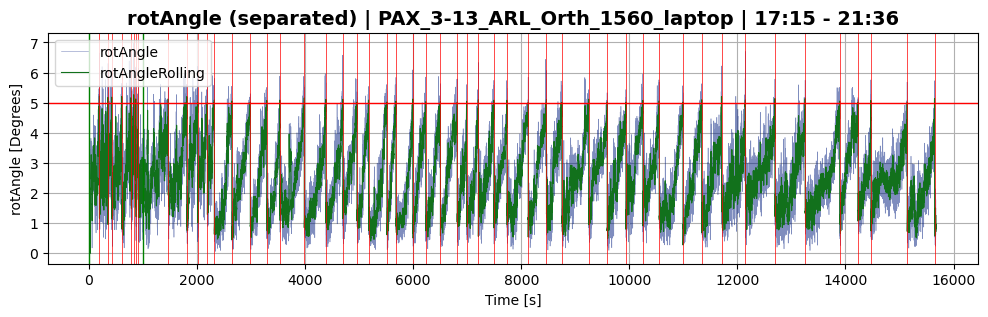

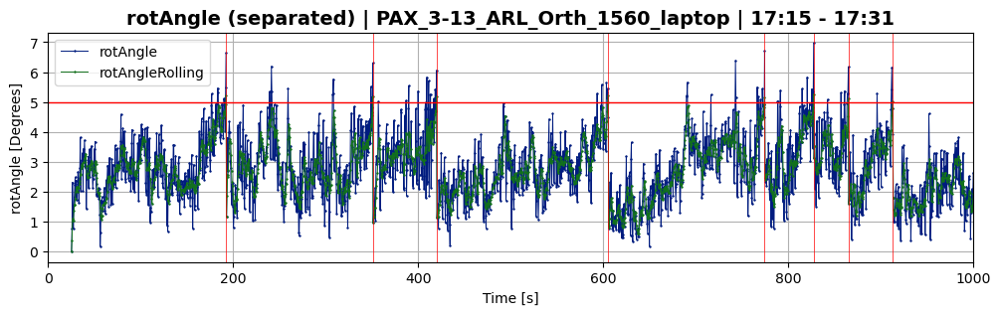

In [12]:
ds_1345.plot_separated(plot_param='rotAngle', sample_range=(0,1000))

In [8]:
pickle_dataset(filename, ds_1345)

NameError: name 'filename' is not defined

In [13]:
ds_1345 = unpickle_dataset(filename)

In [14]:
P.plot_adev_color(ds_1345.calc_adev_divided())

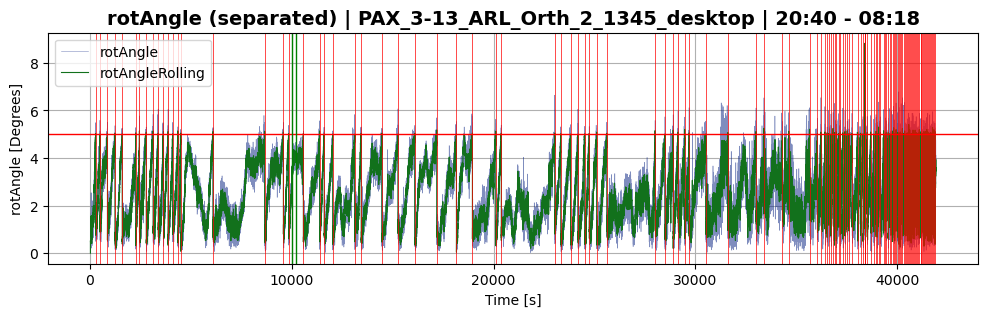

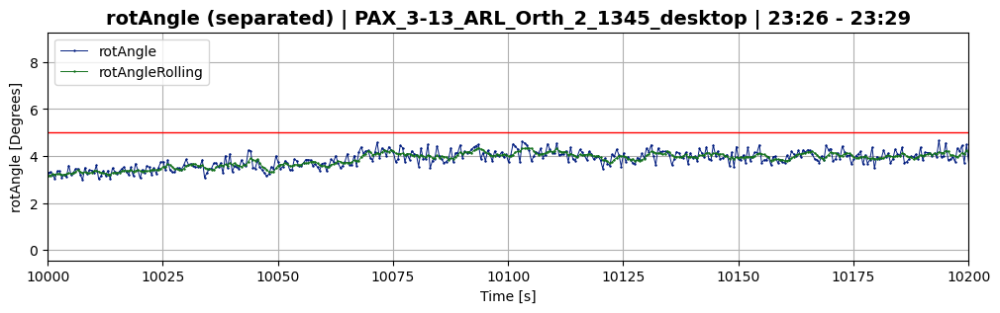

In [18]:
ds_1345.plot_separated(plot_param='rotAngle', sample_range=(10000,10200))

#### 1560

In [12]:
filename = DATA + 'Whole_setup/24-03-13/PAX_3-13_ARL_Orth_2_1560_laptop.csv'

In [13]:
ds_1560 = SwitchSet(filename, skip_default_signal_baseline=25)
ds_1560.find_switches(nominal_switch_rate=2, print_process=False)
ds_1560.average_data(print_process=False)
reset_times_1560 = ds_1560.calc_stokes_ptf(reference=None, angle_threshold_deg=5, reset_by_rolling=True, rolling_pts=5, print_process=False);

Time range: min=25.024, max=48081.451
Using "resetting reference SOPs" approach with threshold = 5.0 degrees
Averaging rotAngle using 5 rolling points
Reference matrix was reset 80197 times


In [20]:
ds_1560.plot_separated(plot_param='rotAngle', sample_range=(0,1000))

KeyboardInterrupt: 

In [21]:
pickle_dataset(filename, ds_1560)

In [13]:
ds_1560 = unpickle_dataset(filename)

In [14]:
P.plot_adev_color(ds_1560.calc_adev_divided())

## Plots for 407 report

### 3-13 ARL_1 1345

#### 3-13 ARL_1 1345 no reset

In [51]:
filename = DATA + 'Whole_setup/24-03-13/PAX_3-13_ARL_Orth_1345_desktop.csv'
picklename = DATA + 'Whole_setup/24-03-13/PAX_3-13_ARL_Orth_1345_desktop_no_reset.pkl'

In [47]:
ds_1345 = SwitchSet(filename, skip_default_signal_baseline=25)
ds_1345.find_switches(nominal_switch_rate=2, print_process=False)
ds_1345.average_data(print_process=False)

Time range: min=25.014, max=15672.311


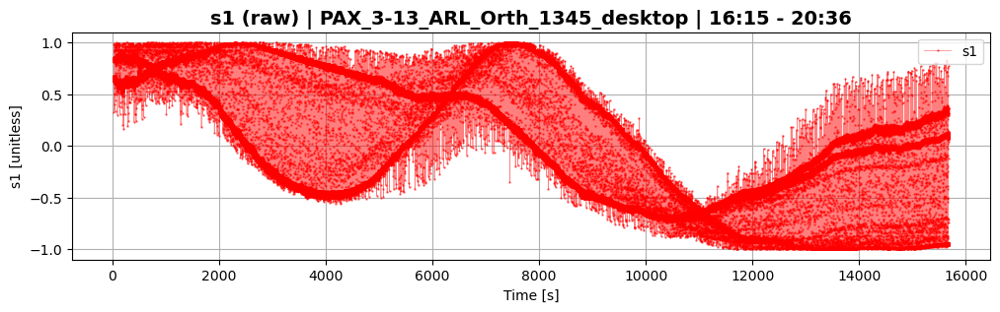

In [48]:
ds_1345.plot_raw()

In [49]:
reset_times_1345 = ds_1345.calc_stokes_ptf(reference="first", print_process=False);

Using first recorded SOPs as reference matrix
Averaging rotAngle using 5 rolling points


In [52]:
with open(picklename, 'wb') as output:
    pickle.dump(ds_1345, output, pickle.HIGHEST_PROTOCOL)

In [53]:
with open(picklename, 'rb') as input:
    ds_1345 = pickle.load(input)

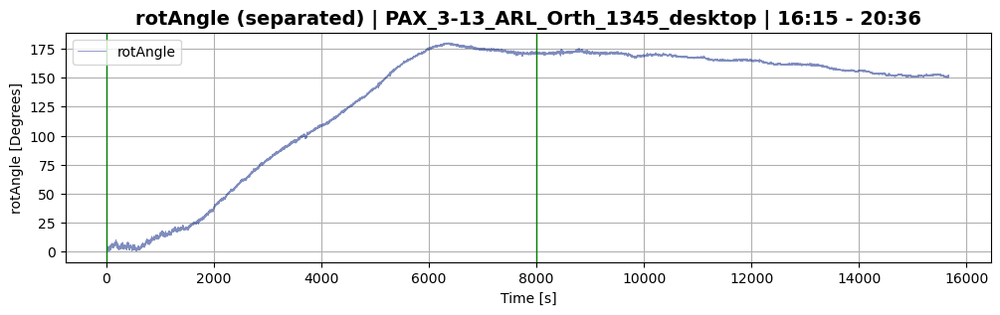

using my alpha


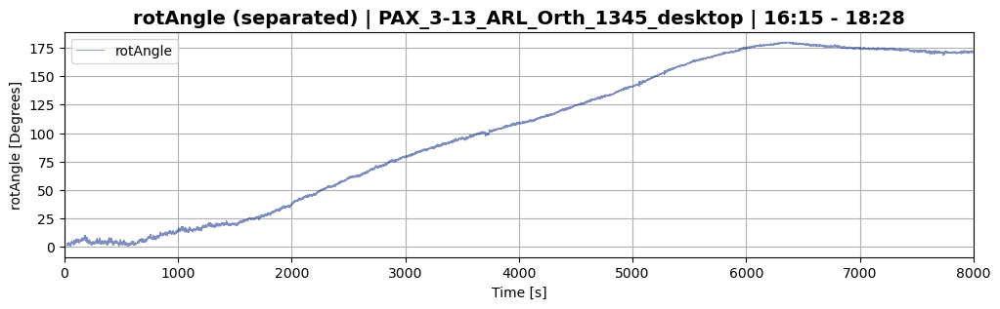

In [54]:
ds_1345.plot_separated(plot_param='rotAngle', sample_range=(0,8000), plot_rolling=False)

#### 3-13 ARL_1 1345 reset 5

In [77]:
filename = DATA + 'Whole_setup/24-03-13/PAX_3-13_ARL_Orth_1345_desktop.csv'
picklename = DATA + 'Whole_setup/24-03-13/PAX_3-13_ARL_Orth_1345_desktop_reset_5.pkl'

In [78]:
ds_1345 = SwitchSet(filename, skip_default_signal_baseline=25)
ds_1345.find_switches(nominal_switch_rate=2, print_process=False)
ds_1345.average_data(print_process=False)

Time range: min=25.014, max=15672.311


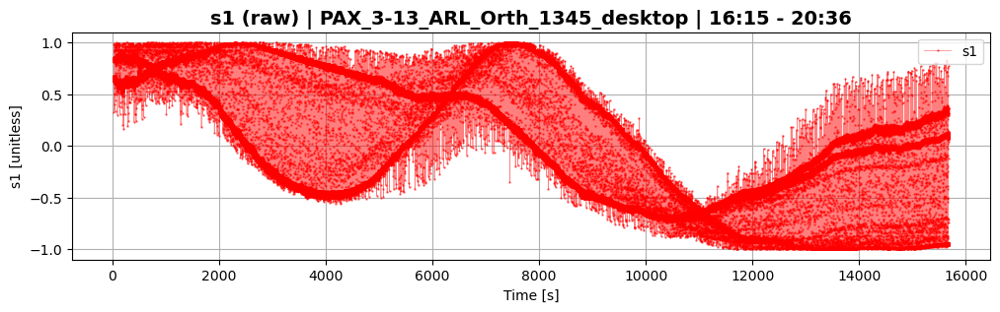

In [79]:
ds_1345.plot_raw()

In [80]:
reset_times_1345 = ds_1345.calc_stokes_ptf(reference=None, angle_threshold_deg=5, reset_by_rolling=True, rolling_pts=5, print_process=False);

Using "resetting reference SOPs" approach with threshold = 5.0 degrees
Averaging rotAngle using 5 rolling points
Reference matrix was reset 101 times


In [26]:
with open(picklename, 'wb') as output:
    pickle.dump(ds_1345, output, pickle.HIGHEST_PROTOCOL)

In [27]:
with open(picklename, 'rb') as input:
    ds_1345 = pickle.load(input)

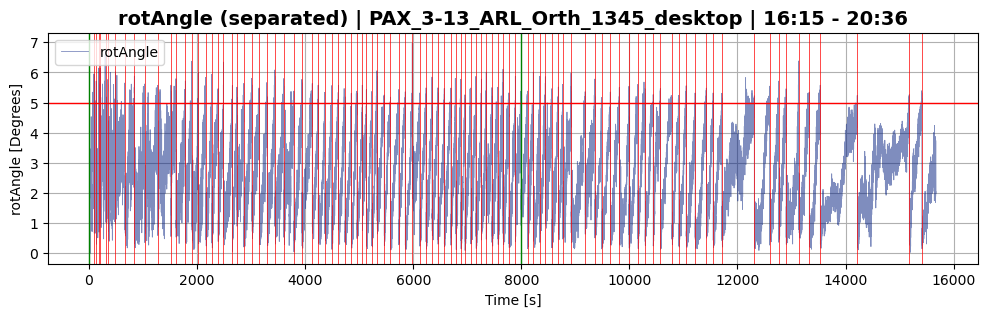

can't invoke "event" command: application has been destroyed
    while executing
"event generate $w <<ThemeChanged>>"
    (procedure "ttk::ThemeChanged" line 6)
    invoked from within
"ttk::ThemeChanged"


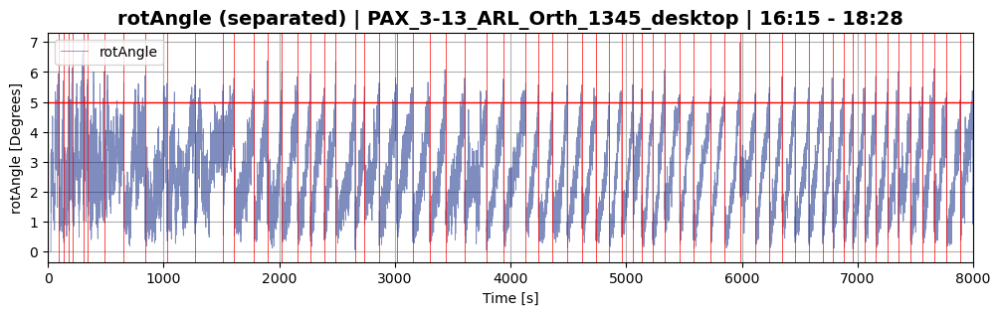

In [81]:
ds_1345.plot_separated(plot_param='rotAngle', sample_range=(0,8000), plot_rolling=False)

PAX_3-13_ARL_Orth_1345_desktop | 16:15 - 20:36
PAX_3-13_ARL_Orth_1345_desktop


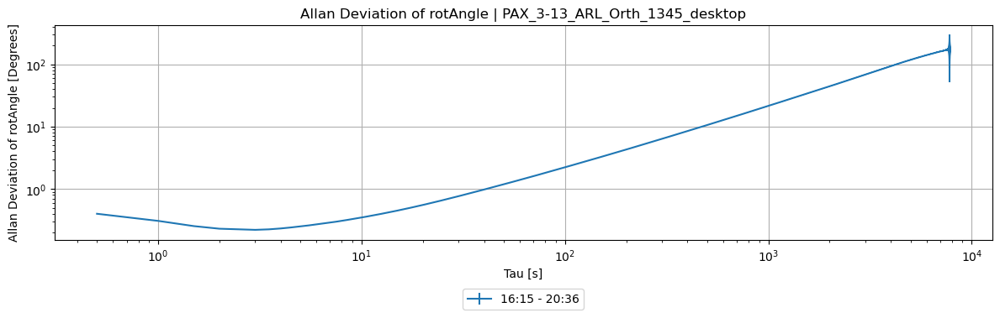

In [92]:
params = ds_1345.get_segment_adev(key=None)
set_title = "{:s} | {:s}".format(params[-2], params[-1])
P.plot_adev([params], set_title=set_title)

In [32]:
P.plot_adev_color(ds_1345.calc_adev_divided(), set_title=ds_1345.title)

### 3-13 ARL_2 1345

#### 3-13 ARL_2 1345 reset 5

In [5]:
filename = DATA + 'Whole_setup/24-03-13/PAX_3-13_ARL_Orth_2_1345_desktop.csv'
picklename = DATA + 'Whole_setup/24-03-13/PAX_3-13_ARL_Orth_2_1345_desktop_reset_5.pkl'

In [94]:
ds_1345 = SwitchSet(filename, skip_default_signal_baseline=25)
ds_1345.find_switches(nominal_switch_rate=2, print_process=False)
ds_1345.average_data(print_process=False)

Time range: min=25.024, max=41916.041


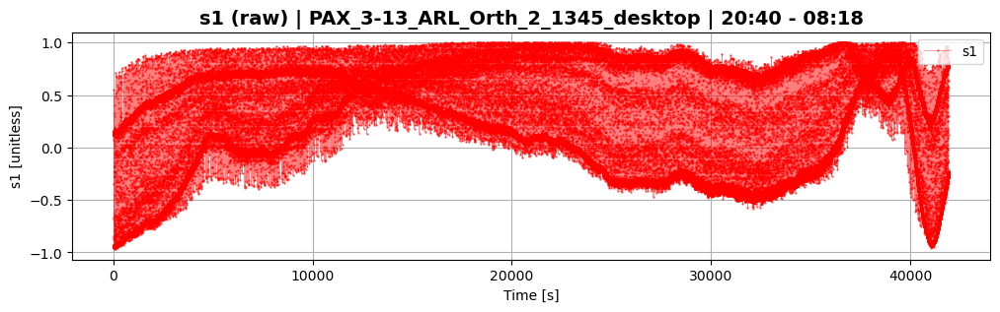

In [95]:
ds_1345.plot_raw()

In [96]:
reset_times_1345 = ds_1345.calc_stokes_ptf(reference=None, angle_threshold_deg=5, reset_by_rolling=True, rolling_pts=5, print_process=False);

Using "resetting reference SOPs" approach with threshold = 5.0 degrees
Averaging rotAngle using 5 rolling points
Reference matrix was reset 131 times


In [99]:
with open(picklename, 'wb') as output:
    pickle.dump(ds_1345, output, pickle.HIGHEST_PROTOCOL)

In [6]:
with open(picklename, 'rb') as my_input:
    ds_1345 = pickle.load(my_input)

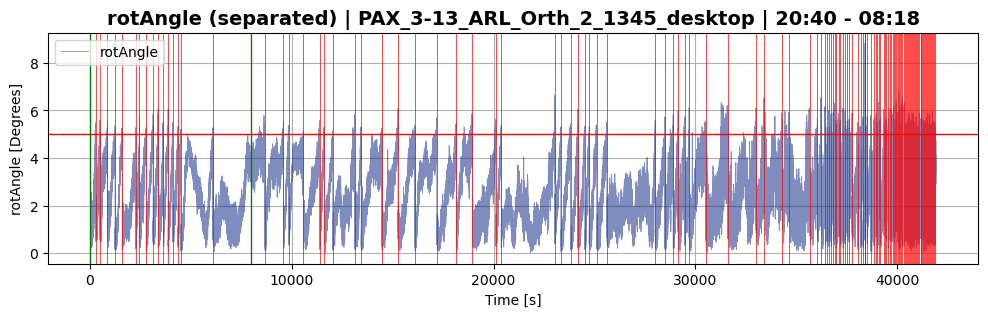

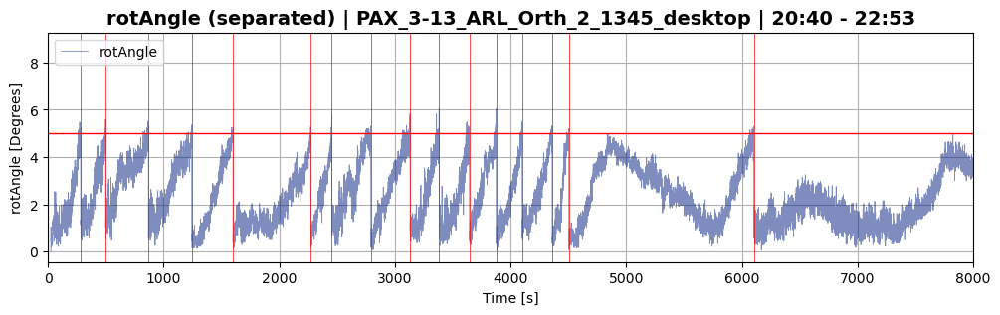

In [7]:
ds_1345.plot_separated(plot_param='rotAngle', sample_range=(0,8000), plot_rolling=False)

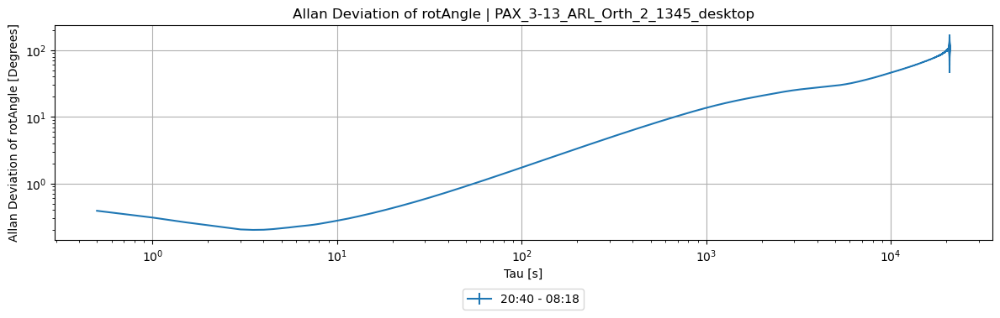

can't invoke "event" command: application has been destroyed
    while executing
"event generate $w <<ThemeChanged>>"
    (procedure "ttk::ThemeChanged" line 6)
    invoked from within
"ttk::ThemeChanged"


In [8]:
params = ds_1345.get_segment_adev(key=None)
set_title = "{:s} | {:s}".format(params[-2], params[-1])
P.plot_adev([params], set_title=set_title)

In [9]:
P.plot_adev_color(ds_1345.calc_adev_divided(), set_title=ds_1345.title)

#### 3-13 ARL_2 1345 nighttime reset 5

In [23]:
filename = DATA + 'Whole_setup/24-03-13/PAX_3-13_ARL_Orth_2_1345_desktop.csv'
picklename = DATA + 'Whole_setup/24-03-13/PAX_3-13_ARL_Orth_2_1345_desktop_nighttime_reset_5.pkl'

In [7]:
ds_1345 = SwitchSet(filename, set_range=(0.3,0.8), skip_default_signal_baseline=25)
ds_1345.find_switches(nominal_switch_rate=2, print_process=False)
ds_1345.average_data(print_process=False)

Time range: min=12501.704, max=33509.741


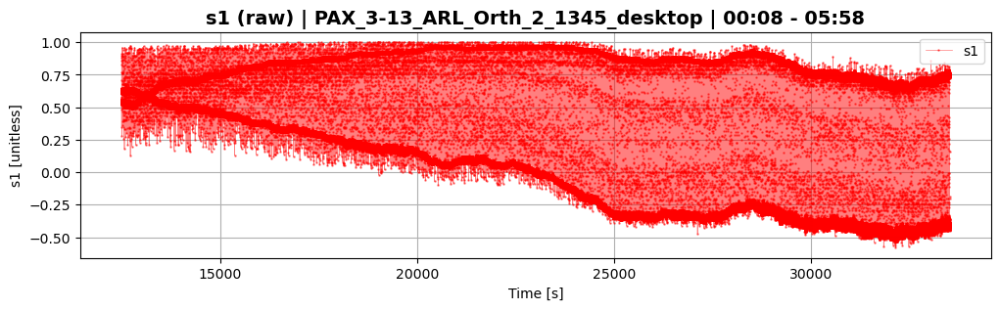

In [8]:
ds_1345.plot_raw()

In [9]:
reset_times_1345 = ds_1345.calc_stokes_ptf(reference=None, angle_threshold_deg=5, reset_by_rolling=True, rolling_pts=5, print_process=False);

Using "resetting reference SOPs" approach with threshold = 5.0 degrees
Averaging rotAngle using 5 rolling points
Reference matrix was reset 28 times


In [24]:
with open(picklename, 'wb') as output:
    pickle.dump(ds_1345, output, pickle.HIGHEST_PROTOCOL)

PicklingError: Can't pickle <class 'data_manager.switch.SwitchSet'>: it's not the same object as data_manager.switch.SwitchSet

In [6]:
with open(picklename, 'rb') as my_input:
    ds_1345 = pickle.load(my_input)

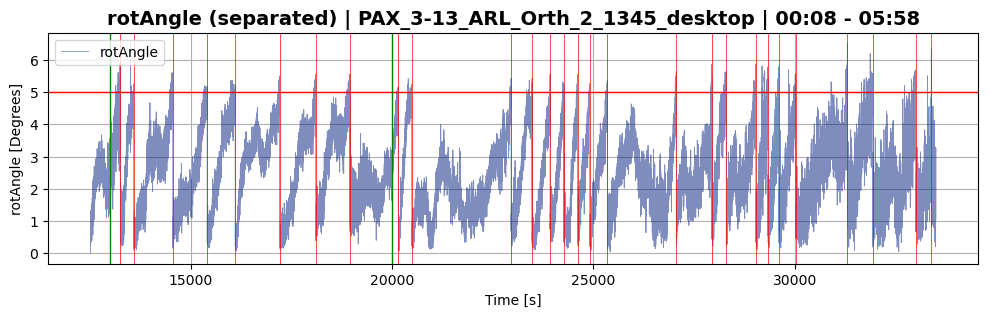

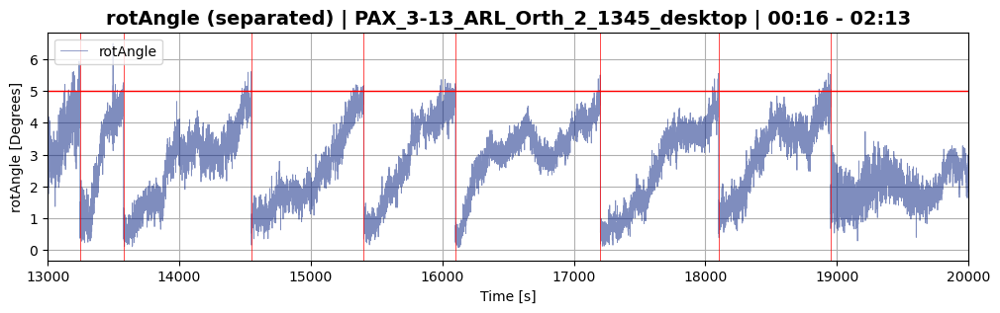

In [11]:
ds_1345.plot_separated(plot_param='rotAngle', sample_range=(13000,20000), plot_rolling=False)

In [22]:
params = ds_1345.get_segment_adev(key=None)
my_title = "{:s} | {:s}".format(params[-2], params[-1])
P.plot_adev([params], plot_title=my_title)

In [9]:
P.plot_adev_color(ds_1345.calc_adev_divided(), set_title=ds_1345.title)

#### 3-13 ARL_2 1345 short reset 5

In [5]:
filename = DATA + 'Whole_setup/24-03-13/PAX_3-13_ARL_Orth_2_1345_desktop.csv'
picklename = DATA + 'Whole_setup/24-03-13/PAX_3-13_ARL_Orth_2_1345_desktop_short.pkl'

In [6]:
ds_1345 = SwitchSet(filename, set_range=(0.4,0.5), skip_default_signal_baseline=25)
ds_1345.find_switches(nominal_switch_rate=2, print_process=False)
ds_1345.average_data(print_process=False)

Time range: min=16677.277, max=20873.317


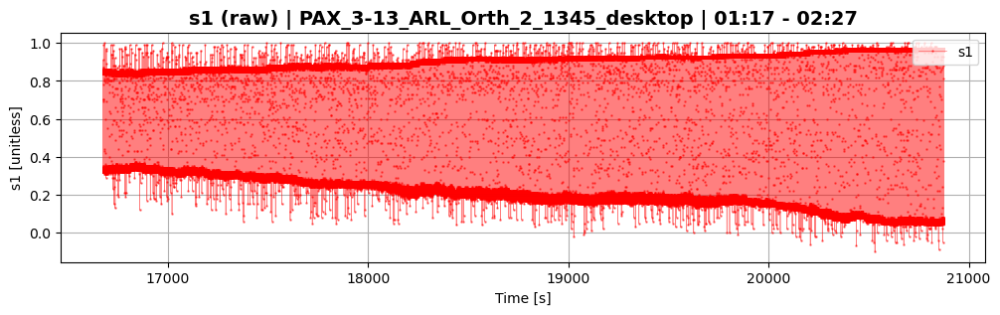

In [7]:
ds_1345.plot_raw()

In [8]:
reset_times_1345 = ds_1345.calc_stokes_ptf(reference=None, angle_threshold_deg=5, reset_by_rolling=True, rolling_pts=5, print_process=False);

Using "resetting reference SOPs" approach with threshold = 5.0 degrees
Averaging rotAngle using 5 rolling points
Reference matrix was reset 4 times


In [14]:
with open(picklename, 'wb') as output:
    pickle.dump(ds_1345, output, pickle.HIGHEST_PROTOCOL)

In [15]:
with open(picklename, 'rb') as my_input:
    ds_1345 = pickle.load(my_input)

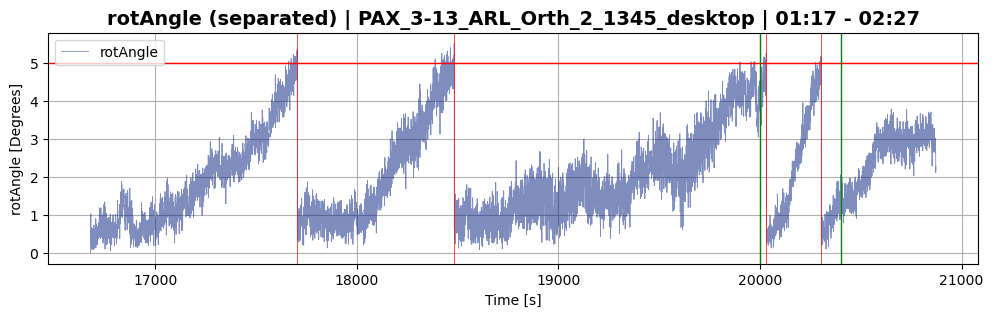

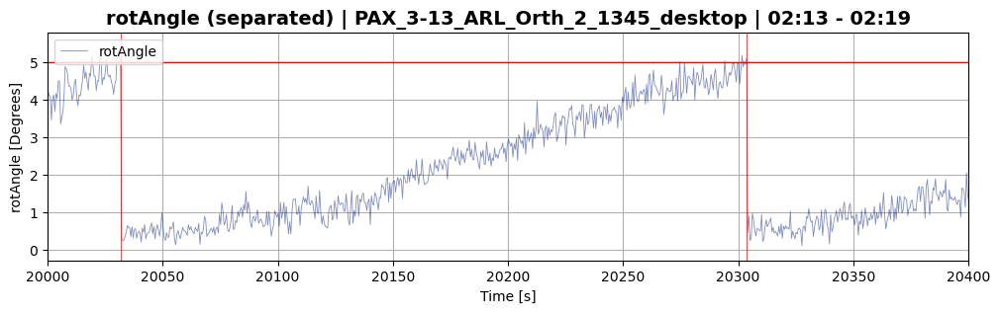

In [16]:
ds_1345.plot_separated(plot_param='rotAngle', sample_range=(20000,20400), plot_rolling=False)

In [17]:
params = ds_1345.get_segment_adev(key=None)
my_title = "{:s} | {:s}".format(params[-2], params[-1])
P.plot_adev([params], plot_title=my_title)

In [9]:
P.plot_adev_color(ds_1345.calc_adev_divided(), set_title=ds_1345.title)

#### 3-13 ARL_2 1345 extra short reset 5

In [18]:
filename = DATA + 'Whole_setup/24-03-13/PAX_3-13_ARL_Orth_2_1345_desktop.csv'
picklename = DATA + 'Whole_setup/24-03-13/PAX_3-13_ARL_Orth_2_1345_desktop_extra_short.pkl'

In [24]:
ds_1345 = SwitchSet(filename, set_range=(0.48,0.49), skip_default_signal_baseline=25)
ds_1345.find_switches(nominal_switch_rate=2, print_process=False)
ds_1345.average_data(print_process=False)

Time range: min=20032.665, max=20453.238


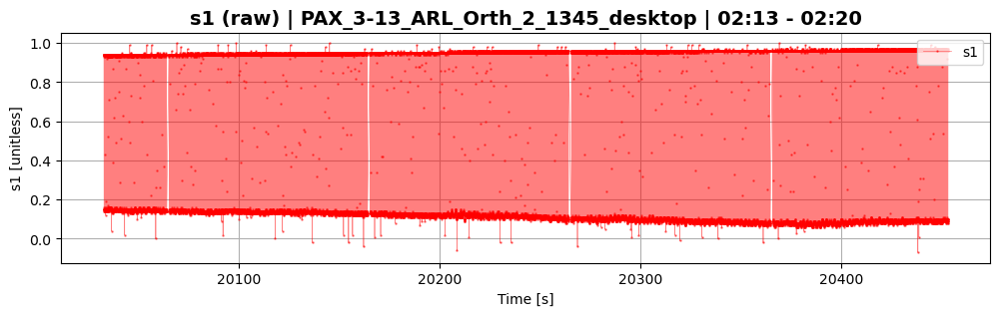

In [25]:
ds_1345.plot_raw()

In [26]:
reset_times_1345 = ds_1345.calc_stokes_ptf(reference=None, angle_threshold_deg=5, reset_by_rolling=True, rolling_pts=5, print_process=False);

Using "resetting reference SOPs" approach with threshold = 5.0 degrees
Averaging rotAngle using 5 rolling points


/mnt/c/Users/2020n/Documents/Career/Locations/Britton Lab/QWDM_Project/F1_Code/PolRepo/data_manager/switch.py:1024: RuntimeWarning: invalid value encountered in arccos
  angle = np.rad2deg(np.arccos((np.trace(rotation_matrix)-1)/2))


Reference matrix was reset 1 times


In [29]:
with open(picklename, 'wb') as output:
    pickle.dump(ds_1345, output, pickle.HIGHEST_PROTOCOL)

In [15]:
with open(picklename, 'rb') as my_input:
    ds_1345 = pickle.load(my_input)

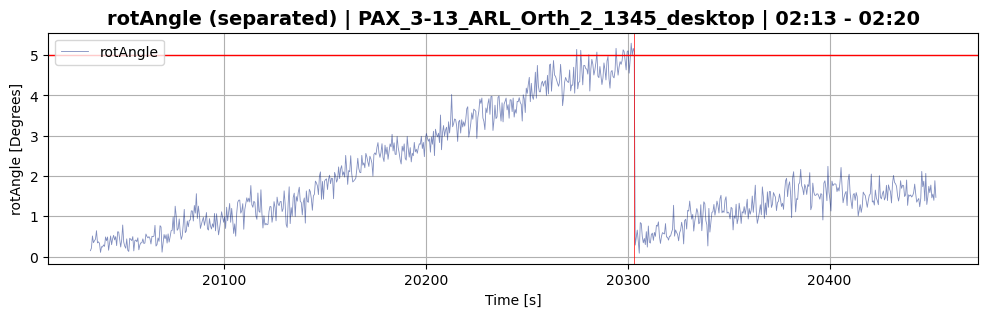

In [27]:
ds_1345.plot_separated(plot_param='rotAngle', sample_range=None, plot_rolling=False)

In [28]:
params = ds_1345.get_segment_adev(key=None)
my_title = "{:s} | {:s}".format(params[-2], params[-1])
P.plot_adev([params], plot_title=my_title)

In [9]:
P.plot_adev_color(ds_1345.calc_adev_divided(), set_title=ds_1345.title)

#### 3-13 ARL_2 1345 daytime reset 5

In [31]:
filename = DATA + 'Whole_setup/24-03-13/PAX_3-13_ARL_Orth_2_1345_desktop.csv'
picklename = DATA + 'Whole_setup/24-03-13/PAX_3-13_ARL_Orth_2_1345_desktop_daytime.pkl'

In [32]:
ds_1345 = SwitchSet(filename, set_range=(0.0,0.1), skip_default_signal_baseline=25)
ds_1345.find_switches(nominal_switch_rate=2, print_process=False)
ds_1345.average_data(print_process=False)

Time range: min=25.024, max=4162.506


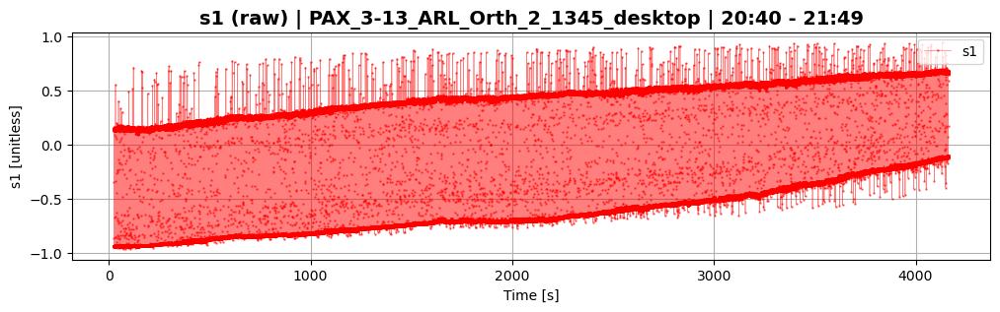

In [33]:
ds_1345.plot_raw()

In [34]:
reset_times_1345 = ds_1345.calc_stokes_ptf(reference=None, angle_threshold_deg=5, reset_by_rolling=True, rolling_pts=5, print_process=False);

Using "resetting reference SOPs" approach with threshold = 5.0 degrees
Averaging rotAngle using 5 rolling points
Reference matrix was reset 13 times


In [37]:
with open(picklename, 'wb') as output:
    pickle.dump(ds_1345, output, pickle.HIGHEST_PROTOCOL)

In [15]:
with open(picklename, 'rb') as my_input:
    ds_1345 = pickle.load(my_input)

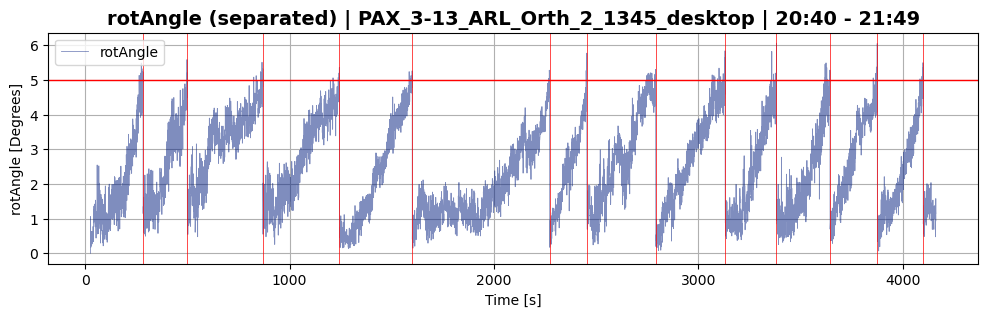

In [35]:
ds_1345.plot_separated(plot_param='rotAngle', sample_range=None, plot_rolling=False)

In [36]:
params = ds_1345.get_segment_adev(key=None)
my_title = "{:s} | {:s}".format(params[-2], params[-1])
P.plot_adev([params], plot_title=my_title)

In [9]:
P.plot_adev_color(ds_1345.calc_adev_divided(), set_title=ds_1345.title)

### 3-14 ARL 1345

#### 3-14 ARL 1345 reset 5

In [41]:
filename = DATA + 'Whole_setup/24-03-14/PAX_3-14_ARL_Orth_1345_desktop.csv'
picklename = DATA + 'Whole_setup/24-03-14/PAX_3-14_ARL_Orth_1345_desktop_reset_5.pkl'

In [42]:
ds_1345 = SwitchSet(filename, skip_default_signal_baseline=25)
ds_1345.find_switches(nominal_switch_rate=2, print_process=False)
ds_1345.average_data(print_process=False)

Time range: min=25.0, max=61024.303


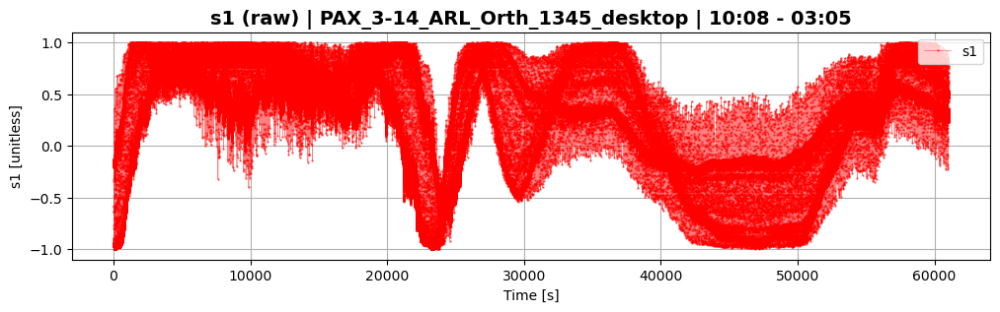

In [43]:
ds_1345.plot_raw()

In [44]:
reset_times_1345 = ds_1345.calc_stokes_ptf(reference=None, angle_threshold_deg=5, reset_by_rolling=True, rolling_pts=5, print_process=False);

Using "resetting reference SOPs" approach with threshold = 5.0 degrees
Averaging rotAngle using 5 rolling points
Reference matrix was reset 8991 times


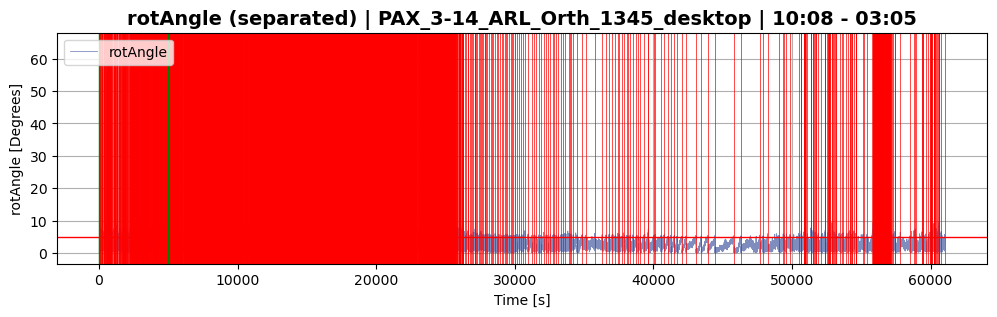

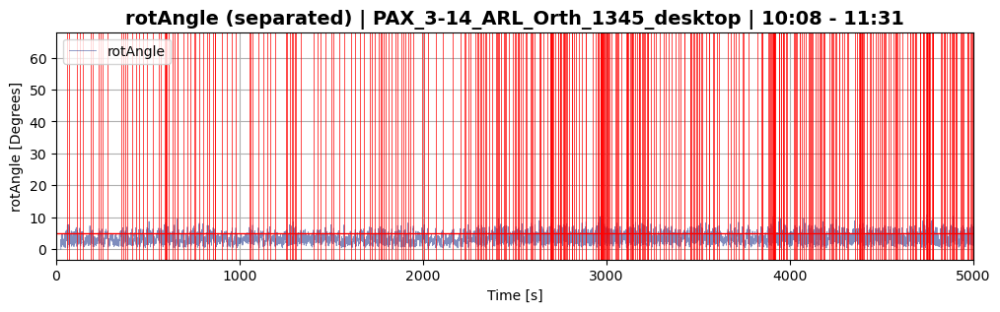

In [50]:
ds_1345.plot_separated(plot_param='rotAngle', sample_range=(0,5000), plot_rolling=False)

In [47]:
params = ds_1345.get_segment_adev(key=None)
set_title = "{:s} | {:s}".format(params[-2], params[-1])
P.plot_adev([params], plot_title=set_title)

In [ ]:
P.plot_adev_color(ds_1345.calc_adev_divided(), set_title=ds_1345.title)

In [48]:
with open(picklename, 'wb') as output:
    pickle.dump(ds_1345, output, pickle.HIGHEST_PROTOCOL)

In [6]:
with open(picklename, 'rb') as my_input:
    ds_1345 = pickle.load(my_input)

#### 3-14 ARL 1345 daytime reset 5

In [52]:
filename = DATA + 'Whole_setup/24-03-14/PAX_3-14_ARL_Orth_1345_desktop.csv'
picklename = DATA + 'Whole_setup/24-03-14/PAX_3-14_ARL_Orth_1345_desktop_daytime.pkl'

In [53]:
ds_1345 = SwitchSet(filename, set_range=(0.0,0.4), skip_default_signal_baseline=25)
ds_1345.find_switches(nominal_switch_rate=2, print_process=False)
ds_1345.average_data(print_process=False)

Time range: min=25.0, max=24313.826


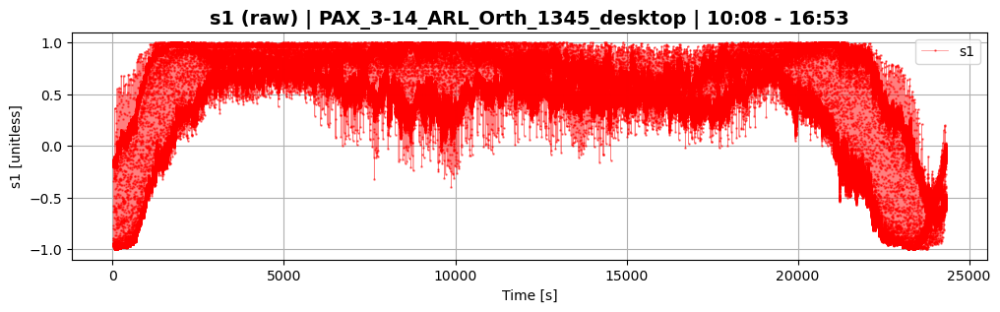

In [54]:
ds_1345.plot_raw()

In [55]:
reset_times_1345 = ds_1345.calc_stokes_ptf(reference=None, angle_threshold_deg=5, reset_by_rolling=True, rolling_pts=5, print_process=False);

Using "resetting reference SOPs" approach with threshold = 5.0 degrees
Averaging rotAngle using 5 rolling points
Reference matrix was reset 7396 times


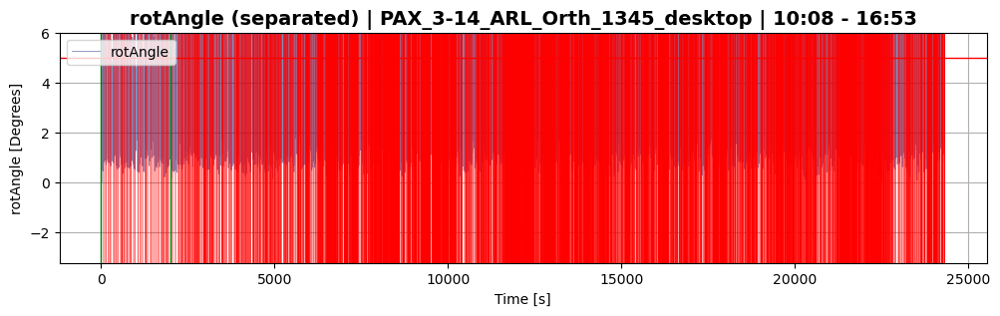

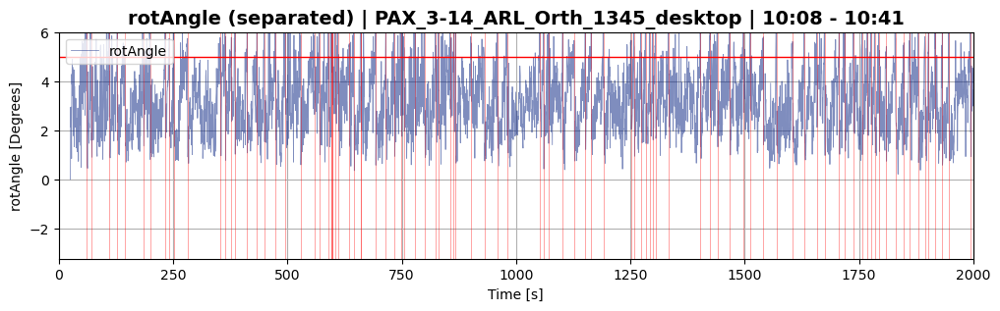

In [59]:
ds_1345.plot_separated(plot_param='rotAngle', sample_range=(0,2000), plot_rolling=False,enforce_ylim=True)

In [60]:
params = ds_1345.get_segment_adev(key=None)
set_title = "{:s} | {:s}".format(params[-2], params[-1])
P.plot_adev([params], plot_title=set_title)

In [ ]:
P.plot_adev_color(ds_1345.calc_adev_divided(), set_title=ds_1345.title)

In [61]:
with open(picklename, 'wb') as output:
    pickle.dump(ds_1345, output, pickle.HIGHEST_PROTOCOL)

In [6]:
with open(picklename, 'rb') as my_input:
    ds_1345 = pickle.load(my_input)